# Load Data

In [2]:
tr = 'C:/Users/Lenovo/Downloads/FitbitTrainDataFixed.csv'
ts = 'C:/Users/Lenovo/Downloads/FitbitTestDataFixed.csv'
import pandas as pd
df_tr = pd.read_csv(tr)
df_ts = pd.read_csv(ts)

In [3]:
X_train = df_tr.drop(columns=['Calories'])
y_train = df_tr['Calories']
X_test = df_ts.drop(columns=['Calories'])
y_test = df_ts['Calories']

# Import Libraries

In [4]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import cross_val_score

In [5]:
from sklearn.metrics import (
    mean_squared_error,
    r2_score,
    mean_absolute_error,
    mean_absolute_percentage_error
)
import matplotlib.pyplot as plt
import time

# Define Function

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import KFold

def evaluate_model(model, model_name):
    start_time = time.time()
    
    # Inisialisasi K-Fold
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    
    rmse_train_list = []
    r2_train_list = []
    mae_train_list = []
    mape_train_list = []
    
    # K-Fold Cross Validation
    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
        
        # Latih model pada lipatan
        model.fit(X_train_fold, y_train_fold)
        y_train_pred = model.predict(X_train_fold)
        y_val_pred = model.predict(X_val_fold)
        
        # Hitung metrik untuk lipatan
        rmse_train_list.append(np.sqrt(mean_squared_error(y_train_fold, y_train_pred)))
        r2_train_list.append(r2_score(y_train_fold, y_train_pred))
        mae_train_list.append(mean_absolute_error(y_train_fold, y_train_pred))
        mape_train_list.append(mean_absolute_percentage_error(y_train_fold, y_train_pred))

    # Rata-rata metrik untuk data latih
    rmse_train = np.mean(rmse_train_list)
    r2_train = np.mean(r2_train_list)
    mae_train = np.mean(mae_train_list)
    mape_train = np.mean(mape_train_list)

    # Latih model dengan semua data latih untuk evaluasi
    model.fit(X_train, y_train)
    
    # Hitung prediksi untuk data uji
    y_test_pred = model.predict(X_test)
    
    # Hitung metrik untuk data uji
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2_test = r2_score(y_test, y_test_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_test_pred)

    # Hitung residual untuk data latih dan data uji
    y_train_pred = model.predict(X_train)  # Prediksi pada seluruh data latih
    residuals_train = y_train - y_train_pred
    residuals_test = y_test - y_test_pred
    mean_residual_train = np.mean(residuals_train)
    mean_residual_test = np.mean(residuals_test)

    plt.figure(figsize=(10, 10))

    # Residuals vs Predicted Values (Train)
    plt.subplot(2, 2, 1)
    plt.scatter(y_train_pred, residuals_train, color='orange', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Train)')
    plt.xlabel('Predicted Values (Train)')
    plt.ylabel('Residuals (Train)')

    # Residuals vs Predicted Values (Test)
    plt.subplot(2, 2, 2)
    plt.scatter(y_test_pred, residuals_test, color='blue', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Test)')
    plt.xlabel('Predicted Values (Test)')
    plt.ylabel('Residuals (Test)')

    # Actual vs Predicted Values (Train)
    plt.subplot(2, 2, 3)
    plt.scatter(y_train, y_train_pred, color='purple', alpha=0.5)
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Train)')
    plt.xlabel('Actual Values (Train)')
    plt.ylabel('Predicted Values (Train)')

    # Actual vs Predicted Values (Test)
    plt.subplot(2, 2, 4)
    plt.scatter(y_test, y_test_pred, color='green', alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Test)')
    plt.xlabel('Actual Values (Test)')
    plt.ylabel('Predicted Values (Test)')

    plt.tight_layout()
    plt.show()

    end_time = time.time()
    training_time = end_time - start_time

    return {
        'Model': model_name,
        'Training Time (s)': training_time,
        'RMSE Train': rmse_train,
        'RMSE Test': rmse_test,
        'R2 Train': r2_train,
        'R2 Test': r2_test,
        'MAE Train': mae_train,
        'MAE Test': mae_test,
        'Mean Residual Train': mean_residual_train,
        'Mean Residual Test': mean_residual_test,
        'MAPE Train': mape_train,
        'MAPE Test': mape_test
    }

results = []


# Dataset without treatment

## Model: Baseline 

### Random Forest

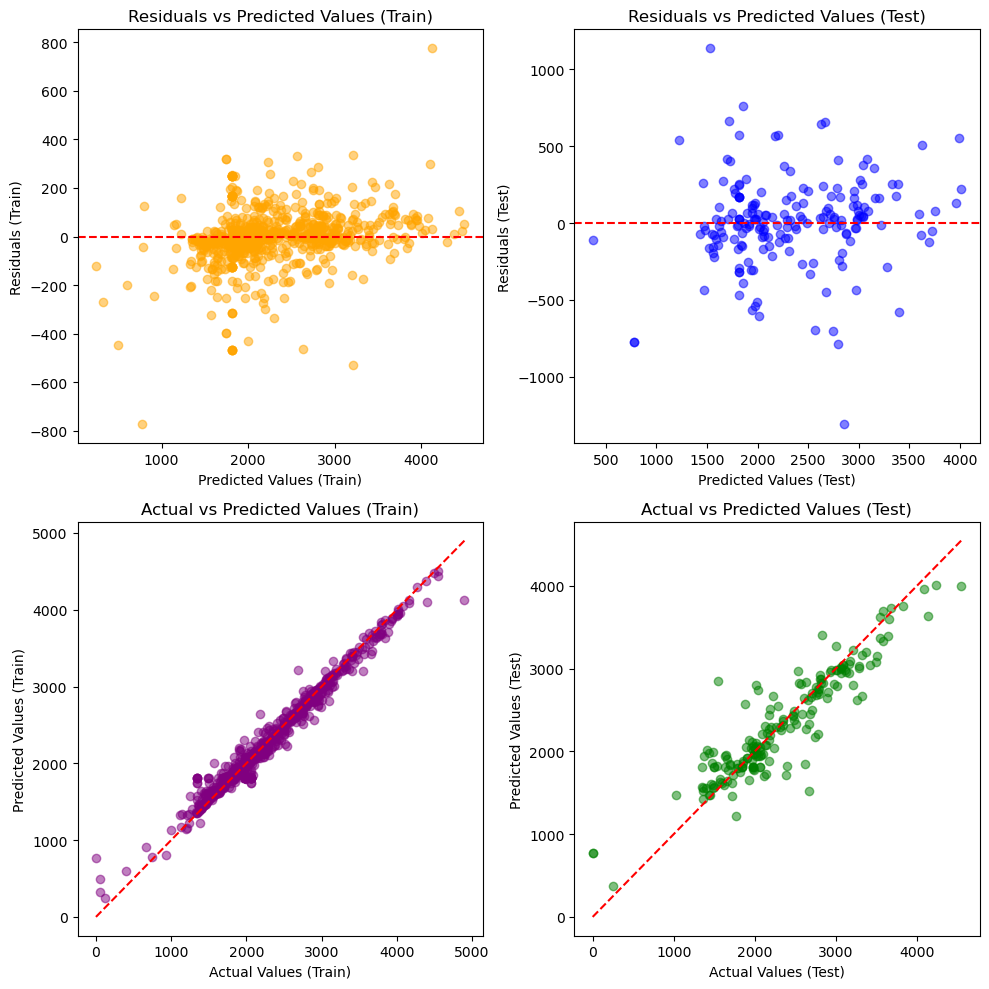

{'Model': 'Random Forest',
 'Training Time (s)': 34.381452322006226,
 'RMSE Train': 123.30909200034644,
 'RMSE Test': 295.67433454234566,
 'R2 Train': 0.9696317472503596,
 'R2 Test': 0.839391011740098,
 'MAE Train': 79.60731782600442,
 'MAE Test': 200.98059459722452,
 'Mean Residual Train': -3.2948323504625034,
 'Mean Residual Test': 7.49861421870388,
 'MAPE Train': 4603120293790011.0,
 'MAPE Test': 3.704546067952569e+16}

In [7]:
rf_results = evaluate_model(RandomForestRegressor(random_state=42), 'Random Forest')
results.append(rf_results)
rf_results

### Linear Regression

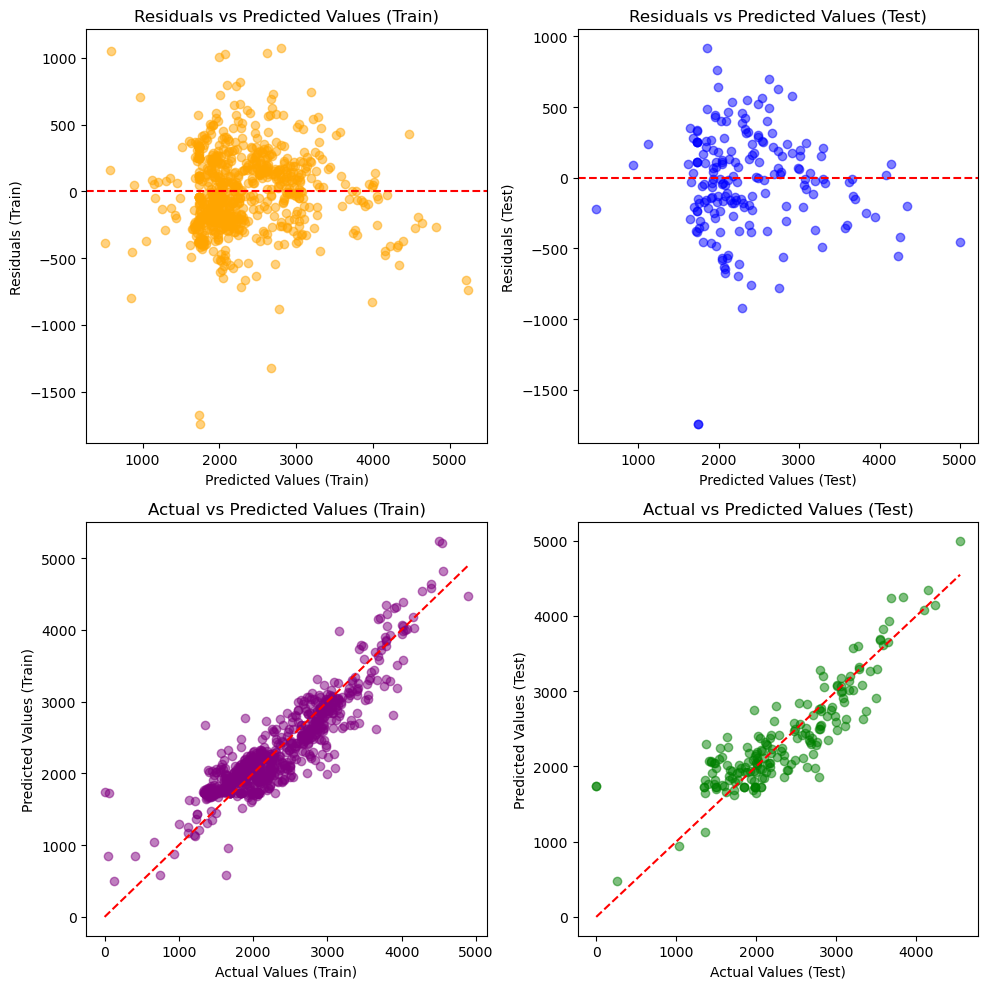

{'Model': 'Linear Regression',
 'Training Time (s)': 9.378129959106445,
 'RMSE Train': 297.7334040580352,
 'RMSE Test': 369.5021579194761,
 'R2 Train': 0.8230551530625861,
 'R2 Test': 0.7491716921360756,
 'MAE Train': 231.73317807042437,
 'MAE Test': 273.10071222966155,
 'Mean Residual Train': -0.0027257044787562658,
 'Mean Residual Test': -31.144999269423604,
 'MAPE Train': 9842636697397210.0,
 'MAPE Test': 8.358817118198699e+16}

In [8]:
lr_results = evaluate_model(LinearRegression(), 'Linear Regression')
results.append(lr_results)
lr_results

### Ridge

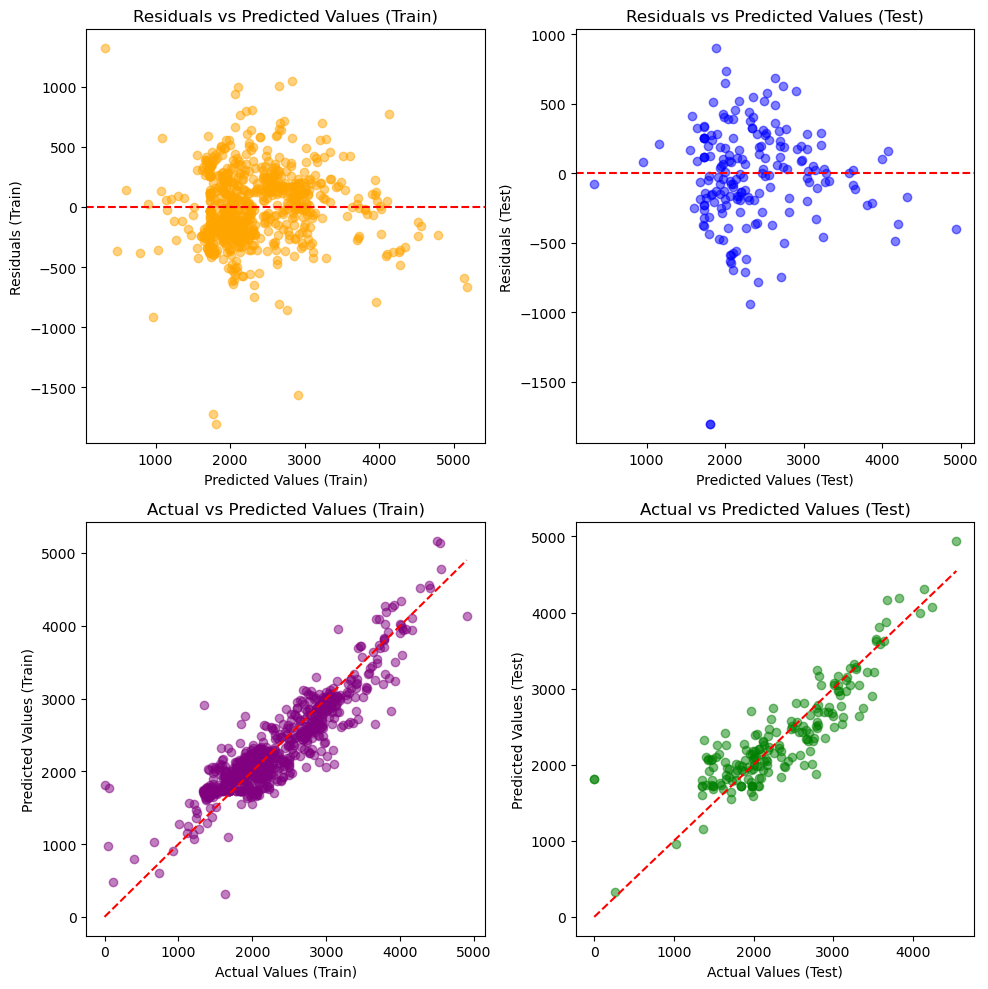

{'Model': 'Ridge',
 'Training Time (s)': 8.061851263046265,
 'RMSE Train': 301.42146653933213,
 'RMSE Test': 368.55297480675034,
 'R2 Train': 0.818642645784386,
 'R2 Test': 0.7504587005850685,
 'MAE Train': 233.43337925440508,
 'MAE Test': 269.00124003219054,
 'Mean Residual Train': 3.209268921036298e-14,
 'Mean Residual Test': -23.331743437421174,
 'MAPE Train': 1.0393993003321802e+16,
 'MAPE Test': 8.65584016654427e+16}

In [9]:
ridge_results = evaluate_model(Ridge(random_state=42), 'Ridge')
results.append(ridge_results)
ridge_results

### Lasso

c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.811e+05, tolerance: 2.569e+04
  model = cd_fast.enet_coordinate_descent(
c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.652e+06, tolerance: 2.366e+04
  model = cd_fast.enet_coordinate_descent(
c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.605e+06, toleranc

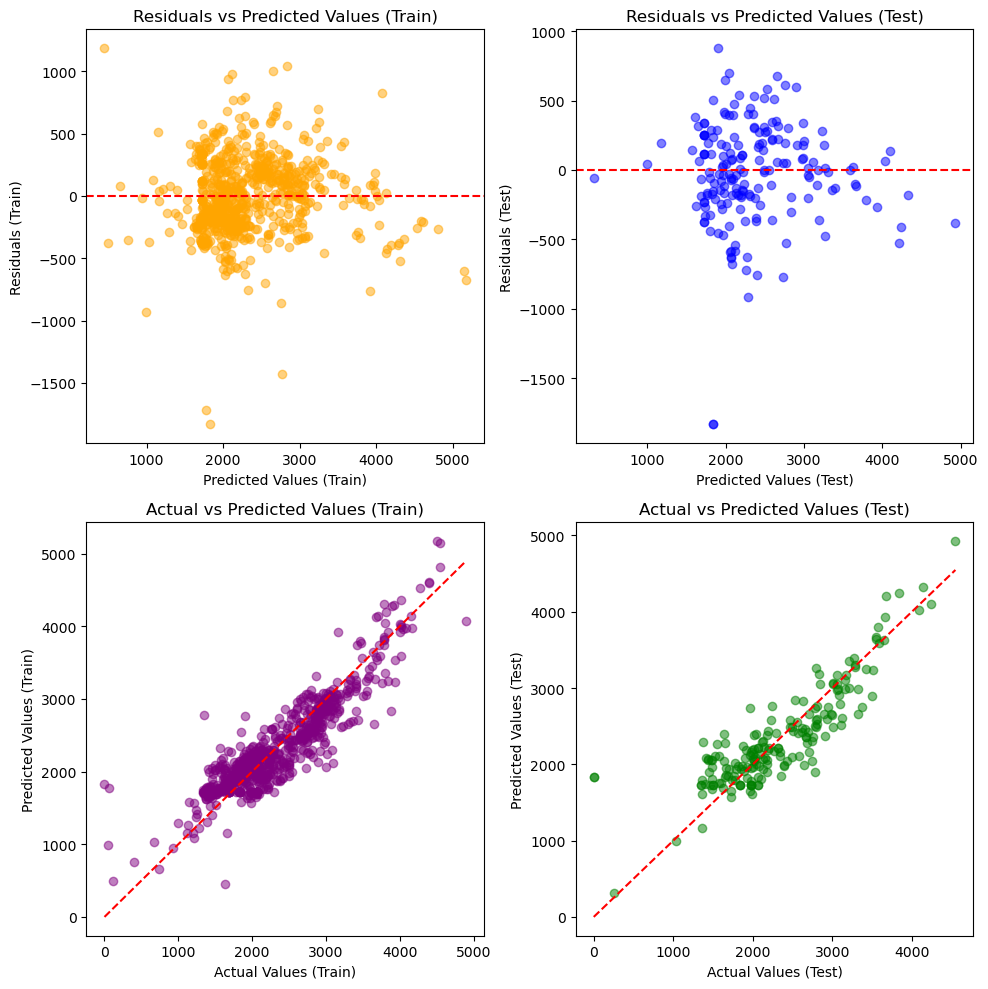

{'Model': 'Lasso',
 'Training Time (s)': 11.124361276626587,
 'RMSE Train': 300.07164347521393,
 'RMSE Test': 370.66893233612916,
 'R2 Train': 0.820264890998288,
 'R2 Test': 0.7475851134835791,
 'MAE Train': 233.5340784548715,
 'MAE Test': 271.16210074794367,
 'Mean Residual Train': 1.7681255187596209e-13,
 'Mean Residual Test': -24.43759364118866,
 'MAPE Train': 1.0302625775613522e+16,
 'MAPE Test': 8.784366116661141e+16}

In [10]:
lasso_results = evaluate_model(Lasso(random_state=42), 'Lasso')
results.append(lasso_results)
lasso_results

### Elastic Net

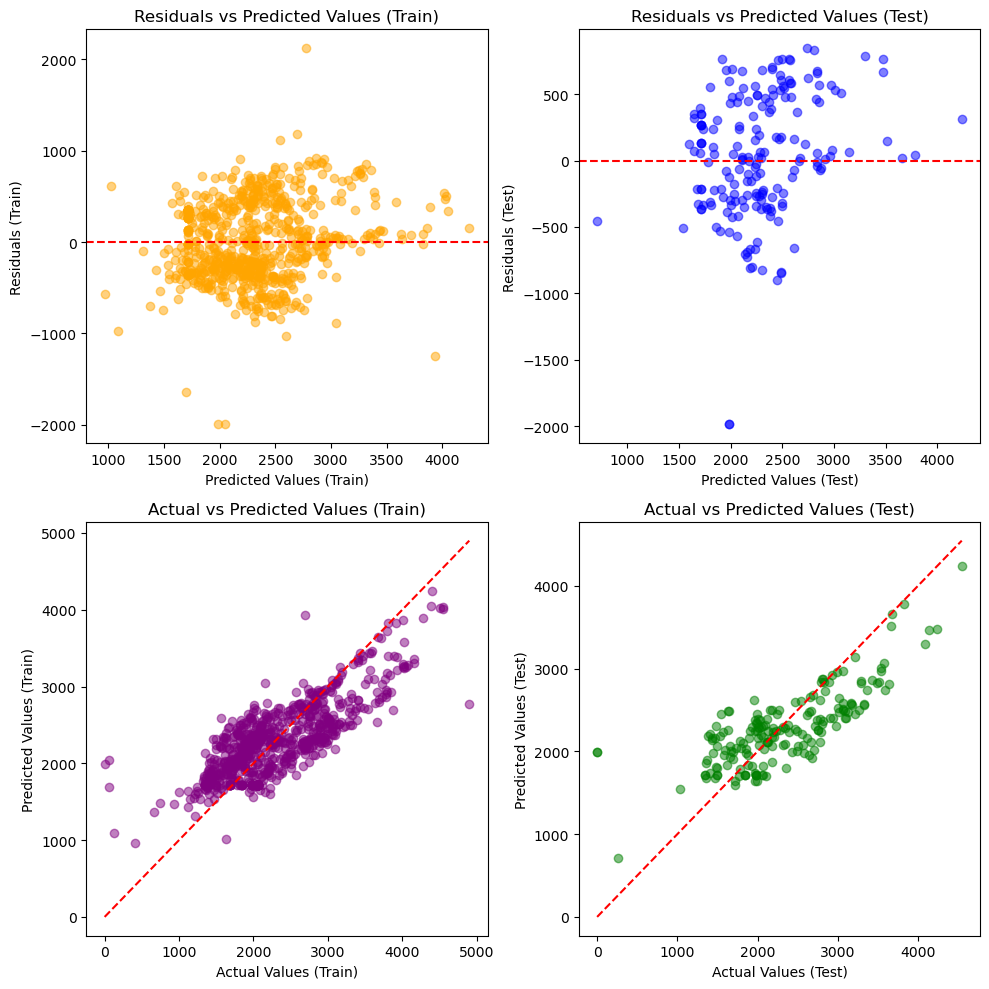

{'Model': 'Elastic Net',
 'Training Time (s)': 8.587790727615356,
 'RMSE Train': 436.4667950699555,
 'RMSE Test': 474.5051430611541,
 'R2 Train': 0.6196195639429548,
 'R2 Test': 0.586358181972533,
 'MAE Train': 357.1905783444299,
 'MAE Test': 375.62767738224943,
 'Mean Residual Train': -2.5431942393117835e-14,
 'Mean Residual Test': 43.556209050736896,
 'MAPE Train': 1.158233693418465e+16,
 'MAPE Test': 9.522093096153803e+16}

In [11]:
elastic_net_results = evaluate_model(ElasticNet(random_state=42), 'Elastic Net')
results.append(elastic_net_results)
elastic_net_results

### Decision Tree

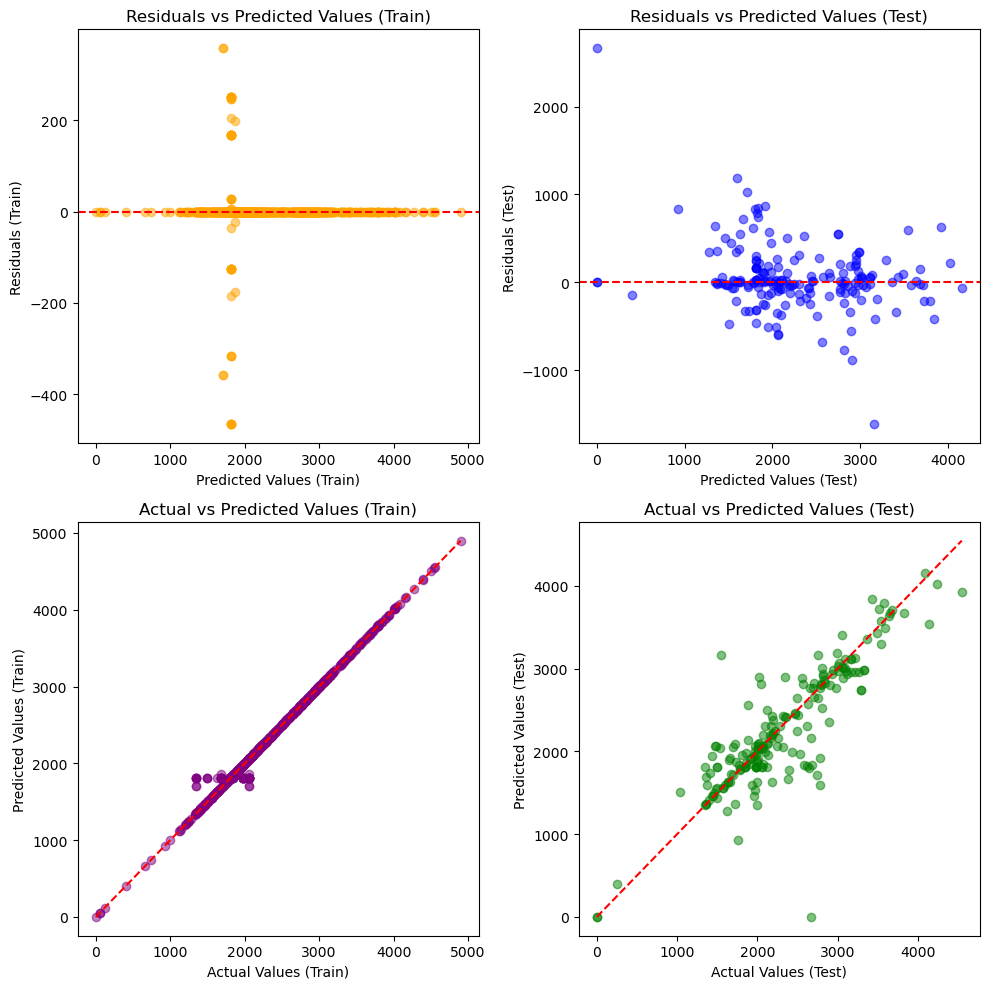

{'Model': 'Decision Tree',
 'Training Time (s)': 6.890897274017334,
 'RMSE Train': 62.218040074736074,
 'RMSE Test': 391.785777445351,
 'R2 Train': 0.9922584335428323,
 'R2 Test': 0.7180059644136124,
 'MAE Train': 13.773305026311014,
 'MAE Test': 234.89408983451537,
 'Mean Residual Train': 6.05522437931377e-16,
 'Mean Residual Test': 51.92033096926714,
 'MAPE Train': 0.008159970808668477,
 'MAPE Test': 0.10951179049824585}

In [12]:
dt_results = evaluate_model(DecisionTreeRegressor(random_state=42), 'Decision Tree')
results.append(dt_results)
dt_results

### XGBoost

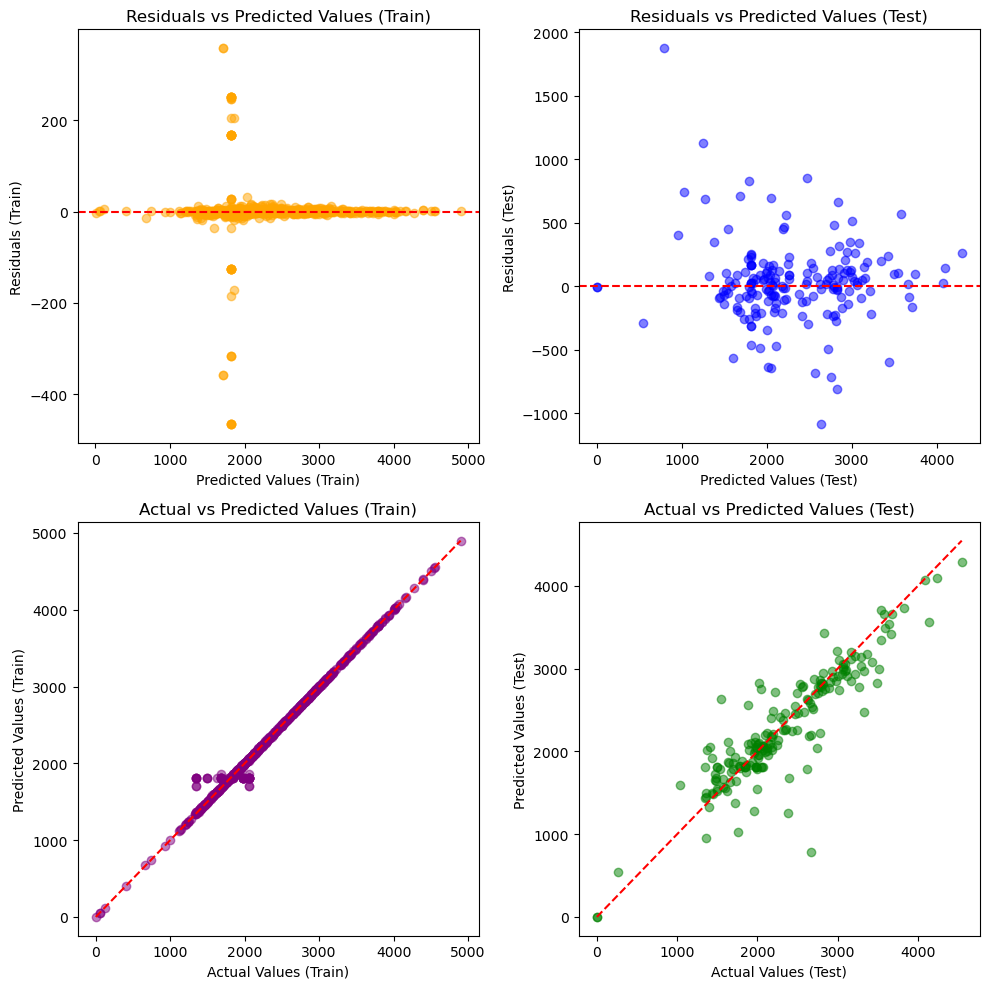

{'Model': 'XGBoost',
 'Training Time (s)': 16.775843143463135,
 'RMSE Train': 62.50810700395717,
 'RMSE Test': 320.7517275255945,
 'R2 Train': 0.9921845080752535,
 'R2 Test': 0.8109918207732579,
 'MAE Train': 15.33235242376245,
 'MAE Test': 204.94745172845558,
 'Mean Residual Train': -0.004949627481351362,
 'Mean Residual Test': 31.77659339600421,
 'MAPE Train': 19463269206706.39,
 'MAPE Test': 177254191283178.3}

In [13]:
xgb_results = evaluate_model(XGBRegressor(random_state=42), 'XGBoost')
results.append(xgb_results)
xgb_results

### Gradien Boosting

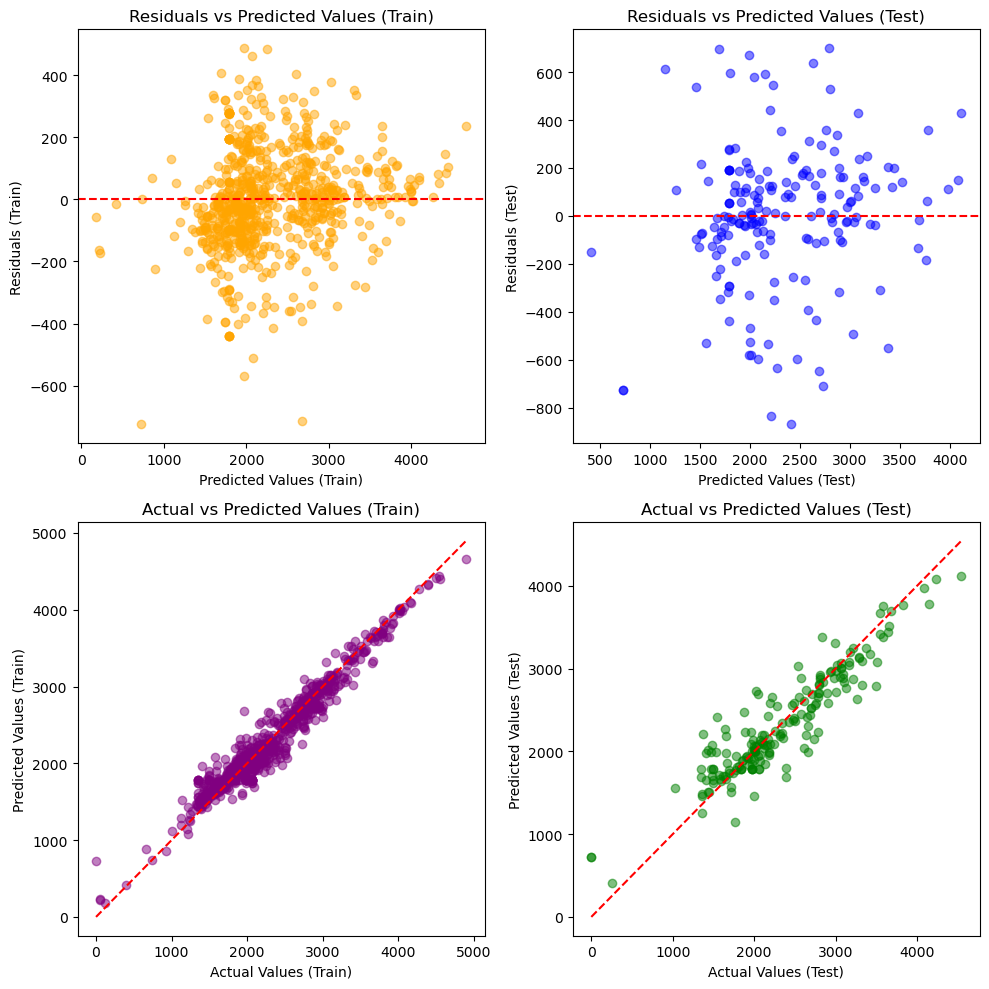

{'Model': 'Gradient Boosting',
 'Training Time (s)': 22.939734935760498,
 'RMSE Train': 146.36791183453275,
 'RMSE Test': 291.6439772894632,
 'R2 Train': 0.9572146352744552,
 'R2 Test': 0.8437397140186551,
 'MAE Train': 110.46157174280061,
 'MAE Test': 210.8885186194861,
 'Mean Residual Train': 1.1444374076903025e-13,
 'Mean Residual Test': 3.149405116080616,
 'MAPE Train': 2991653586993564.0,
 'MAPE Test': 3.471371368327489e+16}

In [14]:
gb_results = evaluate_model(GradientBoostingRegressor(random_state=42), 'Gradient Boosting')
results.append(gb_results)
gb_results

### Support Vector Regressor (SVR)

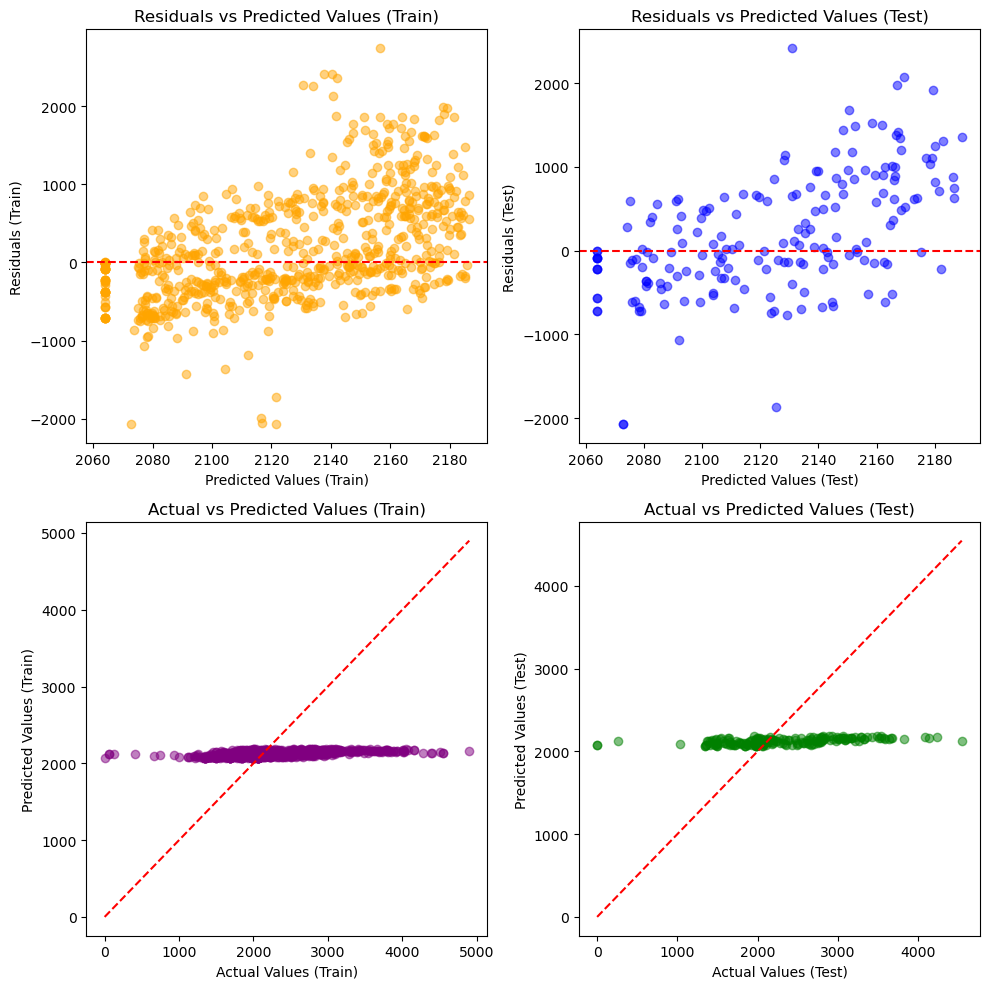

{'Model': 'Support Vector Regressor',
 'Training Time (s)': 8.995364904403687,
 'RMSE Train': 715.1548235404224,
 'RMSE Test': 744.8899261371669,
 'R2 Train': -0.020657521435688036,
 'R2 Test': -0.019358132493337843,
 'MAE Train': 540.4733368761017,
 'MAE Test': 568.7172779478631,
 'Mean Residual Train': 175.03884076679208,
 'Mean Residual Test': 200.4424938708303,
 'MAPE Train': 1.2529712586085266e+16,
 'MAPE Test': 9.930870634205005e+16}

In [15]:
svr_results = evaluate_model(SVR(), 'Support Vector Regressor')
results.append(svr_results)
svr_results

### Bayesian Ridge

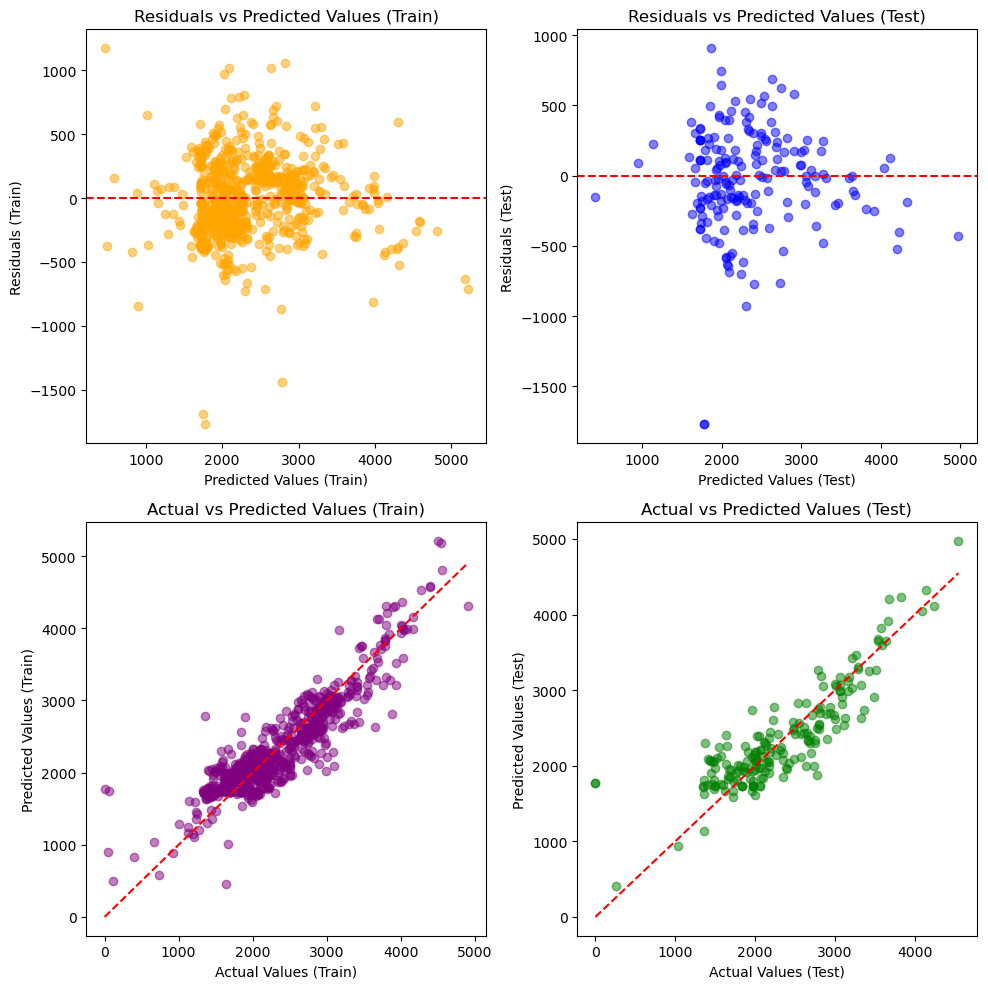

{'Model': 'Bayesian Ridge',
 'Training Time (s)': 7.130444526672363,
 'RMSE Train': 298.96935020641496,
 'RMSE Test': 368.4182302514023,
 'R2 Train': 0.821574248562856,
 'R2 Test': 0.7506411339779779,
 'MAE Train': 232.3742785271263,
 'MAE Test': 270.96715154969377,
 'Mean Residual Train': 3.027612189656885e-15,
 'Mean Residual Test': -27.590936639446102,
 'MAPE Train': 1.0135384065815942e+16,
 'MAPE Test': 8.489728992922104e+16}

In [16]:
br_results = evaluate_model(BayesianRidge(), 'Bayesian Ridge')
results.append(br_results)
br_results

### CatBoost Regressor

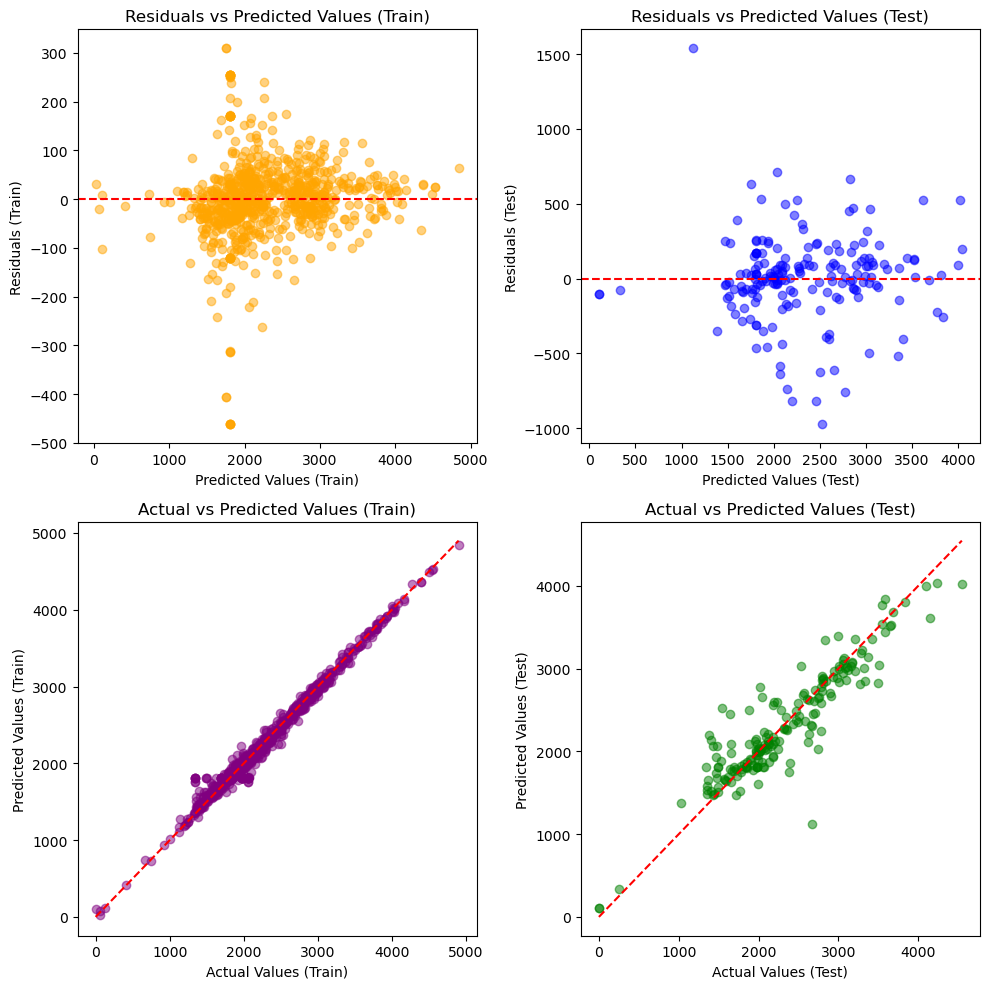

{'Model': 'CatBoost Regressor',
 'Training Time (s)': 135.96993970870972,
 'RMSE Train': 77.72547145502107,
 'RMSE Test': 291.4579496719696,
 'R2 Train': 0.987941390943527,
 'R2 Test': 0.8439389943748676,
 'MAE Train': 47.20215213286422,
 'MAE Test': 194.00016172492917,
 'Mean Residual Train': -0.08588048851528052,
 'Mean Residual Test': 2.9983189744107754,
 'MAPE Train': 711977746740882.9,
 'MAPE Test': 4948415544190976.0}

In [17]:
cb_results = evaluate_model(CatBoostRegressor(random_state=42, silent=True), 'CatBoost Regressor')
results.append(cb_results)
cb_results

### LightGBM Regressor

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3748
[LightGBM] [Info] Number of data points in the train set: 500, number of used features: 29
[LightGBM] [Info] Start training from score 2315.098000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

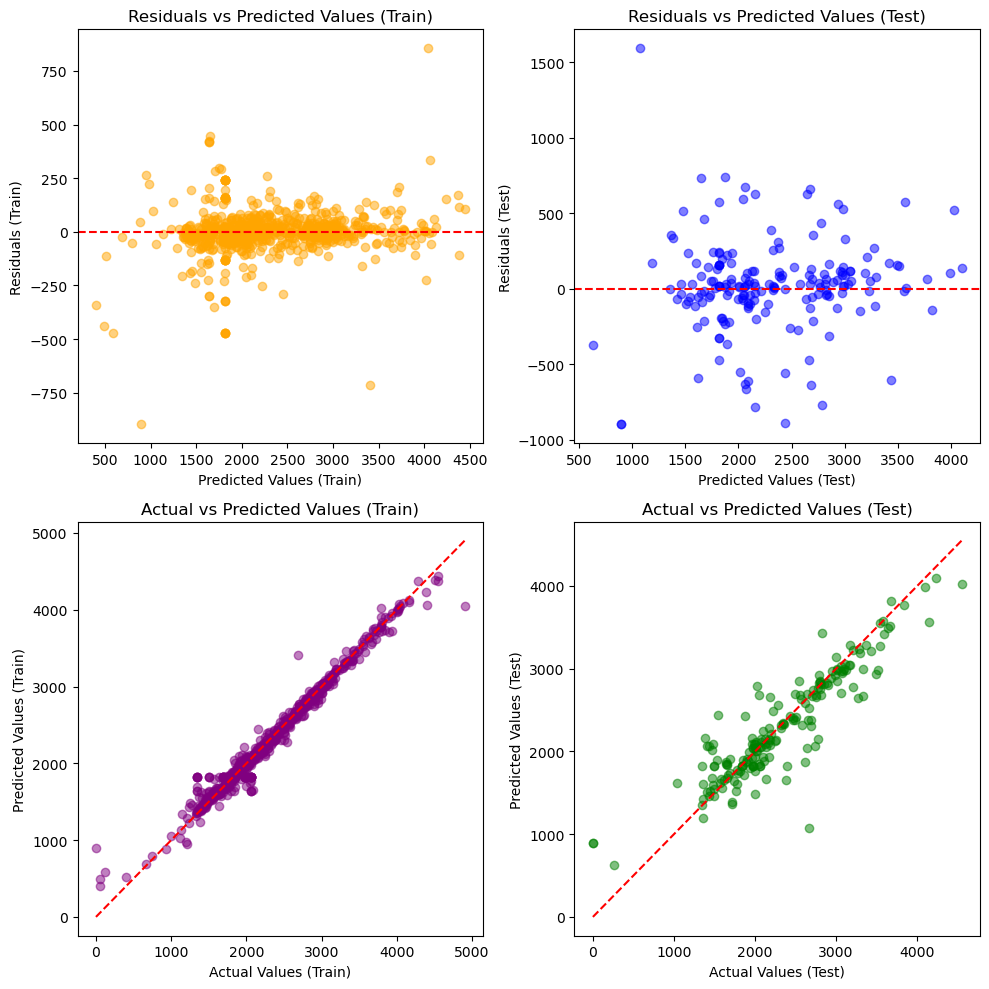

{'Model': 'LightGBM Regressor',
 'Training Time (s)': 11.460686206817627,
 'RMSE Train': 124.33388177664592,
 'RMSE Test': 311.75169022368084,
 'R2 Train': 0.9691441590267212,
 'R2 Test': 0.8214498481948617,
 'MAE Train': 72.18364806511885,
 'MAE Test': 202.8539751607014,
 'Mean Residual Train': 4.8623371534166545e-09,
 'Mean Residual Test': 21.28756078366418,
 'MAPE Train': 5936295032939035.0,
 'MAPE Test': 4.300405549215902e+16}

In [18]:
lgbm_results = evaluate_model(LGBMRegressor(random_state=42), 'LightGBM Regressor')
results.append(lgbm_results)
lgbm_results

### Extra Trees Regressor

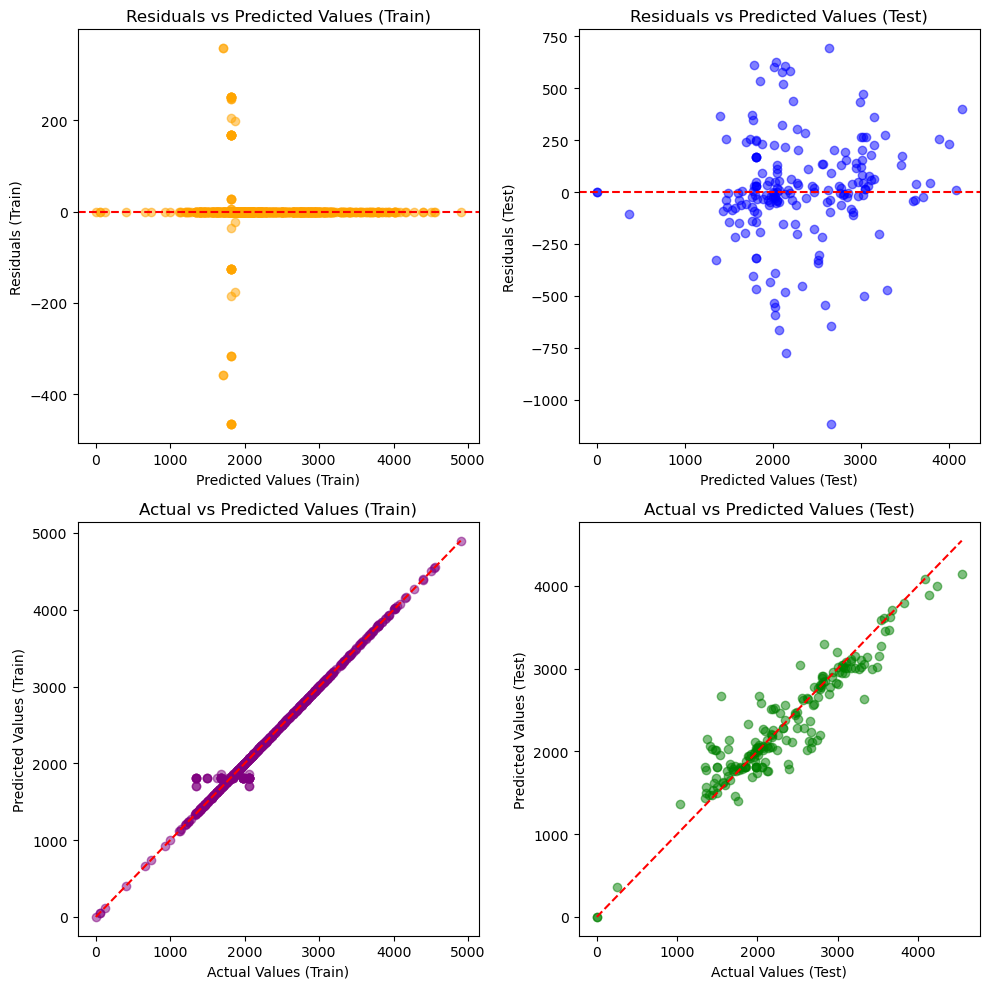

{'Model': 'Extra Trees Regressor',
 'Training Time (s)': 19.923681497573853,
 'RMSE Train': 62.218040074736074,
 'RMSE Test': 263.6953235158827,
 'R2 Train': 0.992258433542832,
 'R2 Test': 0.8722539600852006,
 'MAE Train': 13.773305026311021,
 'MAE Test': 178.73460047281333,
 'Mean Residual Train': 1.368480709724912e-13,
 'Mean Residual Test': 12.850735224586437,
 'MAPE Train': 0.008159970808668477,
 'MAPE Test': 0.08722294941144064}

In [19]:
et_results = evaluate_model(ExtraTreesRegressor(random_state=42), 'Extra Trees Regressor')
results.append(et_results)
et_results

## Hasil: Baseline

In [20]:
results_df = pd.DataFrame(results)

results_df['RMSE Difference'] = results_df['RMSE Test'] - results_df['RMSE Train']
results_df['R2 Difference'] = results_df['R2 Test'] - results_df['R2 Train']
results_df['MAE Difference'] = results_df['MAE Test'] - results_df['MAE Train']
results_df['MAPE Difference'] = results_df['MAPE Test'] - results_df['MAPE Train']

# Menentukan urutan kolom yang diinginkan
columns_order = [
    'Model', 'Training Time (s)', 
    'RMSE Train', 'RMSE Test', 'RMSE Difference',
    'R2 Train', 'R2 Test', 'R2 Difference',
    'MAE Train', 'MAE Test', 'MAE Difference',
    'Mean Residual Train', 'Mean Residual Test',
    'MAPE Train', 'MAPE Test', 'MAPE Difference'
]

# Mengatur urutan kolom dan mengurutkan hasil berdasarkan beberapa metrik
results_df = results_df[columns_order].sort_values(
    by=['MAE Difference'],
    ascending=[True]
)

pd.options.display.float_format = '{:.4f}'.format
# Tampilkan DataFrame hasil
results_df

,Model,Training Time (s),RMSE Train,RMSE Test,RMSE Difference,R2 Train,R2 Test,R2 Difference,MAE Train,MAE Test,MAE Difference,Mean Residual Train,Mean Residual Test,MAPE Train,MAPE Test,MAPE Difference
4,Elastic Net,8.5878,436.4668,474.5051,38.0383,0.6196,0.5864,-0.0333,357.1906,375.6277,18.4371,-0.0000,43.5562,11582336934184650.0000,95220930961538032.0000,83638594027353376.0000
8,Support Vector Regressor,8.9954,715.1548,744.8899,29.7351,-0.0207,-0.0194,0.0013,540.4733,568.7173,28.2439,175.0388,200.4425,12529712586085266.0000,99308706342050048.0000,86778993755964784.0000
2,Ridge,8.0619,301.4215,368.5530,67.1315,0.8186,0.7505,-0.0682,233.4334,269.0012,35.5679,0.0000,-23.3317,10393993003321802.0000,86558401665442704.0000,76164408662120896.0000
3,Lasso,11.1244,300.0716,370.6689,70.5973,0.8203,0.7476,-0.0727,233.5341,271.1621,37.6280,0.0000,-24.4376,10302625775613522.0000,87843661166611408.0000,77541035390997888.0000
9,Bayesian Ridge,7.1304,298.9694,368.4182,69.4489,0.8216,0.7506,-0.0709,232.3743,270.9672,38.5929,0.0000,-27.5909,10135384065815942.0000,84897289929221040.0000,74761905863405104.0000
1,Linear Regression,9.3781,297.7334,369.5022,71.7688,0.8231,0.7492,-0.0739,231.7332,273.1007,41.3675,-0.0027,-31.1450,9842636697397210.0000,83588171181986992.0000,73745534484589776.0000
7,Gradient Boosting,22.9397,146.3679,291.6440,145.2761,0.9572,0.8437,-0.1135,110.4616,210.8885,100.4269,0.0000,3.1494,2991653586993564.0000,34713713683274888.0000,31722060096281324.0000
0,Random Forest,34.3815,123.3091,295.6743,172.3652,0.9696,0.8394,-0.1302,79.6073,200.9806,121.3733,-3.2948,7.4986,4603120293790011.0000,37045460679525688.0000,32442340385735676.0000
11,LightGBM Regressor,11.4607,124.3339,311.7517,187.4178,0.9691,0.8214,-0.1477,72.1836,202.8540,130.6703,0.0000,21.2876,5936295032939035.0000,43004055492159024.0000,37067760459219992.0000
10,CatBoost Regressor,135.9699,77.7255,291.4579,213.7325,0.9879,0.8439,-0.1440,47.2022,194.0002,146.7980,-0.0859,2.9983,711977746740882.8750,4948415544190976.0000,4236437797450093.0000


Data tersebut diurutkan berdasarkan MAE Test terkecil, dengan syarat perbedaan score dengan MAE Train tidak terlalu besar. Sehingga dapat disimpulkan 4 model terbaik pada dataset tanpa treatment adalah model: Ridge, Lasso, Bayesian Ridge, Linear Regression.

In [21]:
df_best = results_df[results_df["Model"].isin(["Ridge", "Lasso", "Bayesian Ridge", "Linear Regression"])]
df_best[['Model','MAE Test']]

,Model,MAE Test
2,Ridge,269.0012
3,Lasso,271.1621
9,Bayesian Ridge,270.9672
1,Linear Regression,273.1007


## Feature Importance

### Ridge

In [23]:
import shap

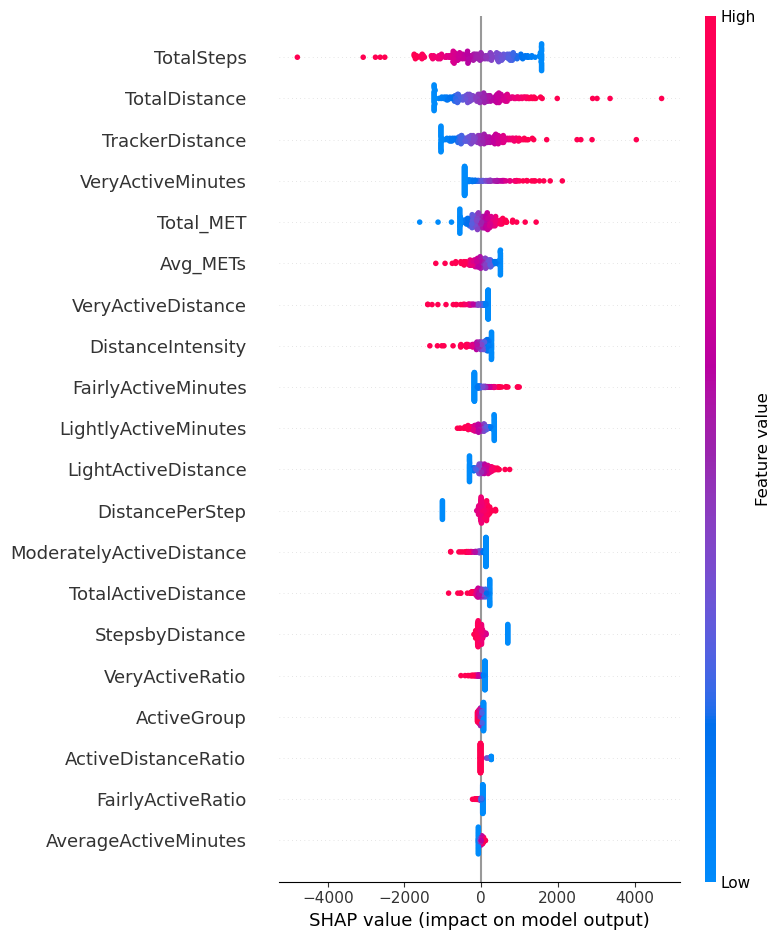

In [24]:
model = Ridge(random_state=42)
model.fit(X_train, y_train)

# Use LinearExplainer for Ridge model
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer(X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test)

### Lasso

c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.232e+06, tolerance: 3.766e+04
  model = cd_fast.enet_coordinate_descent(


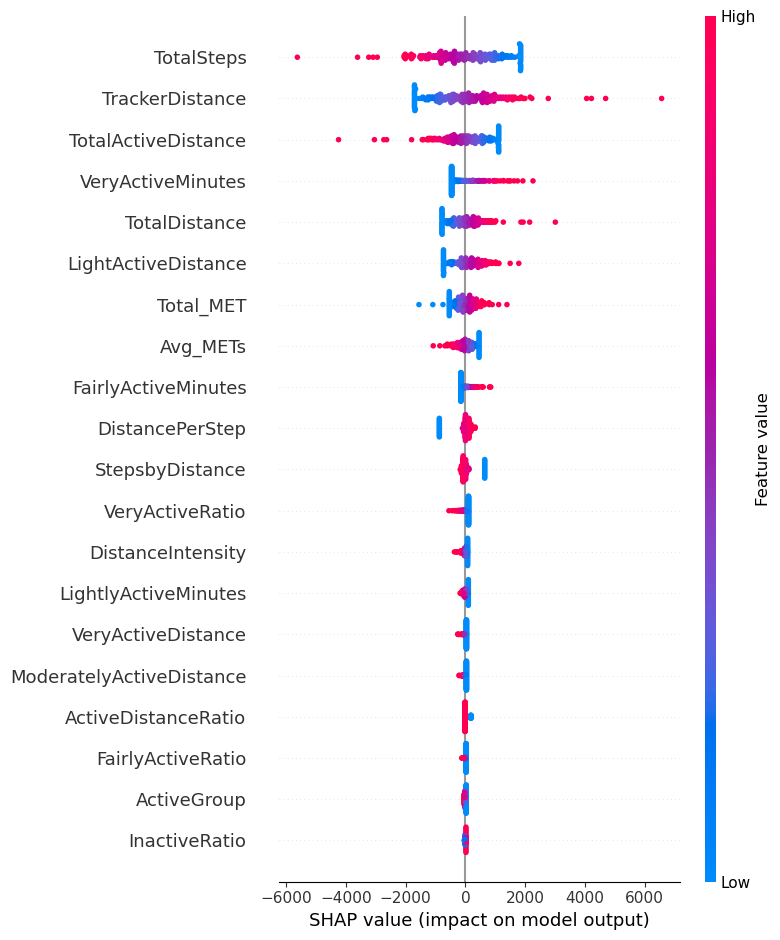

In [25]:
model = Lasso(random_state=42)
model.fit(X_train, y_train)

# Use LinearExplainer for Ridge model
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer(X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test)

### Bayesian Ridge

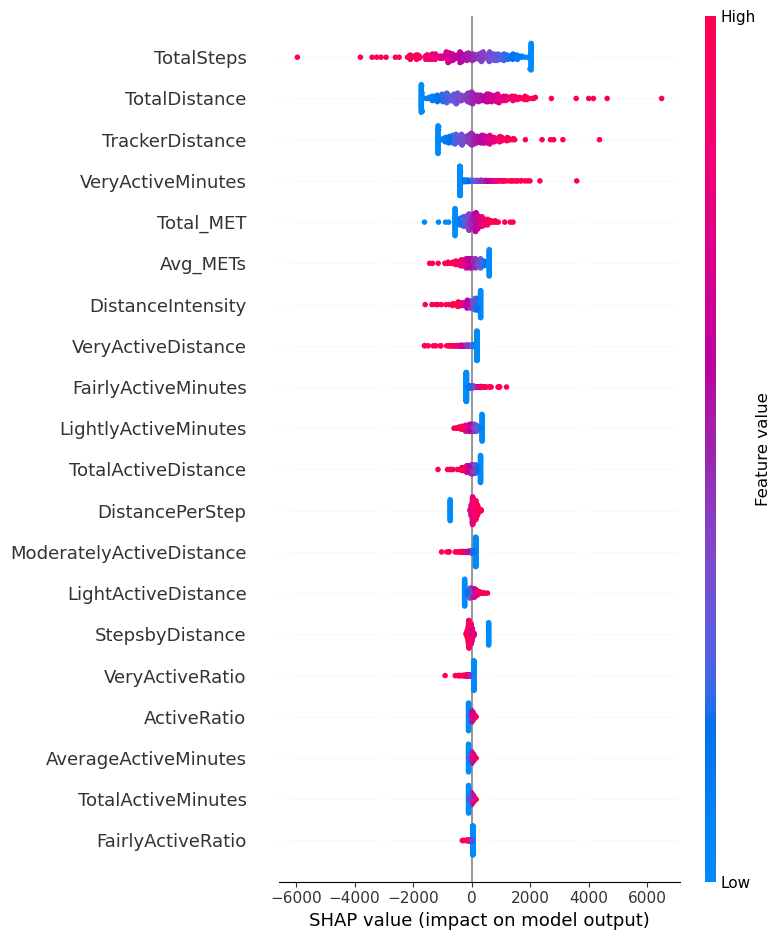

In [ ]:
model = BayesianRidge()
model.fit(X_train, y_train)

# Use LinearExplainer for Ridge model
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer(X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test)

### Linear Regression

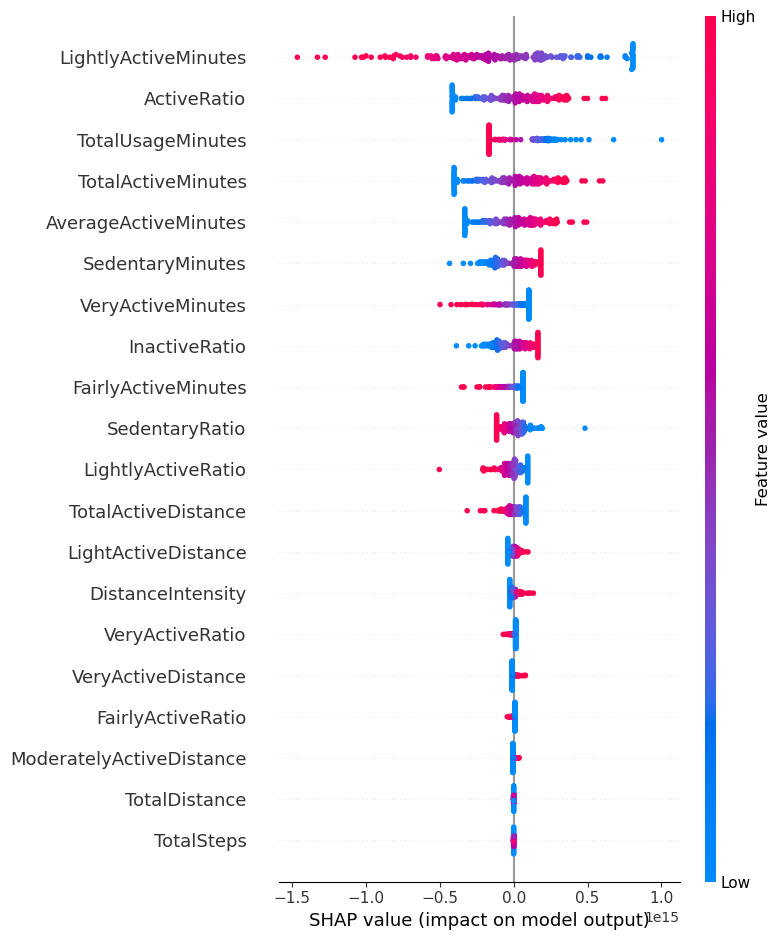

In [26]:
model = LinearRegression()
model.fit(X_train, y_train)

# Use LinearExplainer for Ridge model
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer(X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test)

## Model: Tuning

In [27]:
from sklearn.model_selection import GridSearchCV

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import KFold

def evaluate_model(model, model_name):
    start_time = time.time()
    
    # Inisialisasi K-Fold
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    
    rmse_train_list = []
    r2_train_list = []
    mae_train_list = []
    mape_train_list = []
    
    # K-Fold Cross Validation
    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
        
        # Latih model pada lipatan
        model.fit(X_train_fold, y_train_fold)
        y_train_pred = model.predict(X_train_fold)
        y_val_pred = model.predict(X_val_fold)
        
        # Hitung metrik untuk lipatan
        rmse_train_list.append(np.sqrt(mean_squared_error(y_train_fold, y_train_pred)))
        r2_train_list.append(r2_score(y_train_fold, y_train_pred))
        mae_train_list.append(mean_absolute_error(y_train_fold, y_train_pred))
        mape_train_list.append(mean_absolute_percentage_error(y_train_fold, y_train_pred))

    # Rata-rata metrik untuk data latih
    rmse_train = np.mean(rmse_train_list)
    r2_train = np.mean(r2_train_list)
    mae_train = np.mean(mae_train_list)
    mape_train = np.mean(mape_train_list)

    # Latih model dengan semua data latih untuk evaluasi
    model.fit(X_train, y_train)
    
    # Hitung prediksi untuk data uji
    y_test_pred = model.predict(X_test)
    
    # Hitung metrik untuk data uji
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2_test = r2_score(y_test, y_test_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_test_pred)

    # Hitung residual untuk data latih dan data uji
    y_train_pred = model.predict(X_train)  # Prediksi pada seluruh data latih
    residuals_train = y_train - y_train_pred
    residuals_test = y_test - y_test_pred
    mean_residual_train = np.mean(residuals_train)
    mean_residual_test = np.mean(residuals_test)

    plt.figure(figsize=(10, 10))

    # Residuals vs Predicted Values (Train)
    plt.subplot(2, 2, 1)
    plt.scatter(y_train_pred, residuals_train, color='orange', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Train)')
    plt.xlabel('Predicted Values (Train)')
    plt.ylabel('Residuals (Train)')

    # Residuals vs Predicted Values (Test)
    plt.subplot(2, 2, 2)
    plt.scatter(y_test_pred, residuals_test, color='blue', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Test)')
    plt.xlabel('Predicted Values (Test)')
    plt.ylabel('Residuals (Test)')

    # Actual vs Predicted Values (Train)
    plt.subplot(2, 2, 3)
    plt.scatter(y_train, y_train_pred, color='purple', alpha=0.5)
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Train)')
    plt.xlabel('Actual Values (Train)')
    plt.ylabel('Predicted Values (Train)')

    # Actual vs Predicted Values (Test)
    plt.subplot(2, 2, 4)
    plt.scatter(y_test, y_test_pred, color='green', alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Test)')
    plt.xlabel('Actual Values (Test)')
    plt.ylabel('Predicted Values (Test)')

    plt.tight_layout()
    plt.show()

    end_time = time.time()
    training_time = end_time - start_time

    return {
        'Model': model_name,
        'Training Time (s)': training_time,
        'RMSE Train': rmse_train,
        'RMSE Test': rmse_test,
        'R2 Train': r2_train,
        'R2 Test': r2_test,
        'MAE Train': mae_train,
        'MAE Test': mae_test,
        'Mean Residual Train': mean_residual_train,
        'Mean Residual Test': mean_residual_test,
        'MAPE Train': mape_train,
        'MAPE Test': mape_test
    }

results_tuning = []


### Ridge

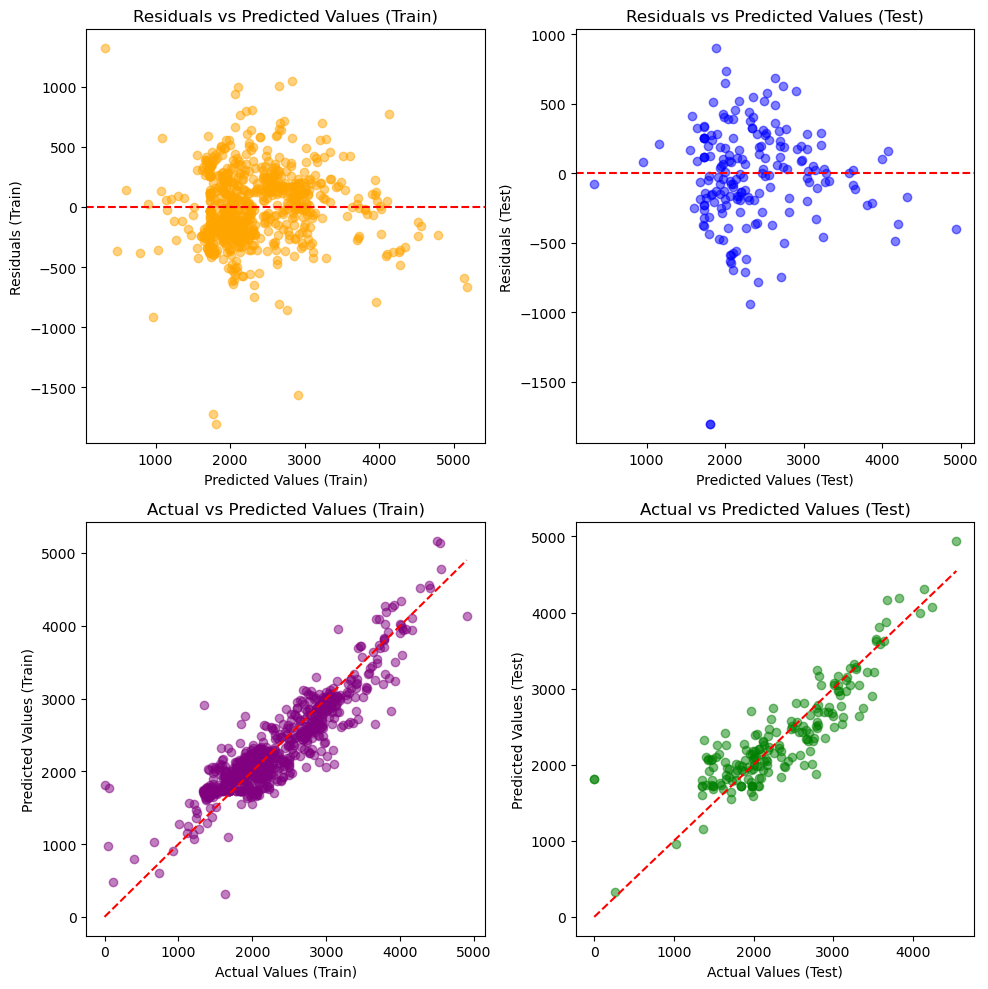

{'Model': 'Ridge',
 'Training Time (s)': 8.379212856292725,
 'RMSE Train': 301.42146653933213,
 'RMSE Test': 368.55297480675034,
 'R2 Train': 0.818642645784386,
 'R2 Test': 0.7504587005850685,
 'MAE Train': 233.43337925440508,
 'MAE Test': 269.00124003219054,
 'Mean Residual Train': 3.209268921036298e-14,
 'Mean Residual Test': -23.331743437421174,
 'MAPE Train': 1.0393993003321802e+16,
 'MAPE Test': 8.65584016654427e+16}

In [29]:
ridge_results = evaluate_model(Ridge(random_state=42), 'Ridge')
results_tuning.append(ridge_results)
ridge_results

### Lasso

c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.497e+07, tolerance: 2.597e+04
  model = cd_fast.enet_coordinate_descent(
c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.063e+07, tolerance: 2.439e+04
  model = cd_fast.enet_coordinate_descent(
c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.660e+07, toleranc

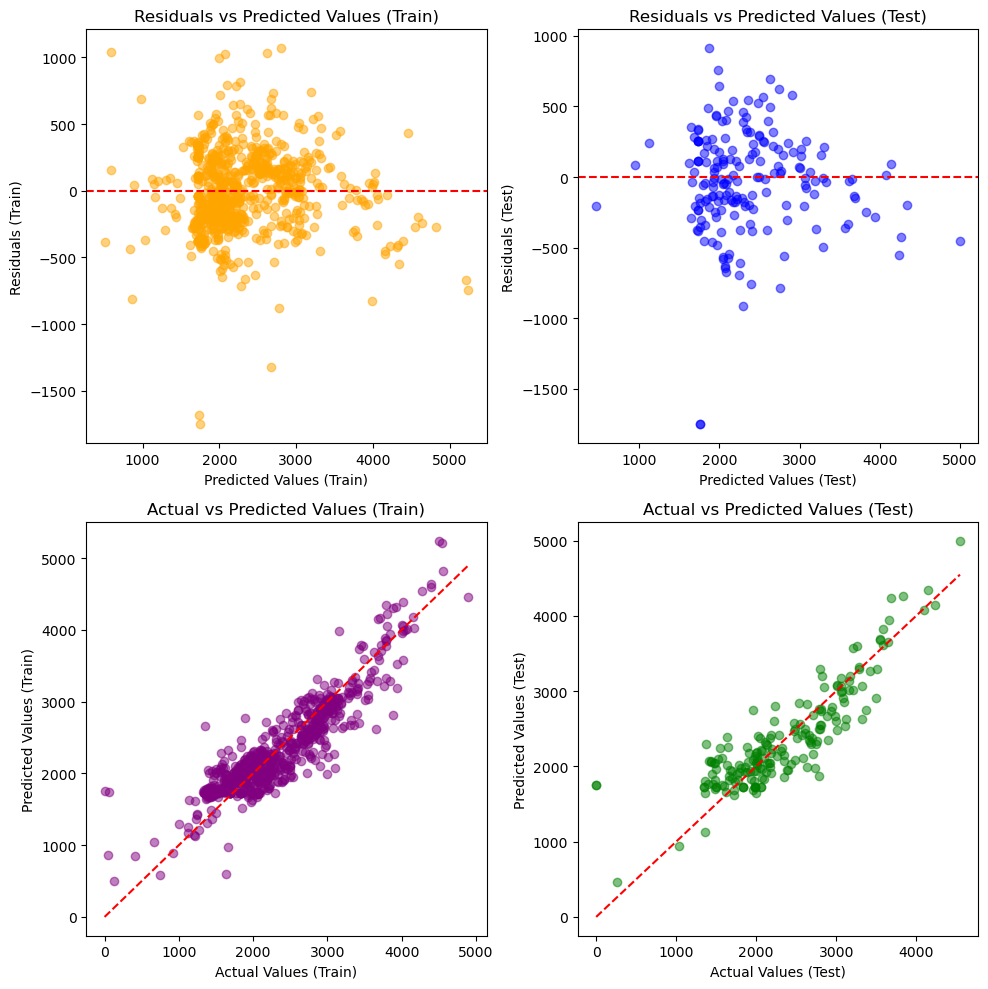

In [30]:
lasso_params = {
    'alpha': [0.1, 1.0, 10.0, None],  
    'fit_intercept': [True, False],   
    'max_iter': [1000, 5000]          
}
lasso_model = GridSearchCV(Lasso(), lasso_params, scoring='neg_mean_absolute_error', cv=3)
lasso_model.fit(X_train, y_train)  # Fit model
results_tuning.append(evaluate_model(lasso_model.best_estimator_, 'Lasso'))

### Bayesian Ridge

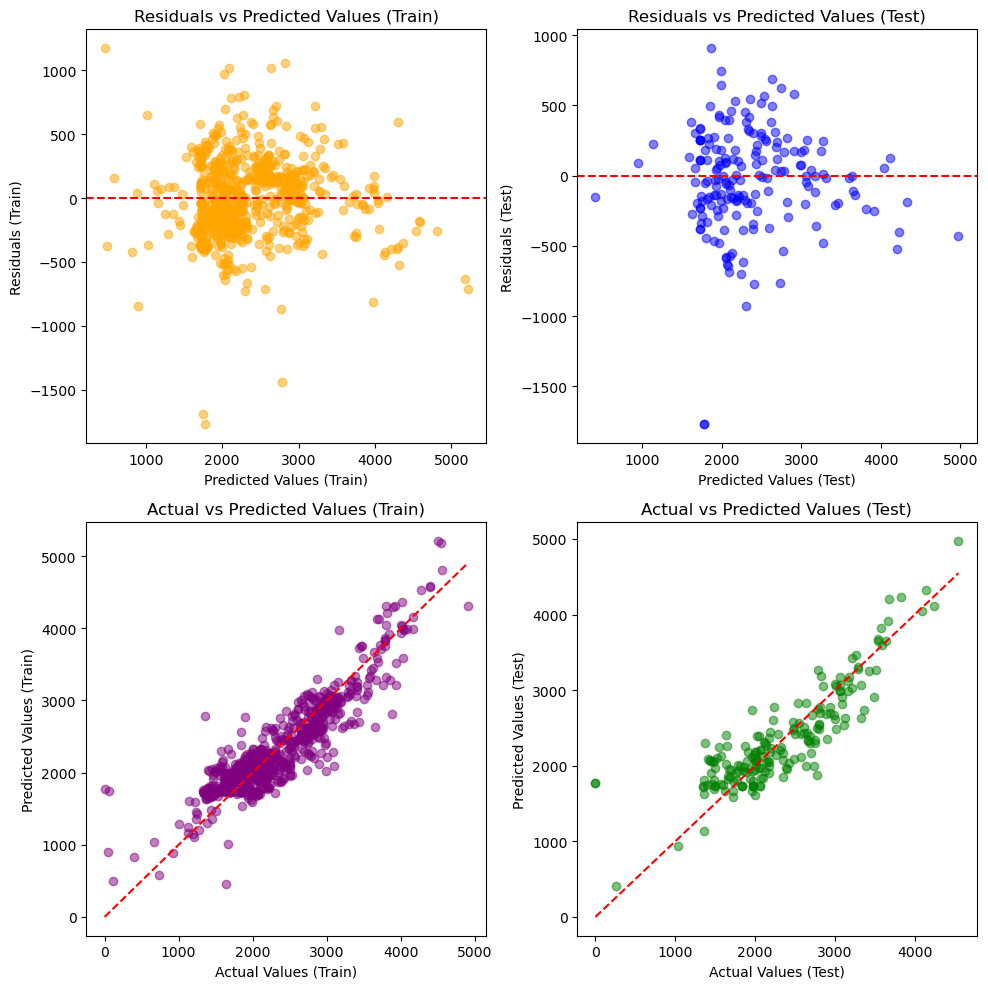

In [31]:
# Bayesian Ridge tanpa tuning
results_tuning.append(evaluate_model(BayesianRidge(), 'Bayesian Ridge'))

### Linear Regression

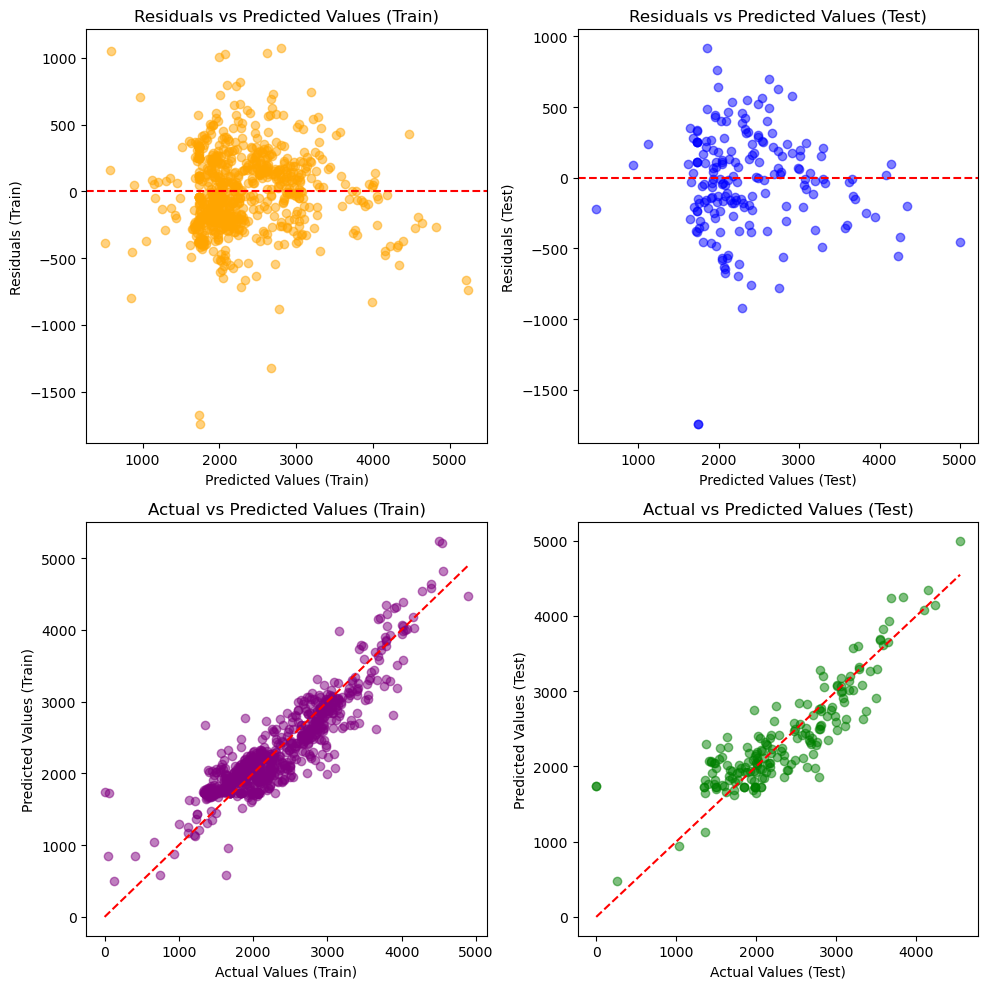

In [32]:
# No tuning needed
results_tuning.append(evaluate_model(LinearRegression(), 'Linear Regression'))

## Hasil: Tuning

In [33]:
results_df = pd.DataFrame(results_tuning)

results_df['RMSE Difference'] = results_df['RMSE Test'] - results_df['RMSE Train']
results_df['R2 Difference'] = results_df['R2 Test'] - results_df['R2 Train']
results_df['MAE Difference'] = results_df['MAE Test'] - results_df['MAE Train']
results_df['MAPE Difference'] = results_df['MAPE Test'] - results_df['MAPE Train']

results_df = results_df[columns_order].sort_values(by=['RMSE Test','RMSE Train','RMSE Difference'],ascending=[True,True,True])

results_df

,Model,Training Time (s),RMSE Train,RMSE Test,RMSE Difference,R2 Train,R2 Test,R2 Difference,MAE Train,MAE Test,MAE Difference,Mean Residual Train,Mean Residual Test,MAPE Train,MAPE Test,MAPE Difference
2,Bayesian Ridge,10.5813,298.9694,368.4182,69.4489,0.8216,0.7506,-0.0709,232.3743,270.9672,38.5929,0.0000,-27.5909,10135384065815942.0000,84897289929221040.0000,74761905863405104.0000
0,Ridge,8.3792,301.4215,368.5530,67.1315,0.8186,0.7505,-0.0682,233.4334,269.0012,35.5679,0.0000,-23.3317,10393993003321802.0000,86558401665442704.0000,76164408662120896.0000
3,Linear Regression,10.5839,297.7334,369.5022,71.7688,0.8231,0.7492,-0.0739,231.7332,273.1007,41.3675,-0.0027,-31.1450,9842636697397210.0000,83588171181986992.0000,73745534484589776.0000
1,Lasso,9.0314,297.7490,369.7168,71.9678,0.8230,0.7489,-0.0742,231.7500,273.1578,41.4078,0.0000,-30.8733,9866694492538726.0000,83954521697738944.0000,74087827205200224.0000


# Dataset dengan 2 feature saja

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import KFold

def evaluate_model(model, model_name):
    start_time = time.time()
    
    # Inisialisasi K-Fold
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    
    rmse_train_list = []
    r2_train_list = []
    mae_train_list = []
    mape_train_list = []
    
    # K-Fold Cross Validation
    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
        
        # Latih model pada lipatan
        model.fit(X_train_fold, y_train_fold)
        y_train_pred = model.predict(X_train_fold)
        y_val_pred = model.predict(X_val_fold)
        
        # Hitung metrik untuk lipatan
        rmse_train_list.append(np.sqrt(mean_squared_error(y_train_fold, y_train_pred)))
        r2_train_list.append(r2_score(y_train_fold, y_train_pred))
        mae_train_list.append(mean_absolute_error(y_train_fold, y_train_pred))
        mape_train_list.append(mean_absolute_percentage_error(y_train_fold, y_train_pred))

    # Rata-rata metrik untuk data latih
    rmse_train = np.mean(rmse_train_list)
    r2_train = np.mean(r2_train_list)
    mae_train = np.mean(mae_train_list)
    mape_train = np.mean(mape_train_list)

    # Latih model dengan semua data latih untuk evaluasi
    model.fit(X_train, y_train)
    
    # Hitung prediksi untuk data uji
    y_test_pred = model.predict(X_test)
    
    # Hitung metrik untuk data uji
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2_test = r2_score(y_test, y_test_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_test_pred)

    # Hitung residual untuk data latih dan data uji
    y_train_pred = model.predict(X_train)  # Prediksi pada seluruh data latih
    residuals_train = y_train - y_train_pred
    residuals_test = y_test - y_test_pred
    mean_residual_train = np.mean(residuals_train)
    mean_residual_test = np.mean(residuals_test)

    plt.figure(figsize=(10, 10))

    # Residuals vs Predicted Values (Train)
    plt.subplot(2, 2, 1)
    plt.scatter(y_train_pred, residuals_train, color='orange', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Train)')
    plt.xlabel('Predicted Values (Train)')
    plt.ylabel('Residuals (Train)')

    # Residuals vs Predicted Values (Test)
    plt.subplot(2, 2, 2)
    plt.scatter(y_test_pred, residuals_test, color='blue', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Test)')
    plt.xlabel('Predicted Values (Test)')
    plt.ylabel('Residuals (Test)')

    # Actual vs Predicted Values (Train)
    plt.subplot(2, 2, 3)
    plt.scatter(y_train, y_train_pred, color='purple', alpha=0.5)
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Train)')
    plt.xlabel('Actual Values (Train)')
    plt.ylabel('Predicted Values (Train)')

    # Actual vs Predicted Values (Test)
    plt.subplot(2, 2, 4)
    plt.scatter(y_test, y_test_pred, color='green', alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Test)')
    plt.xlabel('Actual Values (Test)')
    plt.ylabel('Predicted Values (Test)')

    plt.tight_layout()
    plt.show()

    end_time = time.time()
    training_time = end_time - start_time

    return {
        'Model': model_name,
        'Training Time (s)': training_time,
        'RMSE Train': rmse_train,
        'RMSE Test': rmse_test,
        'R2 Train': r2_train,
        'R2 Test': r2_test,
        'MAE Train': mae_train,
        'MAE Test': mae_test,
        'Mean Residual Train': mean_residual_train,
        'Mean Residual Test': mean_residual_test,
        'MAPE Train': mape_train,
        'MAPE Test': mape_test
    }

results_df2 = []


In [35]:
X_train = df_tr[['DistancePerStep','Total_MET']]
X_test = df_ts[['DistancePerStep','Total_MET']]

y_train = df_tr['Calories']
y_test = df_ts['Calories']

In [ ]:
X_train

,DistancePerStep,Total_MET
0,0.5898,0.5810
1,0.1761,0.1637
2,0.1126,-1.3523
3,0.7909,0.1989
4,0.4827,1.1792
...,...,...
652,-3.1449,-1.3977
653,0.1243,-0.7509
654,0.6410,0.1171
655,0.5852,0.2796


## Model: Baseline

### Random Forest

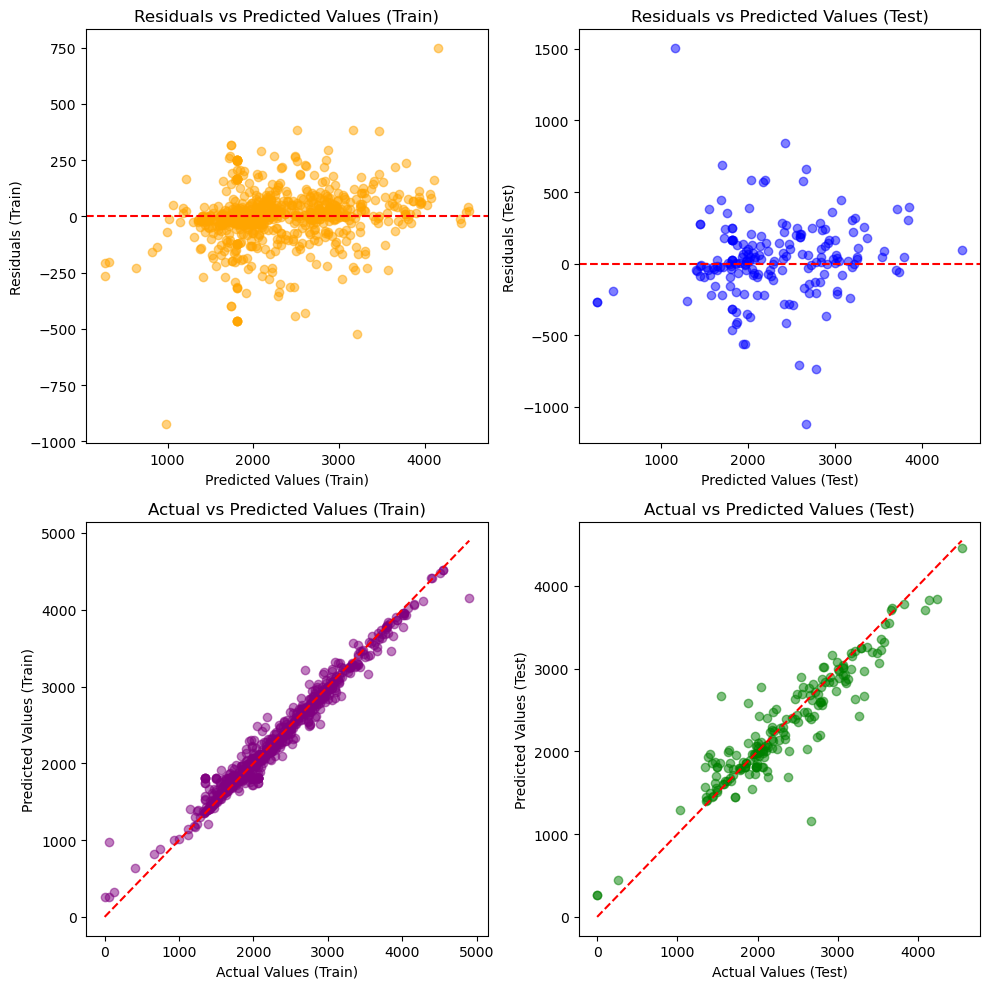

{'Model': 'Random Forest',
 'Training Time (s)': 19.34056782722473,
 'RMSE Train': 128.89386793209383,
 'RMSE Test': 274.58770483372484,
 'R2 Train': 0.9666959290170286,
 'R2 Test': 0.8614824618680823,
 'MAE Train': 85.36865926502765,
 'MAE Test': 183.9540520796794,
 'Mean Residual Train': -2.329300619816708,
 'Mean Residual Test': 30.74460344634867,
 'MAPE Train': 1413318613286643.2,
 'MAPE Test': 1.2702402748998484e+16}

In [36]:
rf_results = evaluate_model(RandomForestRegressor(random_state=42), 'Random Forest')
results_df2.append(rf_results)
rf_results

### Linear Regression

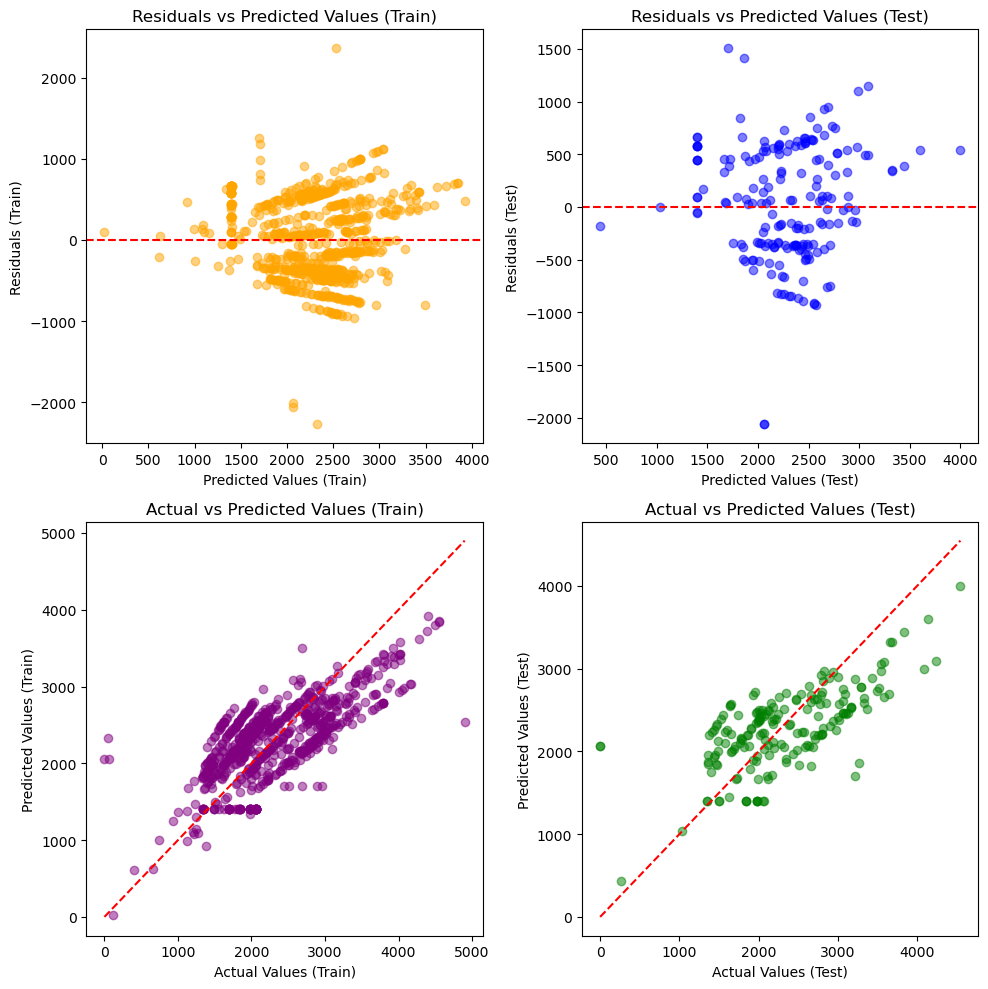

{'Model': 'Linear Regression',
 'Training Time (s)': 9.92005181312561,
 'RMSE Train': 500.06651584083215,
 'RMSE Test': 549.0182766134297,
 'R2 Train': 0.5002243427111571,
 'R2 Test': 0.4462468692407625,
 'MAE Train': 423.01689323771376,
 'MAE Test': 448.62611348819587,
 'Mean Residual Train': 1.0717747151385373e-13,
 'Mean Residual Test': 45.21884697750974,
 'MAPE Train': 1.2157390041579408e+16,
 'MAPE Test': 9.883429014856547e+16}

In [37]:
lr_results = evaluate_model(LinearRegression(), 'Linear Regression')
results_df2.append(lr_results)
lr_results

### Ridge

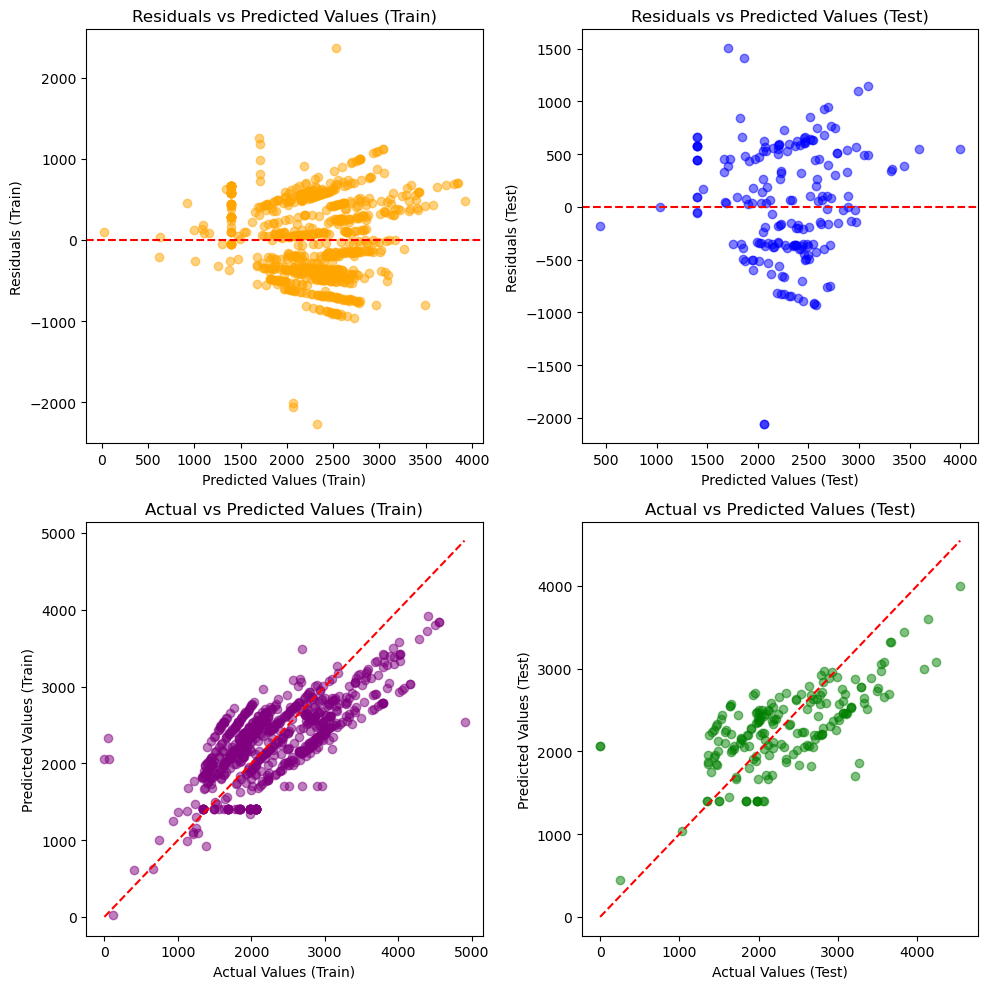

{'Model': 'Ridge',
 'Training Time (s)': 10.254157781600952,
 'RMSE Train': 500.0674464536058,
 'RMSE Test': 548.9927133832801,
 'R2 Train': 0.5002224871003671,
 'R2 Test': 0.4462984354263464,
 'MAE Train': 422.99633164465945,
 'MAE Test': 448.6130407165087,
 'Mean Residual Train': 1.259486670897264e-13,
 'Mean Residual Test': 45.18060196069582,
 'MAPE Train': 1.2150963525370398e+16,
 'MAPE Test': 9.879781154598549e+16}

In [38]:
ridge_results = evaluate_model(Ridge(random_state=42), 'Ridge')
results_df2.append(ridge_results)
ridge_results

### Lasso

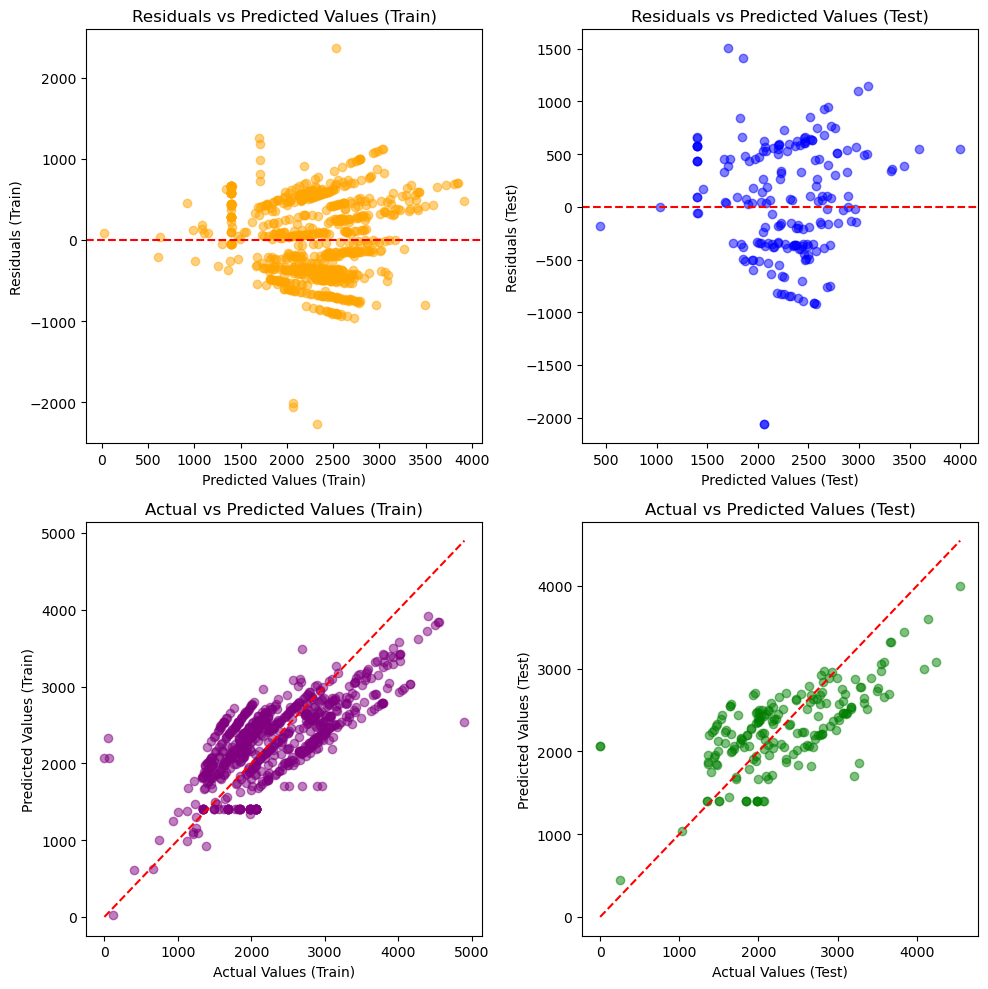

{'Model': 'Lasso',
 'Training Time (s)': 10.781116724014282,
 'RMSE Train': 500.0678742389437,
 'RMSE Test': 549.1143631984608,
 'R2 Train': 0.5002216294799229,
 'R2 Test': 0.4460530217654428,
 'MAE Train': 422.95172055245547,
 'MAE Test': 448.63803655181533,
 'Mean Residual Train': 1.0293881444833409e-13,
 'Mean Residual Test': 45.19326664961663,
 'MAPE Train': 1.217054623517241e+16,
 'MAPE Test': 9.893644728981898e+16}

In [39]:
lasso_results = evaluate_model(Lasso(random_state=42), 'Lasso')
results_df2.append(lasso_results)
lasso_results

### Elastic Net

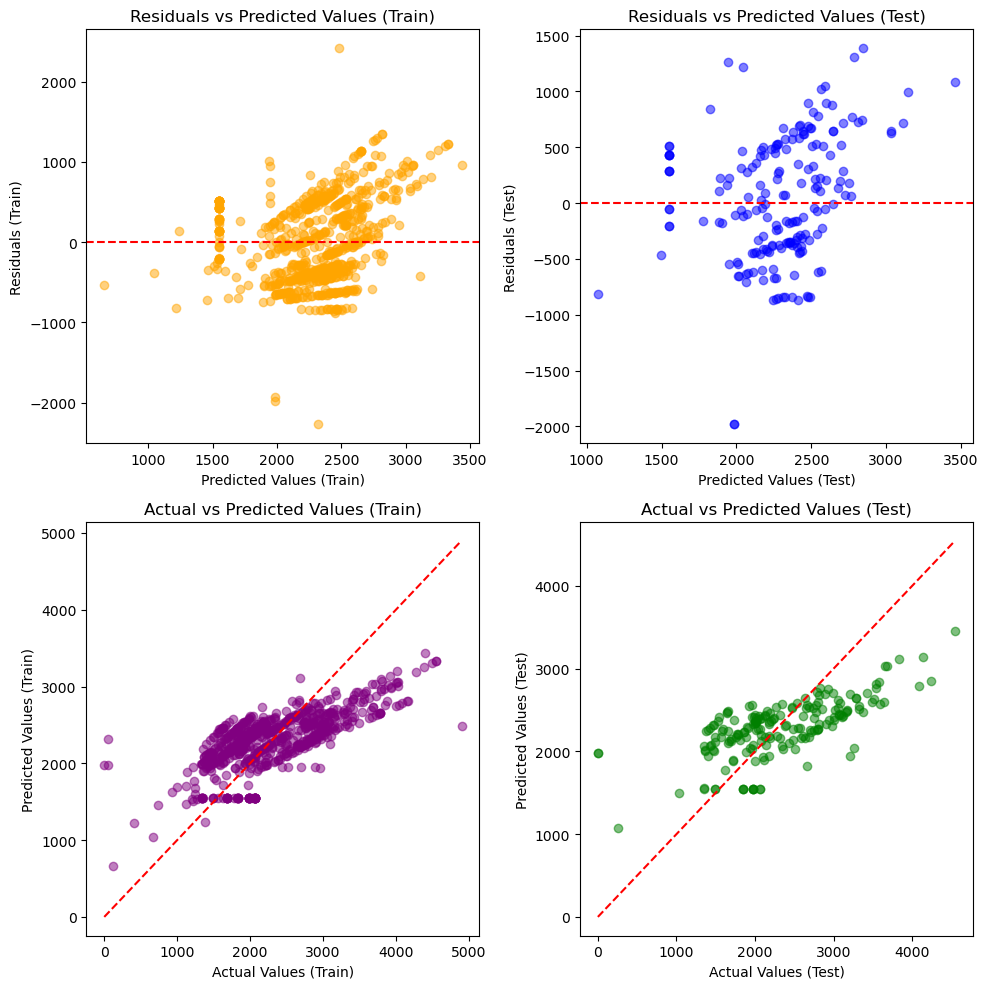

{'Model': 'Elastic Net',
 'Training Time (s)': 11.08955693244934,
 'RMSE Train': 522.4195672673349,
 'RMSE Test': 565.6254702436731,
 'R2 Train': 0.45469098683346987,
 'R2 Test': 0.412239352264686,
 'MAE Train': 437.46130902671183,
 'MAE Test': 466.36431369436065,
 'Mean Residual Train': 6.84240354862456e-14,
 'Mean Residual Test': 37.01102622811464,
 'MAPE Train': 1.1747237914776894e+16,
 'MAPE Test': 9.499705537427866e+16}

In [40]:
elastic_net_results = evaluate_model(ElasticNet(random_state=42), 'Elastic Net')
results_df2.append(elastic_net_results)
elastic_net_results

### Decision Tree

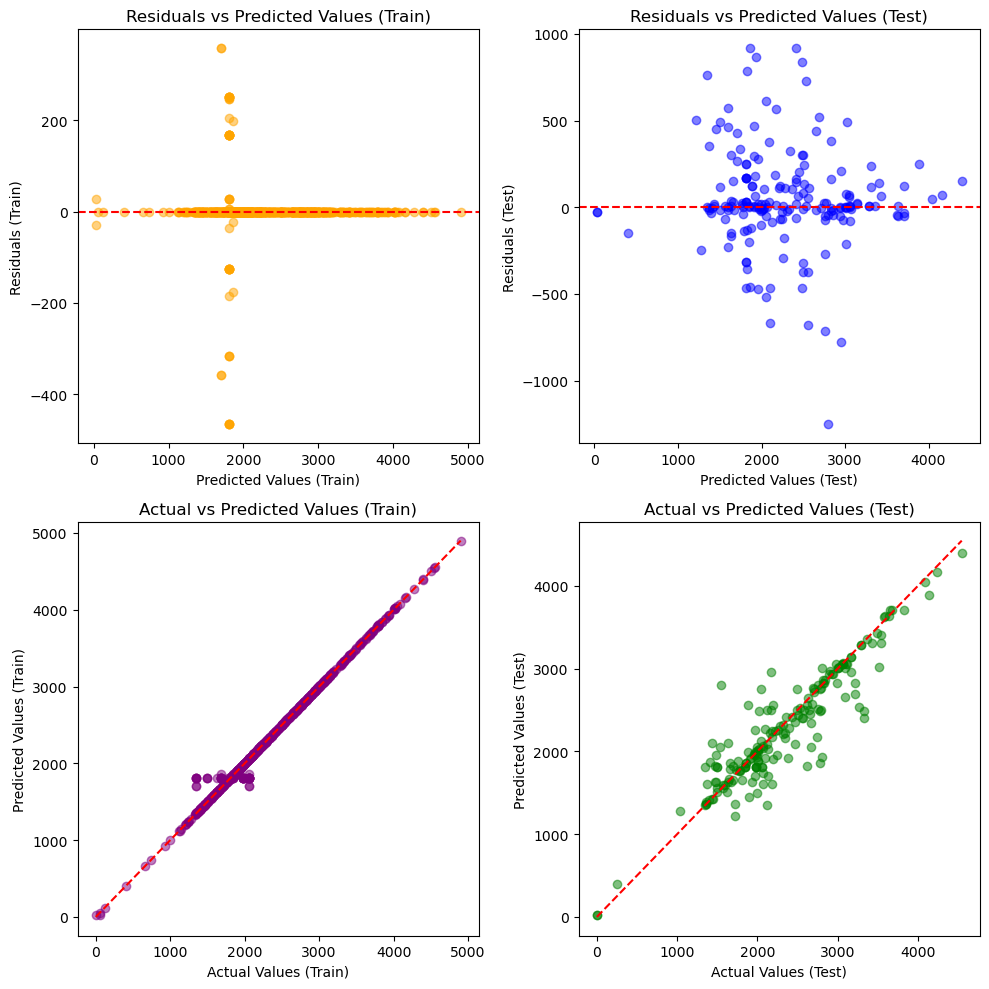

{'Model': 'Decision Tree',
 'Training Time (s)': 9.65763783454895,
 'RMSE Train': 62.23519768203073,
 'RMSE Test': 293.96908269405515,
 'R2 Train': 0.9922542388000289,
 'R2 Test': 0.8412382400407212,
 'MAE Train': 13.84922917800762,
 'MAE Test': 183.60070921985817,
 'Mean Residual Train': 6.05522437931377e-16,
 'Mean Residual Test': 45.69078014184397,
 'MAPE Train': 170965990644629.66,
 'MAPE Test': 1365453078511267.5}

In [41]:
dt_results = evaluate_model(DecisionTreeRegressor(random_state=42), 'Decision Tree')
results_df2.append(dt_results)
dt_results

### XGBoost

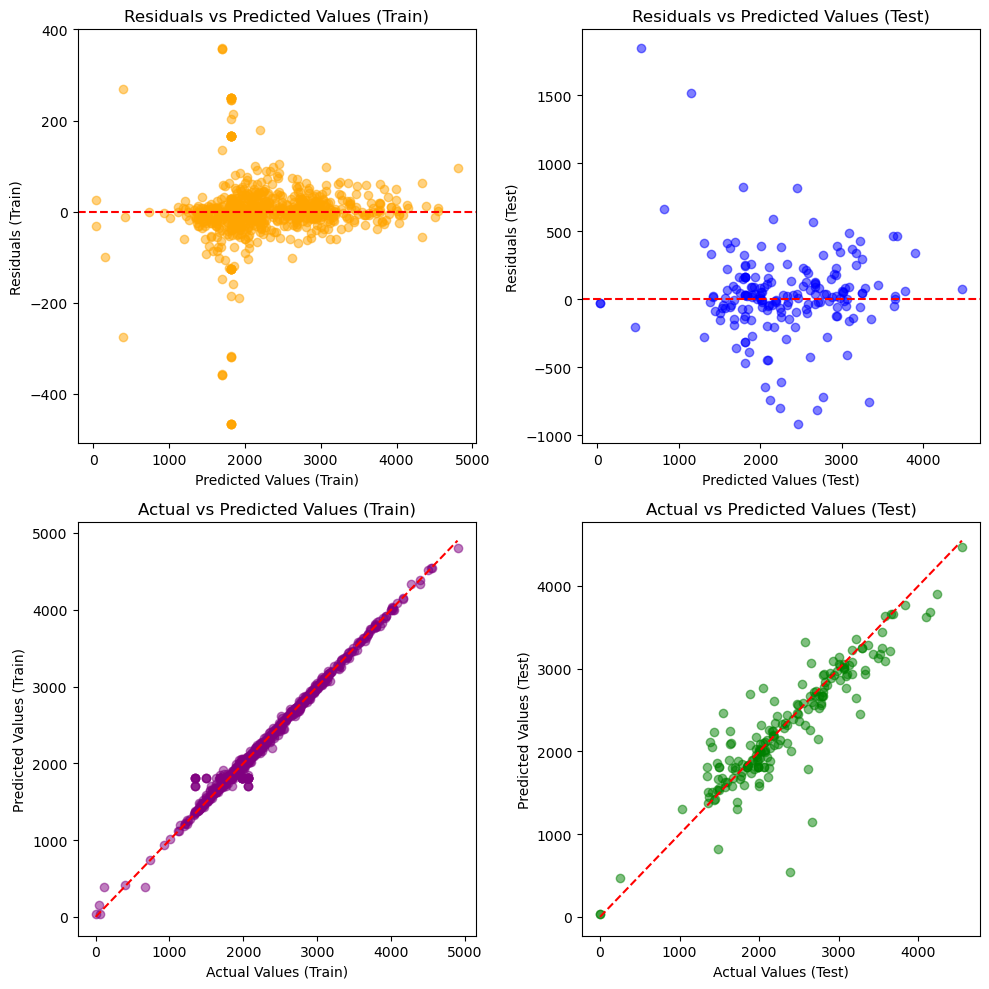

{'Model': 'XGBoost',
 'Training Time (s)': 13.807268619537354,
 'RMSE Train': 68.63732791881654,
 'RMSE Test': 318.5016135730321,
 'R2 Train': 0.9906025028028349,
 'R2 Test': 0.8136343518867863,
 'MAE Train': 30.185180392389046,
 'MAE Test': 197.71475637719988,
 'Mean Residual Train': 0.06983477393098265,
 'Mean Residual Test': 34.621411627911506,
 'MAPE Train': 216877223572360.6,
 'MAPE Test': 1540613724538923.5}

In [42]:
xgb_results = evaluate_model(XGBRegressor(random_state=42), 'XGBoost')
results_df2.append(xgb_results)
xgb_results

### Gradien Boosting

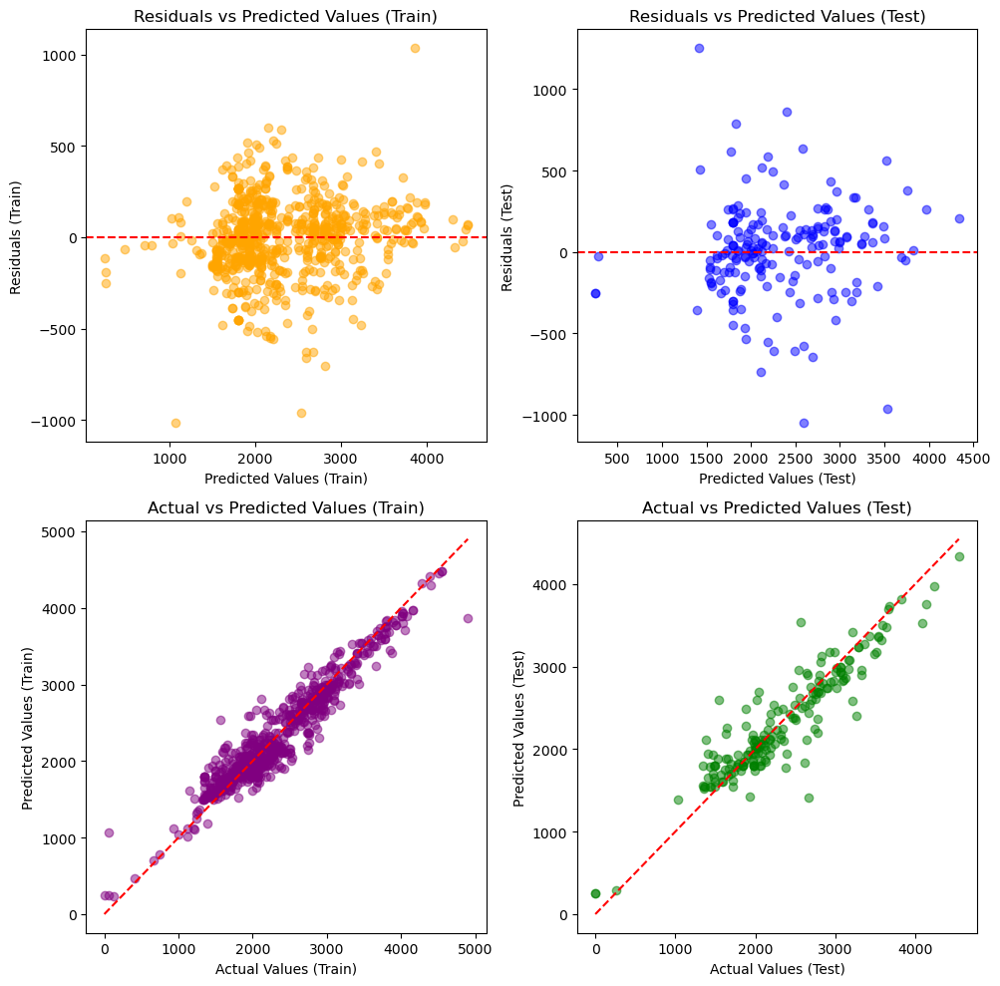

{'Model': 'Gradient Boosting',
 'Training Time (s)': 12.568739414215088,
 'RMSE Train': 193.64666900042235,
 'RMSE Test': 289.3680776592587,
 'R2 Train': 0.924887668284795,
 'R2 Test': 0.8461690122769358,
 'MAE Train': 146.01293958265978,
 'MAE Test': 204.92822312088816,
 'Mean Residual Train': 1.840788211311386e-13,
 'Mean Residual Test': 12.83879233087178,
 'MAPE Train': 1400300040659903.8,
 'MAPE Test': 1.1952146169683628e+16}

In [43]:
gb_results = evaluate_model(GradientBoostingRegressor(random_state=42), 'Gradient Boosting')
results_df2.append(gb_results)
gb_results

### Support Vector Regressor

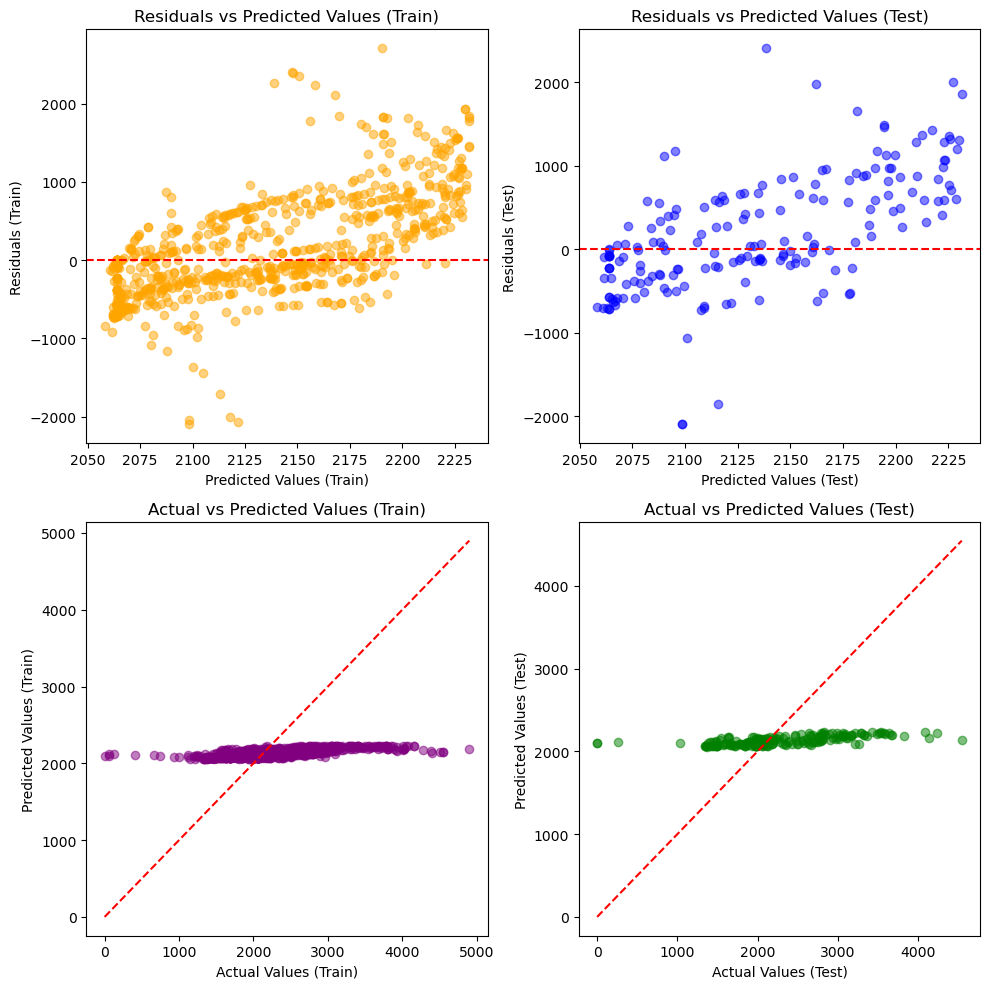

{'Model': 'Support Vector Regressor',
 'Training Time (s)': 11.490458011627197,
 'RMSE Train': 704.0088539684815,
 'RMSE Test': 728.4906725698453,
 'R2 Train': 0.010764485263813425,
 'R2 Test': 0.025031507013574705,
 'MAE Train': 530.4857805242576,
 'MAE Test': 554.9249278837118,
 'Mean Residual Train': 165.63210297693212,
 'Mean Residual Test': 190.93005219666512,
 'MAPE Train': 1.2627647545088614e+16,
 'MAPE Test': 1.0053992890824877e+17}

In [44]:
svr_results = evaluate_model(SVR(), 'Support Vector Regressor')
results_df2.append(svr_results)
svr_results

### Bayesian Ridge

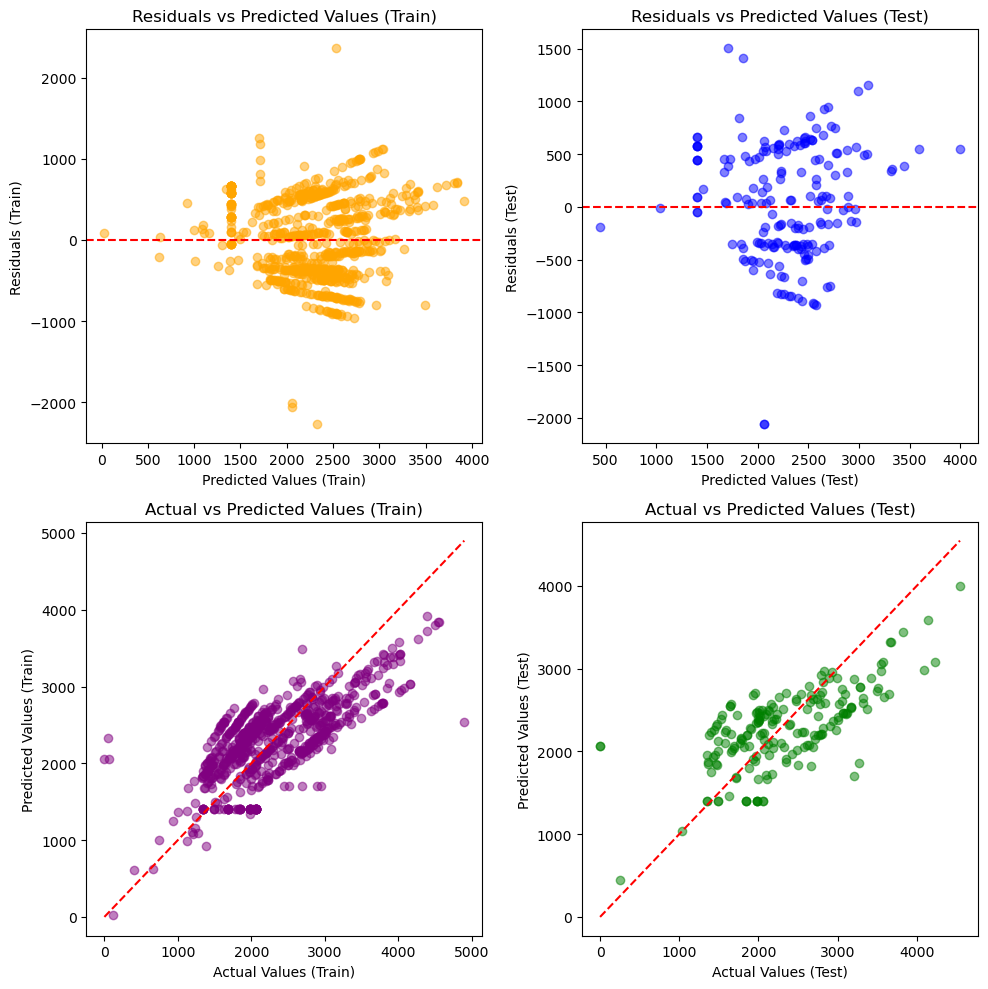

{'Model': 'Bayesian Ridge',
 'Training Time (s)': 11.517083406448364,
 'RMSE Train': 500.0715476222929,
 'RMSE Test': 548.9601043033133,
 'R2 Train': 0.5002142361948425,
 'R2 Test': 0.44636421102562274,
 'MAE Train': 422.97015166856295,
 'MAE Test': 448.60274887272493,
 'Mean Residual Train': 1.053609042000596e-13,
 'Mean Residual Test': 45.12991595706952,
 'MAPE Train': 1.2143355095182074e+16,
 'MAPE Test': 9.874969156242546e+16}

In [45]:
br_results = evaluate_model(BayesianRidge(), 'Bayesian Ridge')
results_df2.append(br_results)
br_results

### CatBoost regressor

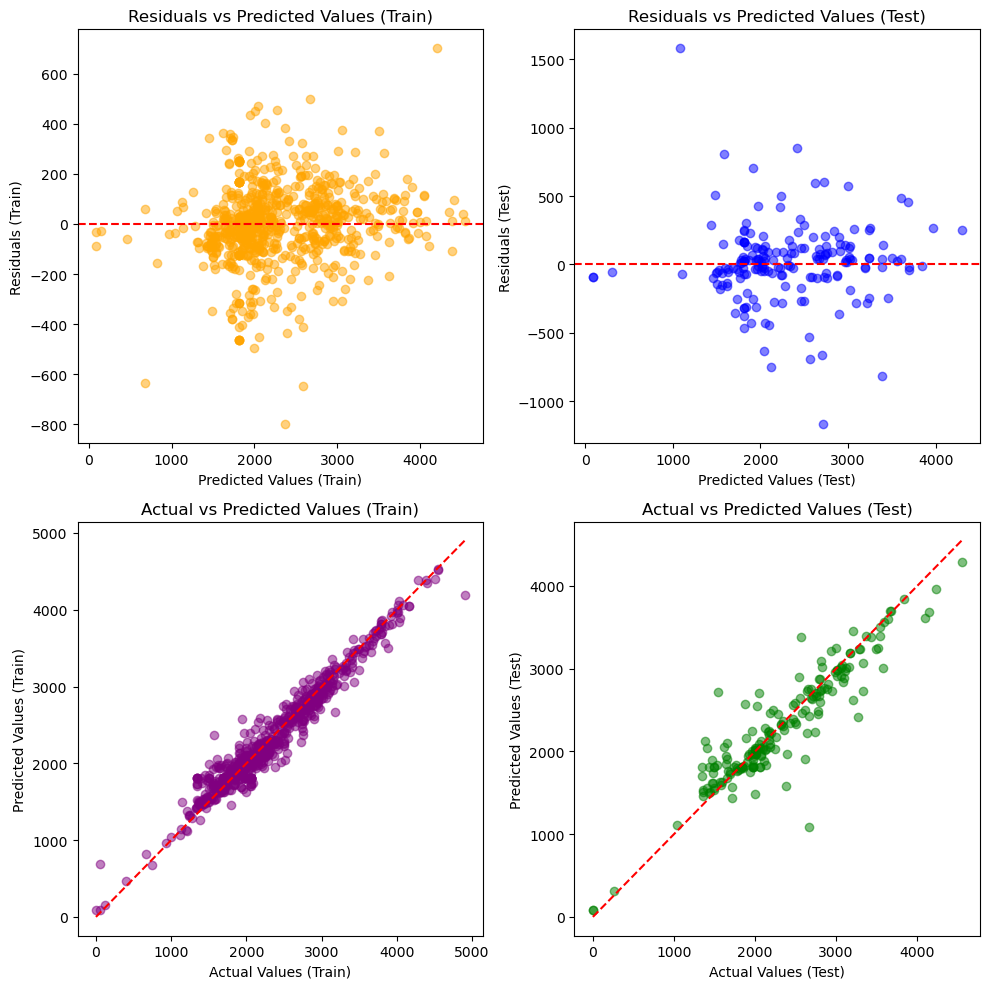

{'Model': 'CatBoost Regressor',
 'Training Time (s)': 58.37767434120178,
 'RMSE Train': 143.366614976717,
 'RMSE Test': 286.216807085514,
 'R2 Train': 0.9588736487382379,
 'R2 Test': 0.8495012629538069,
 'MAE Train': 104.84037307903702,
 'MAE Test': 184.0713300854124,
 'Mean Residual Train': -0.13766637098498394,
 'Mean Residual Test': 13.40771468423478,
 'MAPE Train': 506176404849028.56,
 'MAPE Test': 4226155505704960.0}

In [46]:
cb_results = evaluate_model(CatBoostRegressor(random_state=42, silent=True), 'CatBoost Regressor')
results_df2.append(cb_results)
cb_results

### LightGBM Regressor

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 334
[LightGBM] [Info] Number of data points in the train set: 500, number of used features: 2
[LightGBM] [Info] Start training from score 2315.098000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

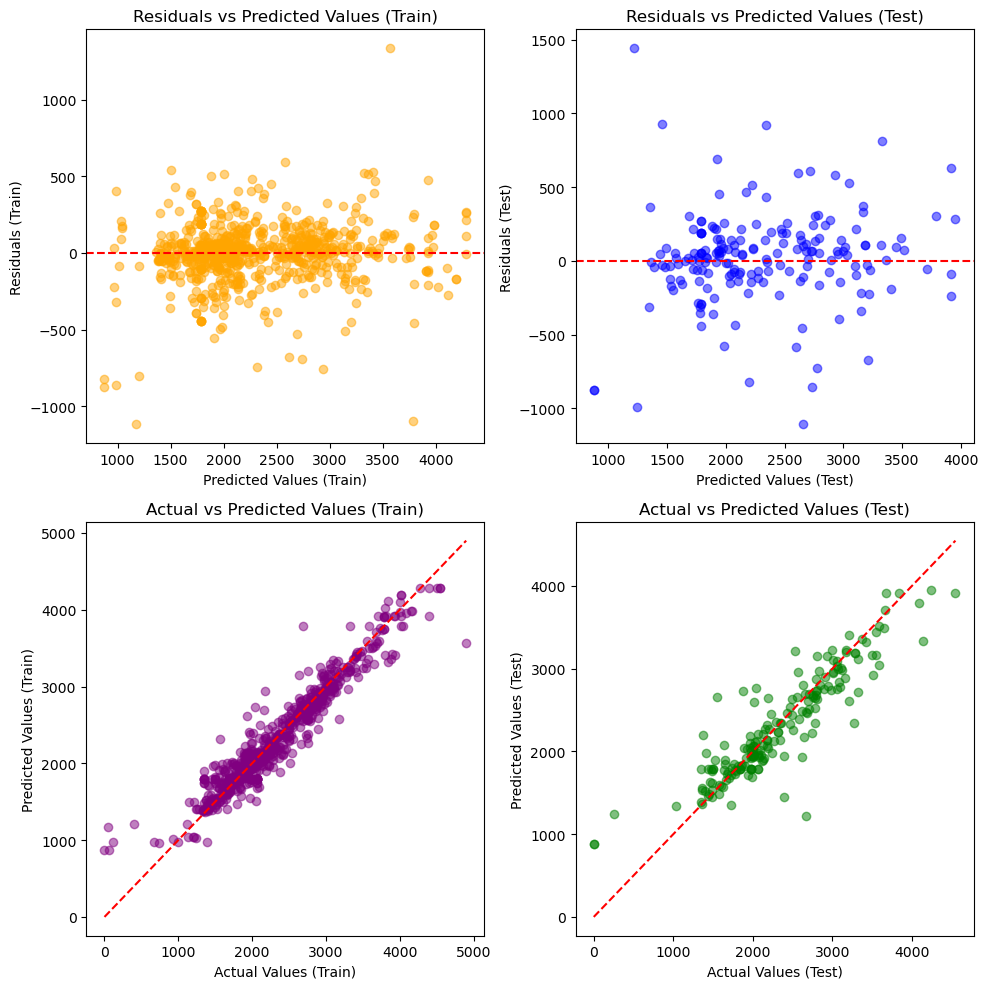

{'Model': 'LightGBM Regressor',
 'Training Time (s)': 9.786568880081177,
 'RMSE Train': 224.34089482119873,
 'RMSE Test': 319.84756718660196,
 'R2 Train': 0.8990726802986816,
 'R2 Test': 0.812055901309193,
 'MAE Train': 148.94553692731628,
 'MAE Test': 212.87112731939635,
 'Mean Residual Train': 6.599168909270518e-08,
 'Mean Residual Test': 20.331683094707014,
 'MAPE Train': 5736843855203081.0,
 'MAPE Test': 4.201585058683531e+16}

In [47]:
lgbm_results = evaluate_model(LGBMRegressor(random_state=42), 'LightGBM Regressor')
results_df2.append(lgbm_results)
lgbm_results

### Extra Trees Regressor

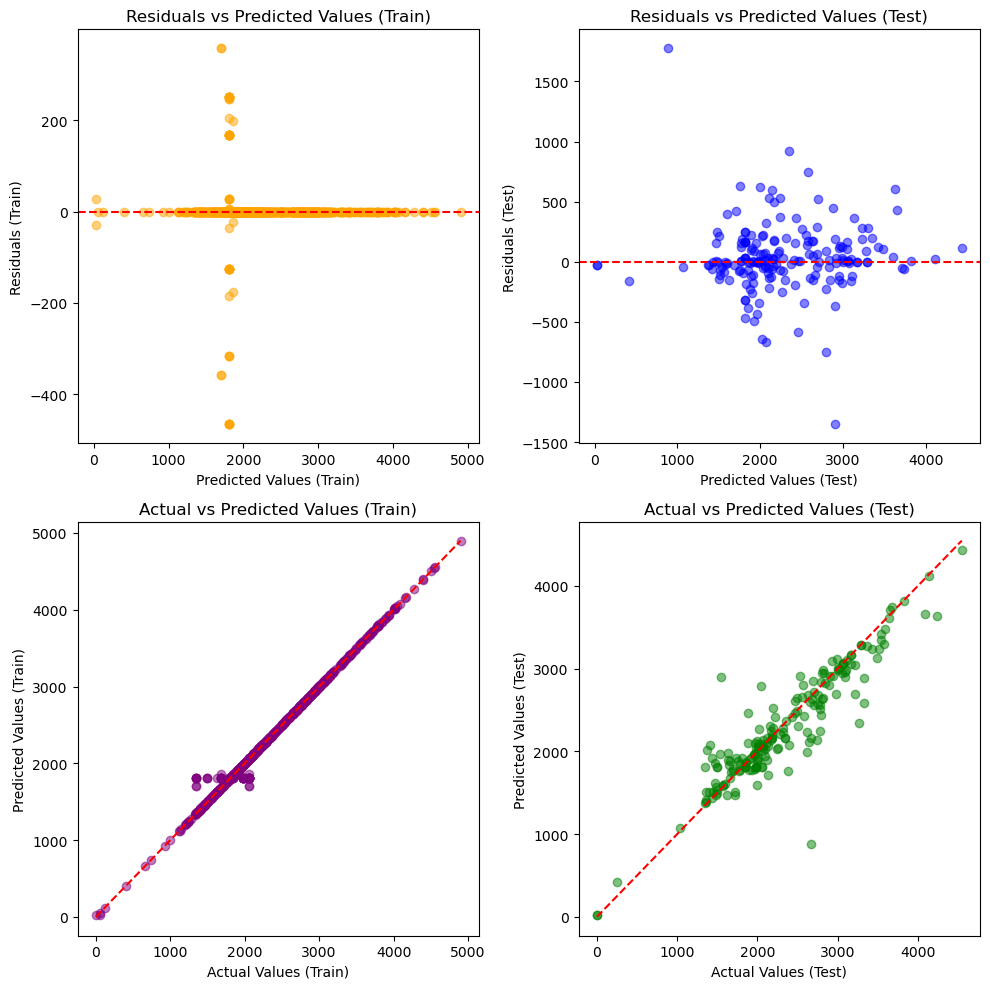

{'Model': 'Extra Trees Regressor',
 'Training Time (s)': 14.053421974182129,
 'RMSE Train': 62.23519795231834,
 'RMSE Test': 289.0282720842838,
 'R2 Train': 0.9922542387312759,
 'R2 Test': 0.8465300882858983,
 'MAE Train': 13.84946869896571,
 'MAE Test': 176.99039007092205,
 'Mean Residual Train': 1.368480709724912e-13,
 'Mean Residual Test': 35.61641843971646,
 'MAPE Train': 170965990644629.66,
 'MAPE Test': 1365453078511267.5}

In [48]:
et_results = evaluate_model(ExtraTreesRegressor(random_state=42), 'Extra Trees Regressor')
results_df2.append(et_results)
et_results

## Hasil: Baseline

In [49]:
results_df = pd.DataFrame(results_df2)

results_df['RMSE Difference'] = results_df['RMSE Test'] - results_df['RMSE Train']
results_df['R2 Difference'] = results_df['R2 Test'] - results_df['R2 Train']
results_df['MAE Difference'] = results_df['MAE Test'] - results_df['MAE Train']
results_df['MAPE Difference'] = results_df['MAPE Test'] - results_df['MAPE Train']

# Menentukan urutan kolom yang diinginkan
columns_order = [
    'Model', 'Training Time (s)', 
    'RMSE Train', 'RMSE Test', 'RMSE Difference',
    'R2 Train', 'R2 Test', 'R2 Difference',
    'MAE Train', 'MAE Test', 'MAE Difference',
    'Mean Residual Train', 'Mean Residual Test',
    'MAPE Train', 'MAPE Test', 'MAPE Difference'
]

# Mengatur urutan kolom dan mengurutkan hasil berdasarkan beberapa metrik
results_df = results_df[columns_order].sort_values(
    by=['MAE Difference'],
    ascending=[True]
)

pd.options.display.float_format = '{:.4f}'.format
# Tampilkan DataFrame hasil
results_df

,Model,Training Time (s),RMSE Train,RMSE Test,RMSE Difference,R2 Train,R2 Test,R2 Difference,MAE Train,MAE Test,MAE Difference,Mean Residual Train,Mean Residual Test,MAPE Train,MAPE Test,MAPE Difference
8,Support Vector Regressor,11.4905,704.0089,728.4907,24.4818,0.0108,0.0250,0.0143,530.4858,554.9249,24.4391,165.6321,190.9301,12627647545088614.0000,100539928908248768.0000,87912281363160160.0000
1,Linear Regression,9.9201,500.0665,549.0183,48.9518,0.5002,0.4462,-0.0540,423.0169,448.6261,25.6092,0.0000,45.2188,12157390041579408.0000,98834290148565472.0000,86676900106986064.0000
2,Ridge,10.2542,500.0674,548.9927,48.9253,0.5002,0.4463,-0.0539,422.9963,448.6130,25.6167,0.0000,45.1806,12150963525370398.0000,98797811545985488.0000,86646848020615088.0000
9,Bayesian Ridge,11.5171,500.0715,548.9601,48.8886,0.5002,0.4464,-0.0539,422.9702,448.6027,25.6326,0.0000,45.1299,12143355095182074.0000,98749691562425456.0000,86606336467243376.0000
3,Lasso,10.7811,500.0679,549.1144,49.0465,0.5002,0.4461,-0.0542,422.9517,448.6380,25.6863,0.0000,45.1933,12170546235172410.0000,98936447289818976.0000,86765901054646560.0000
4,Elastic Net,11.0896,522.4196,565.6255,43.2059,0.4547,0.4122,-0.0425,437.4613,466.3643,28.9030,0.0000,37.0110,11747237914776894.0000,94997055374278656.0000,83249817459501760.0000
7,Gradient Boosting,12.5687,193.6467,289.3681,95.7214,0.9249,0.8462,-0.0787,146.0129,204.9282,58.9153,0.0000,12.8388,1400300040659903.7500,11952146169683628.0000,10551846129023724.0000
11,LightGBM Regressor,9.7866,224.3409,319.8476,95.5067,0.8991,0.8121,-0.0870,148.9455,212.8711,63.9256,0.0000,20.3317,5736843855203081.0000,42015850586835312.0000,36279006731632232.0000
10,CatBoost Regressor,58.3777,143.3666,286.2168,142.8502,0.9589,0.8495,-0.1094,104.8404,184.0713,79.2310,-0.1377,13.4077,506176404849028.5625,4226155505704960.0000,3719979100855931.5000
0,Random Forest,19.3406,128.8939,274.5877,145.6938,0.9667,0.8615,-0.1052,85.3687,183.9541,98.5854,-2.3293,30.7446,1413318613286643.2500,12702402748998484.0000,11289084135711840.0000


Data tersebut diurutkan berdasarkan MAE Test terkecil, dengan syarat perbedaan score dengan MAE Train tidak terlalu besar. Sehingga dapat disimpulkan 2 model terbaik pada dataset dengan menggunakan 2 feature saja adalah model: CatBoost Regressor dan Gradien Boosting

In [56]:
df_best = results_df[results_df["Model"].isin(["CatBoost Regressor", "Gradient Boosting"])]
df_best[['Model','MAE Test']]

,Model,MAE Test
1,Gradient Boosting,185.4488


## Feature Importance

### Gradien Boosting

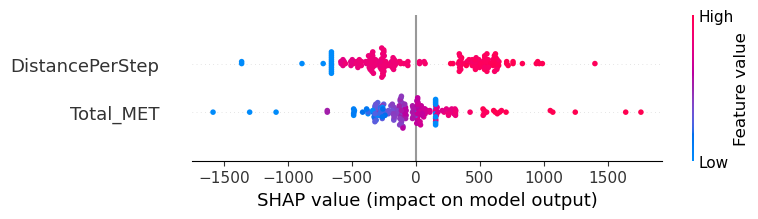

In [50]:
model = GradientBoostingRegressor(random_state=42)
model.fit(X_train, y_train)

# Use TreeExplainer for tree-based models
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test)

### CatBoost Regressor

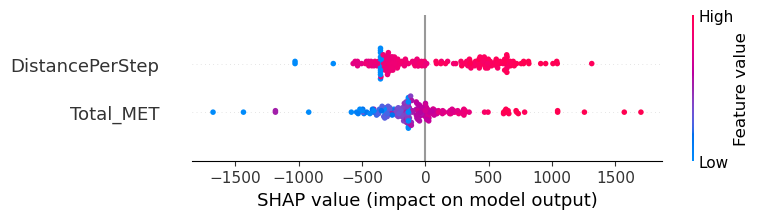

In [51]:
model = CatBoostRegressor(random_state=42, silent=True)
model.fit(X_train, y_train)

# Use TreeExplainer for tree-based models
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test)

## Model: Tuning

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import KFold

def evaluate_model(model, model_name):
    start_time = time.time()
    
    # Inisialisasi K-Fold
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    
    rmse_train_list = []
    r2_train_list = []
    mae_train_list = []
    mape_train_list = []
    
    # K-Fold Cross Validation
    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
        
        # Latih model pada lipatan
        model.fit(X_train_fold, y_train_fold)
        y_train_pred = model.predict(X_train_fold)
        y_val_pred = model.predict(X_val_fold)
        
        # Hitung metrik untuk lipatan
        rmse_train_list.append(np.sqrt(mean_squared_error(y_train_fold, y_train_pred)))
        r2_train_list.append(r2_score(y_train_fold, y_train_pred))
        mae_train_list.append(mean_absolute_error(y_train_fold, y_train_pred))
        mape_train_list.append(mean_absolute_percentage_error(y_train_fold, y_train_pred))

    # Rata-rata metrik untuk data latih
    rmse_train = np.mean(rmse_train_list)
    r2_train = np.mean(r2_train_list)
    mae_train = np.mean(mae_train_list)
    mape_train = np.mean(mape_train_list)

    # Latih model dengan semua data latih untuk evaluasi
    model.fit(X_train, y_train)
    
    # Hitung prediksi untuk data uji
    y_test_pred = model.predict(X_test)
    
    # Hitung metrik untuk data uji
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2_test = r2_score(y_test, y_test_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_test_pred)

    # Hitung residual untuk data latih dan data uji
    y_train_pred = model.predict(X_train)  # Prediksi pada seluruh data latih
    residuals_train = y_train - y_train_pred
    residuals_test = y_test - y_test_pred
    mean_residual_train = np.mean(residuals_train)
    mean_residual_test = np.mean(residuals_test)

    plt.figure(figsize=(10, 10))

    # Residuals vs Predicted Values (Train)
    plt.subplot(2, 2, 1)
    plt.scatter(y_train_pred, residuals_train, color='orange', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Train)')
    plt.xlabel('Predicted Values (Train)')
    plt.ylabel('Residuals (Train)')

    # Residuals vs Predicted Values (Test)
    plt.subplot(2, 2, 2)
    plt.scatter(y_test_pred, residuals_test, color='blue', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Test)')
    plt.xlabel('Predicted Values (Test)')
    plt.ylabel('Residuals (Test)')

    # Actual vs Predicted Values (Train)
    plt.subplot(2, 2, 3)
    plt.scatter(y_train, y_train_pred, color='purple', alpha=0.5)
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Train)')
    plt.xlabel('Actual Values (Train)')
    plt.ylabel('Predicted Values (Train)')

    # Actual vs Predicted Values (Test)
    plt.subplot(2, 2, 4)
    plt.scatter(y_test, y_test_pred, color='green', alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Test)')
    plt.xlabel('Actual Values (Test)')
    plt.ylabel('Predicted Values (Test)')

    plt.tight_layout()
    plt.show()

    end_time = time.time()
    training_time = end_time - start_time

    return {
        'Model': model_name,
        'Training Time (s)': training_time,
        'RMSE Train': rmse_train,
        'RMSE Test': rmse_test,
        'R2 Train': r2_train,
        'R2 Test': r2_test,
        'MAE Train': mae_train,
        'MAE Test': mae_test,
        'Mean Residual Train': mean_residual_train,
        'Mean Residual Test': mean_residual_test,
        'MAPE Train': mape_train,
        'MAPE Test': mape_test
    }

results_tuning2 = []


### CatBoost Regressor

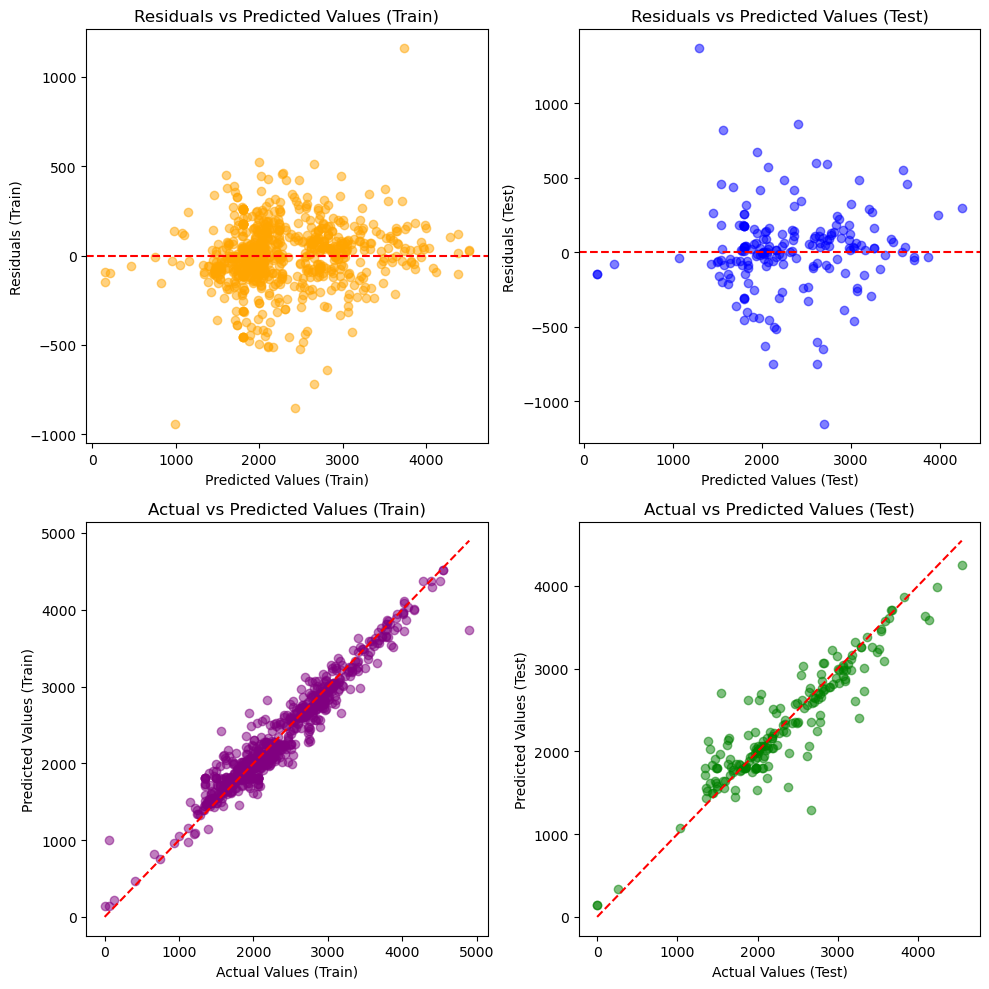

In [53]:
cat_params = {
    'depth': [None, 6, 8], 
    'iterations': [100, 200],
    'learning_rate': [0.01, 0.1],
    'l2_leaf_reg': [3, 5] 
}
cat_model = GridSearchCV(CatBoostRegressor(silent=True), cat_params, scoring='neg_mean_absolute_error', cv=3)
cat_model.fit(X_train, y_train)  # Fit model
results_tuning2.append(evaluate_model(cat_model.best_estimator_, 'CatBoost'))

### Gradien Boosting

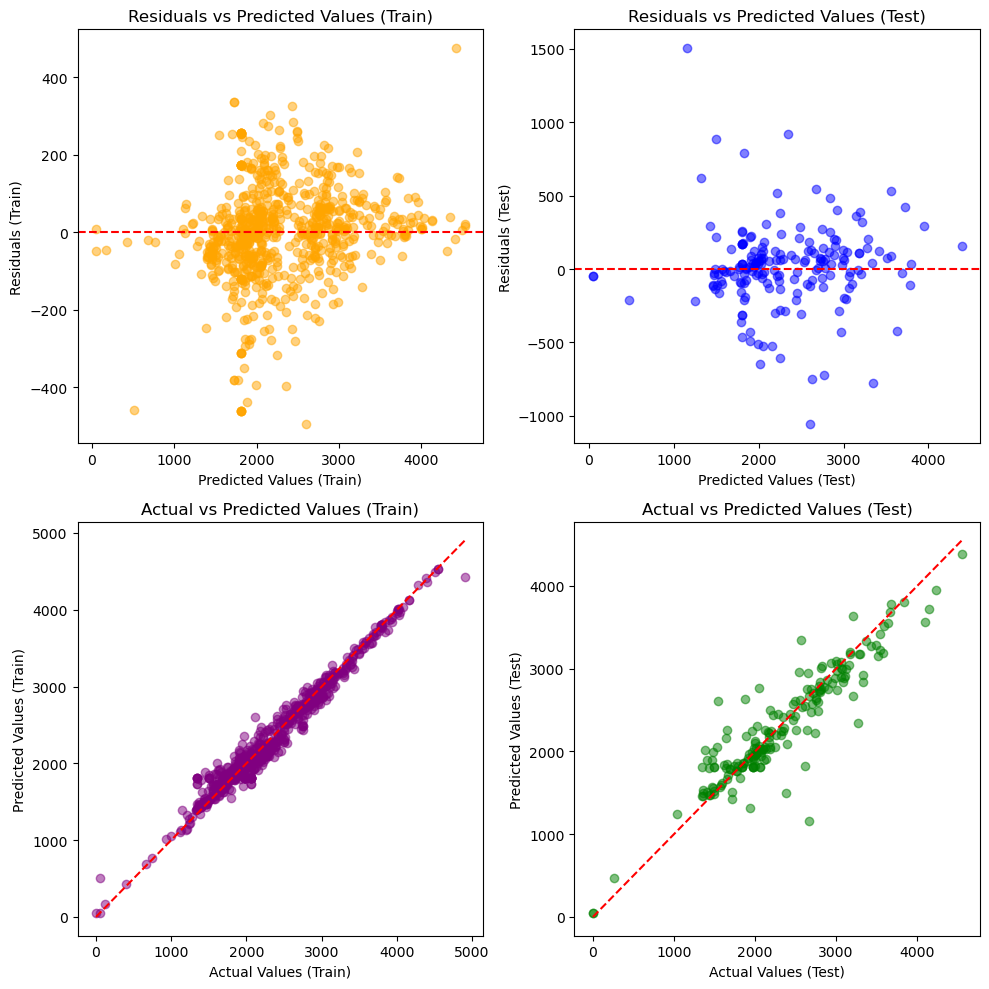

In [54]:
gb_params = {
    'n_estimators': [100, 200], 
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5]
}
gb_model = GridSearchCV(GradientBoostingRegressor(), gb_params, scoring='neg_mean_absolute_error', cv=3)
gb_model.fit(X_train, y_train)  # Fit model
results_tuning2.append(evaluate_model(gb_model.best_estimator_, 'Gradient Boosting'))

## Hasil: Tuning

In [55]:
results_df = pd.DataFrame(results_tuning2)

results_df['RMSE Difference'] = results_df['RMSE Test'] - results_df['RMSE Train']
results_df['R2 Difference'] = results_df['R2 Test'] - results_df['R2 Train']
results_df['MAE Difference'] = results_df['MAE Test'] - results_df['MAE Train']
results_df['MAPE Difference'] = results_df['MAPE Test'] - results_df['MAPE Train']

results_df = results_df[columns_order].sort_values(by=['RMSE Test','RMSE Train','RMSE Difference'],ascending=[True,True,True])

results_df

,Model,Training Time (s),RMSE Train,RMSE Test,RMSE Difference,R2 Train,R2 Test,R2 Difference,MAE Train,MAE Test,MAE Difference,Mean Residual Train,Mean Residual Test,MAPE Train,MAPE Test,MAPE Difference
1,Gradient Boosting,9.6797,103.8699,285.4604,181.5905,0.9784,0.8503,-0.1281,73.1748,185.4488,112.2740,-0.0000,16.9006,500595322846767.2500,2292504671094428.0000,1791909348247660.7500
0,CatBoost,19.5878,166.2121,285.8592,119.6471,0.9445,0.8499,-0.0946,121.0922,189.2760,68.1838,-0.2292,14.2683,1130687740991588.7500,7093334311878286.0000,5962646570886697.0000


Hasil tuning pada percobaan ini tidak menunjukkan hasil yang lebih baik daripada percobaan pada baseline.

# Dataset Feature Selection (Corr)

In [58]:
tr = 'C:/Users/Lenovo/Downloads/FitbitTrainData.csv'
ts = 'C:/Users/Lenovo/Downloads/FitbitTestData.csv'
import pandas as pd
df_tr = pd.read_csv(tr)
df_ts = pd.read_csv(ts)

In [59]:
correlation_matrix = df_tr.corr()

# Menginisialisasi daftar untuk fitur yang akan dihapus
to_drop = set()  # Menggunakan set untuk menghindari duplikasi

# Menentukan threshold korelasi
threshold = 0.95  # Threshold yang ingin diterapkan
print(f"Threshold korelasi: {threshold}")

# Kolom yang akan diperiksa, kecuali 'Calories'
checking = [x for x in correlation_matrix.columns if x != 'Calories']

# Iterasi untuk menemukan fitur dengan korelasi tinggi
for feature in checking:
    # Mencari fitur yang berkorelasi tinggi dengan fitur saat ini
    high_corr_features = correlation_matrix.index[abs(correlation_matrix[feature]) >= threshold].tolist()
    high_corr_features.remove(feature)  # Menghindari pencocokan dengan dirinya sendiri

    # Jika ada fitur berkorelasi tinggi
    if high_corr_features:
        print(f"\nFitur: {feature} berkorelasi tinggi dengan fitur: {high_corr_features}")
        
        # Menyimpan fitur yang akan dihapus
        to_drop.add(feature)  # Awalnya tambahkan fitur yang sedang dipertimbangkan untuk dihapus
        target_corr = correlation_matrix[feature]['Calories']
        print(f"Korelasi {feature} dengan Calories: {target_corr}")

        # Tentukan fitur mana yang akan dipertahankan
        for correlated_feature in high_corr_features:
            correlated_target_corr = correlation_matrix[correlated_feature]['Calories']
            print(f"Korelasi {correlated_feature} dengan Calories: {correlated_target_corr}")

            if abs(correlated_target_corr) > abs(target_corr):
                # Jika fitur berkorelasi tinggi memiliki korelasi target lebih besar, pertahankan itu
                print(f"Mempertahankan {correlated_feature} karena memiliki korelasi target lebih tinggi.")
                to_drop.discard(feature)  # Hapus dari daftar penghapusan
            else:
                # Hapus fitur yang memiliki korelasi target lebih rendah
                print(f"Menghapus {correlated_feature} karena memiliki korelasi target lebih rendah.")
                to_drop.add(correlated_feature)

# Print fitur yang akan dihapus
print("\nFitur yang akan dihapus:", to_drop)


Threshold korelasi: 0.95

Fitur: TrackerDistance berkorelasi tinggi dengan fitur: ['TotalDistance', 'TotalActiveDistance', 'TotalSteps']
Korelasi TrackerDistance dengan Calories: 0.6525996289095429
Korelasi TotalDistance dengan Calories: 0.6521908266219412
Menghapus TotalDistance karena memiliki korelasi target lebih rendah.
Korelasi TotalActiveDistance dengan Calories: 0.6352891943171637
Menghapus TotalActiveDistance karena memiliki korelasi target lebih rendah.
Korelasi TotalSteps dengan Calories: 0.6018335628227416
Menghapus TotalSteps karena memiliki korelasi target lebih rendah.

Fitur: TotalDistance berkorelasi tinggi dengan fitur: ['TrackerDistance', 'TotalActiveDistance', 'TotalSteps']
Korelasi TotalDistance dengan Calories: 0.6521908266219412
Korelasi TrackerDistance dengan Calories: 0.6525996289095429
Mempertahankan TrackerDistance karena memiliki korelasi target lebih tinggi.
Korelasi TotalActiveDistance dengan Calories: 0.6352891943171637
Menghapus TotalActiveDistance karen

In [60]:
train = df_tr.drop(columns=list(to_drop))
test = df_ts.drop(columns=list(to_drop))

In [61]:
X_train = train.drop(columns=['Calories'])
y_train = train['Calories']
X_test = test.drop(columns=['Calories'])
y_test = test['Calories']

## Model: Baseline

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import KFold

def evaluate_model(model, model_name):
    start_time = time.time()
    
    # Inisialisasi K-Fold
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    
    rmse_train_list = []
    r2_train_list = []
    mae_train_list = []
    mape_train_list = []
    
    # K-Fold Cross Validation
    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
        
        # Latih model pada lipatan
        model.fit(X_train_fold, y_train_fold)
        y_train_pred = model.predict(X_train_fold)
        y_val_pred = model.predict(X_val_fold)
        
        # Hitung metrik untuk lipatan
        rmse_train_list.append(np.sqrt(mean_squared_error(y_train_fold, y_train_pred)))
        r2_train_list.append(r2_score(y_train_fold, y_train_pred))
        mae_train_list.append(mean_absolute_error(y_train_fold, y_train_pred))
        mape_train_list.append(mean_absolute_percentage_error(y_train_fold, y_train_pred))

    # Rata-rata metrik untuk data latih
    rmse_train = np.mean(rmse_train_list)
    r2_train = np.mean(r2_train_list)
    mae_train = np.mean(mae_train_list)
    mape_train = np.mean(mape_train_list)

    # Latih model dengan semua data latih untuk evaluasi
    model.fit(X_train, y_train)
    
    # Hitung prediksi untuk data uji
    y_test_pred = model.predict(X_test)
    
    # Hitung metrik untuk data uji
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2_test = r2_score(y_test, y_test_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_test_pred)

    # Hitung residual untuk data latih dan data uji
    y_train_pred = model.predict(X_train)  # Prediksi pada seluruh data latih
    residuals_train = y_train - y_train_pred
    residuals_test = y_test - y_test_pred
    mean_residual_train = np.mean(residuals_train)
    mean_residual_test = np.mean(residuals_test)

    plt.figure(figsize=(10, 10))

    # Residuals vs Predicted Values (Train)
    plt.subplot(2, 2, 1)
    plt.scatter(y_train_pred, residuals_train, color='orange', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Train)')
    plt.xlabel('Predicted Values (Train)')
    plt.ylabel('Residuals (Train)')

    # Residuals vs Predicted Values (Test)
    plt.subplot(2, 2, 2)
    plt.scatter(y_test_pred, residuals_test, color='blue', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residuals vs Predicted Values (Test)')
    plt.xlabel('Predicted Values (Test)')
    plt.ylabel('Residuals (Test)')

    # Actual vs Predicted Values (Train)
    plt.subplot(2, 2, 3)
    plt.scatter(y_train, y_train_pred, color='purple', alpha=0.5)
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Train)')
    plt.xlabel('Actual Values (Train)')
    plt.ylabel('Predicted Values (Train)')

    # Actual vs Predicted Values (Test)
    plt.subplot(2, 2, 4)
    plt.scatter(y_test, y_test_pred, color='green', alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Garis diagonal
    plt.title('Actual vs Predicted Values (Test)')
    plt.xlabel('Actual Values (Test)')
    plt.ylabel('Predicted Values (Test)')

    plt.tight_layout()
    plt.show()

    end_time = time.time()
    training_time = end_time - start_time

    return {
        'Model': model_name,
        'Training Time (s)': training_time,
        'RMSE Train': rmse_train,
        'RMSE Test': rmse_test,
        'R2 Train': r2_train,
        'R2 Test': r2_test,
        'MAE Train': mae_train,
        'MAE Test': mae_test,
        'Mean Residual Train': mean_residual_train,
        'Mean Residual Test': mean_residual_test,
        'MAPE Train': mape_train,
        'MAPE Test': mape_test
    }

results_df3 = []


### Random Forest

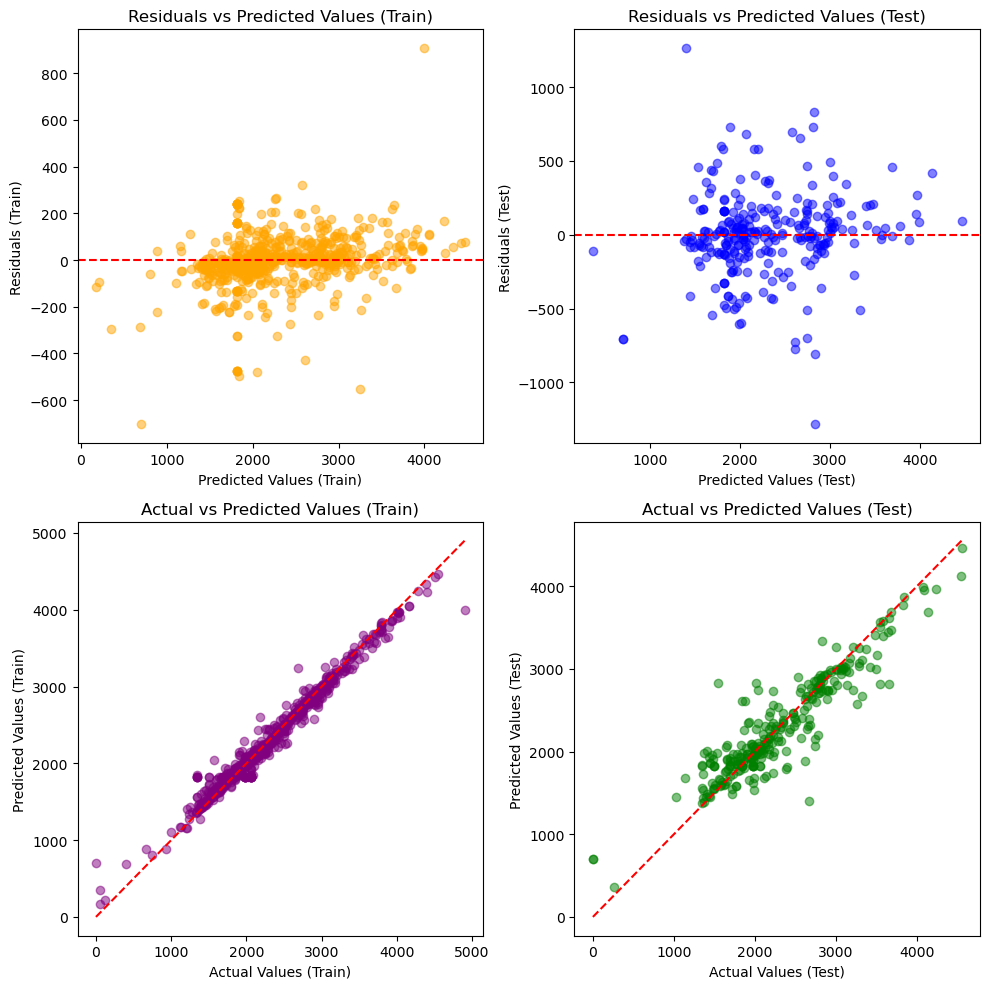

{'Model': 'Random Forest',
 'Training Time (s)': 25.481789588928223,
 'RMSE Train': 120.35258565695885,
 'RMSE Test': 282.9361705133206,
 'R2 Train': 0.9716352453474735,
 'R2 Test': 0.8415228136109776,
 'MAE Train': 78.92452650997278,
 'MAE Test': 191.68972609439913,
 'Mean Residual Train': -3.170700884039271,
 'Mean Residual Test': 1.1532244230847404,
 'MAPE Train': 4320919368512925.5,
 'MAPE Test': 2.248829354356557e+16}

In [63]:
rf_results = evaluate_model(RandomForestRegressor(random_state=42), 'Random Forest')
results_df3.append(rf_results)
rf_results

### Linear Regression

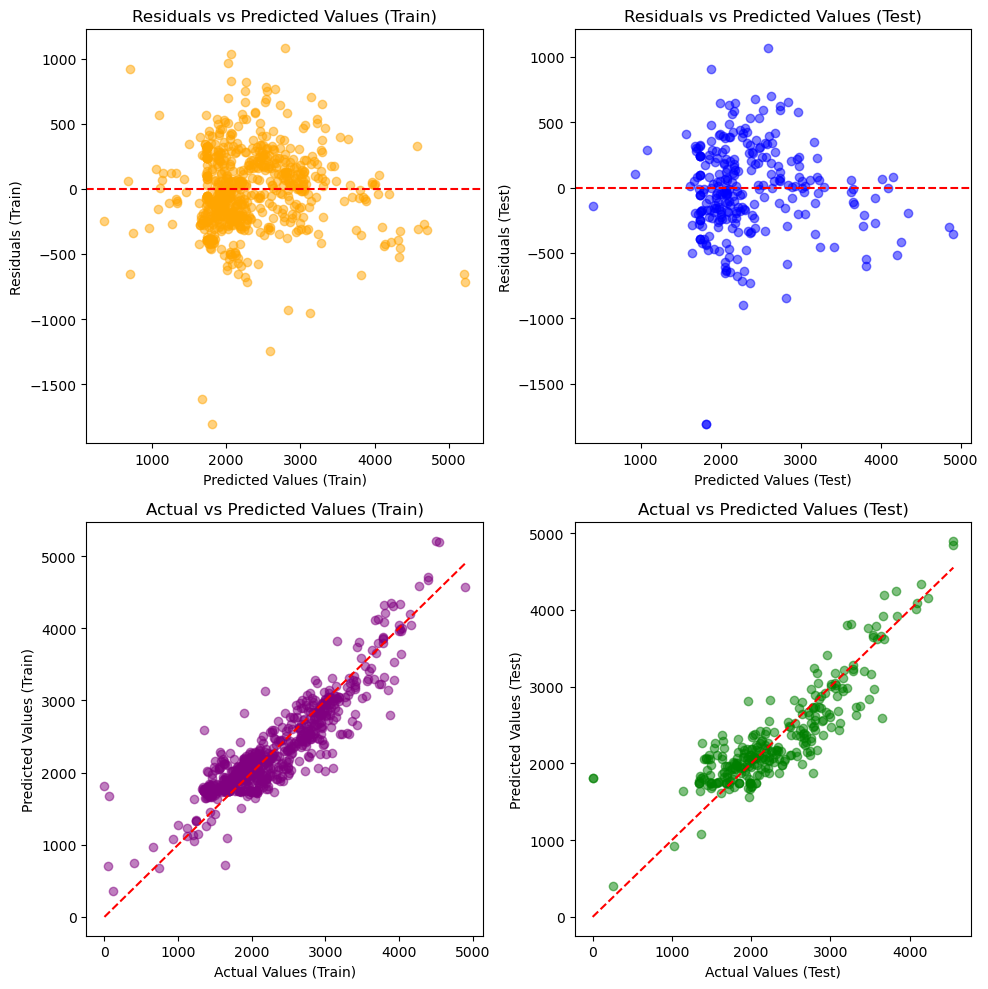

{'Model': 'Linear Regression',
 'Training Time (s)': 8.224844694137573,
 'RMSE Train': 303.5083919160655,
 'RMSE Test': 354.7762328992191,
 'R2 Train': 0.8196639870827201,
 'R2 Test': 0.7508282251093941,
 'MAE Train': 232.68522850542445,
 'MAE Test': 264.4763963270253,
 'Mean Residual Train': -4.7066696895402676e-14,
 'Mean Residual Test': -20.97648376337506,
 'MAPE Train': 1.2015279576740702e+16,
 'MAPE Test': 5.7823178723368824e+16}

In [64]:
lr_results = evaluate_model(LinearRegression(), 'Linear Regression')
results_df3.append(lr_results)
lr_results

### Ridge

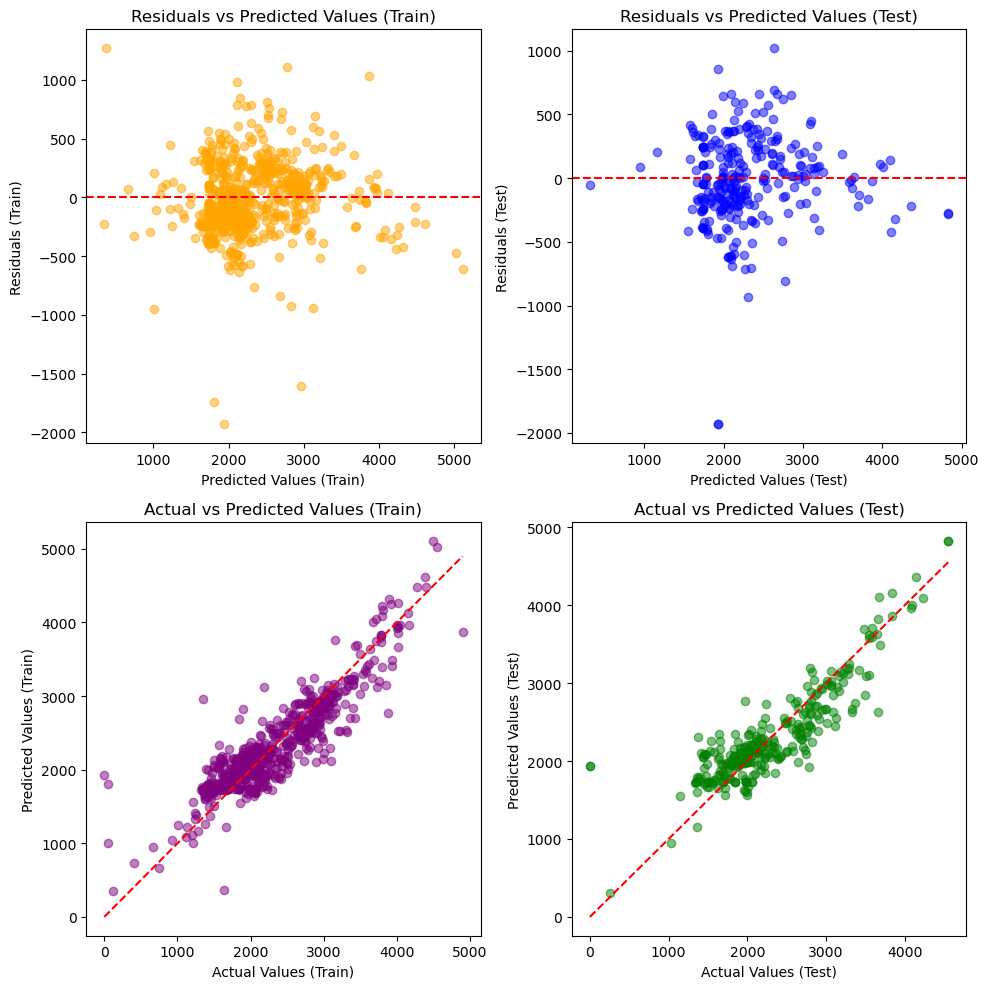

{'Model': 'Ridge',
 'Training Time (s)': 8.166405439376831,
 'RMSE Train': 312.6992508231676,
 'RMSE Test': 347.7770371180091,
 'R2 Train': 0.8086501979102346,
 'R2 Test': 0.7605628049426791,
 'MAE Train': 237.80530804938,
 'MAE Test': 254.86629664495212,
 'Mean Residual Train': 7.198435995767468e-14,
 'Mean Residual Test': -12.060997890913507,
 'MAPE Train': 1.3110022194097974e+16,
 'MAPE Test': 6.174501804296112e+16}

In [65]:
ridge_results = evaluate_model(Ridge(random_state=42), 'Ridge')
results_df3.append(ridge_results)
ridge_results

### Lasso

c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.173e+06, tolerance: 2.288e+04
  model = cd_fast.enet_coordinate_descent(
c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.014e+06, tolerance: 2.033e+04
  model = cd_fast.enet_coordinate_descent(
c:\Users\Lenovo\anacond3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.347e+06, toleranc

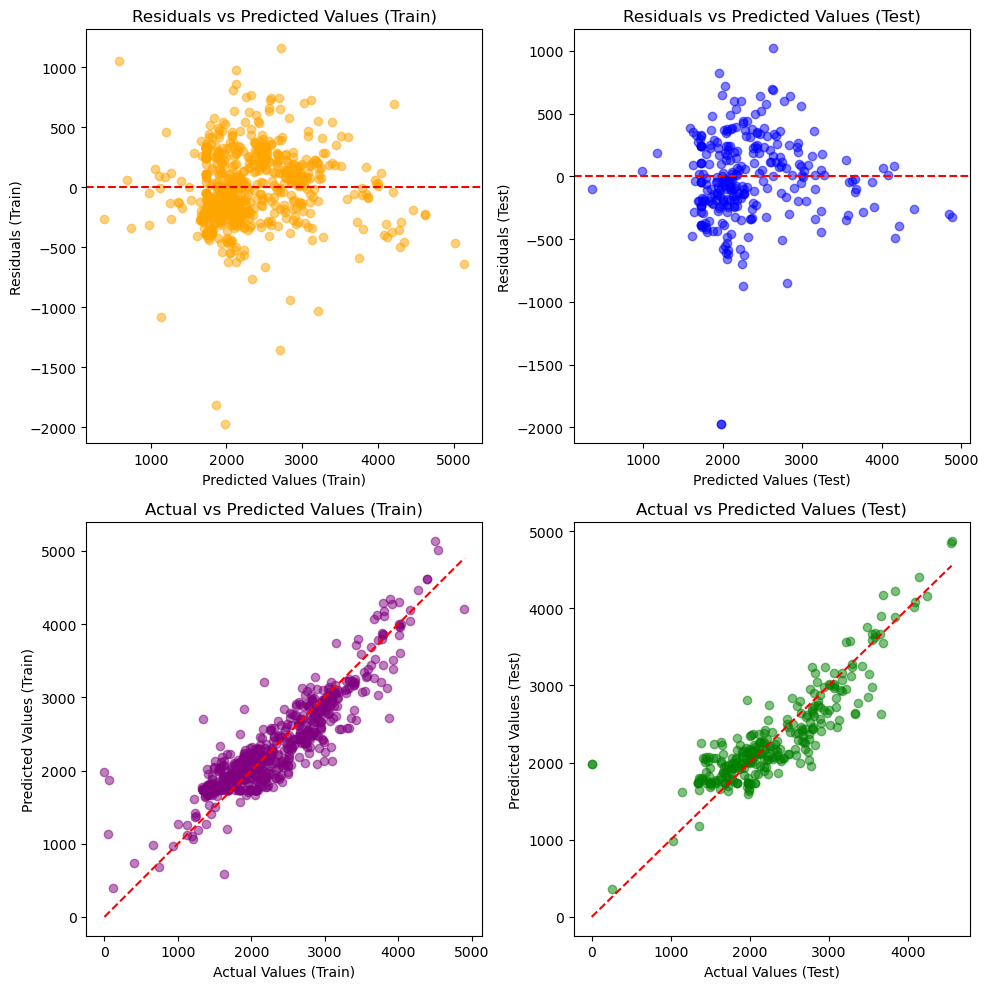

{'Model': 'Lasso',
 'Training Time (s)': 8.990415096282959,
 'RMSE Train': 306.5120458407678,
 'RMSE Test': 349.3120331548027,
 'R2 Train': 0.8160480455725692,
 'R2 Test': 0.7584445153046852,
 'MAE Train': 235.32131198247248,
 'MAE Test': 257.89437007987584,
 'Mean Residual Train': 1.8965110219618137e-13,
 'Mean Residual Test': -17.554626125153355,
 'MAPE Train': 1.3036561742897088e+16,
 'MAPE Test': 6.3111285680449656e+16}

In [66]:
lasso_results = evaluate_model(Lasso(random_state=42), 'Lasso')
results_df3.append(lasso_results)
lasso_results

### Elastic Net

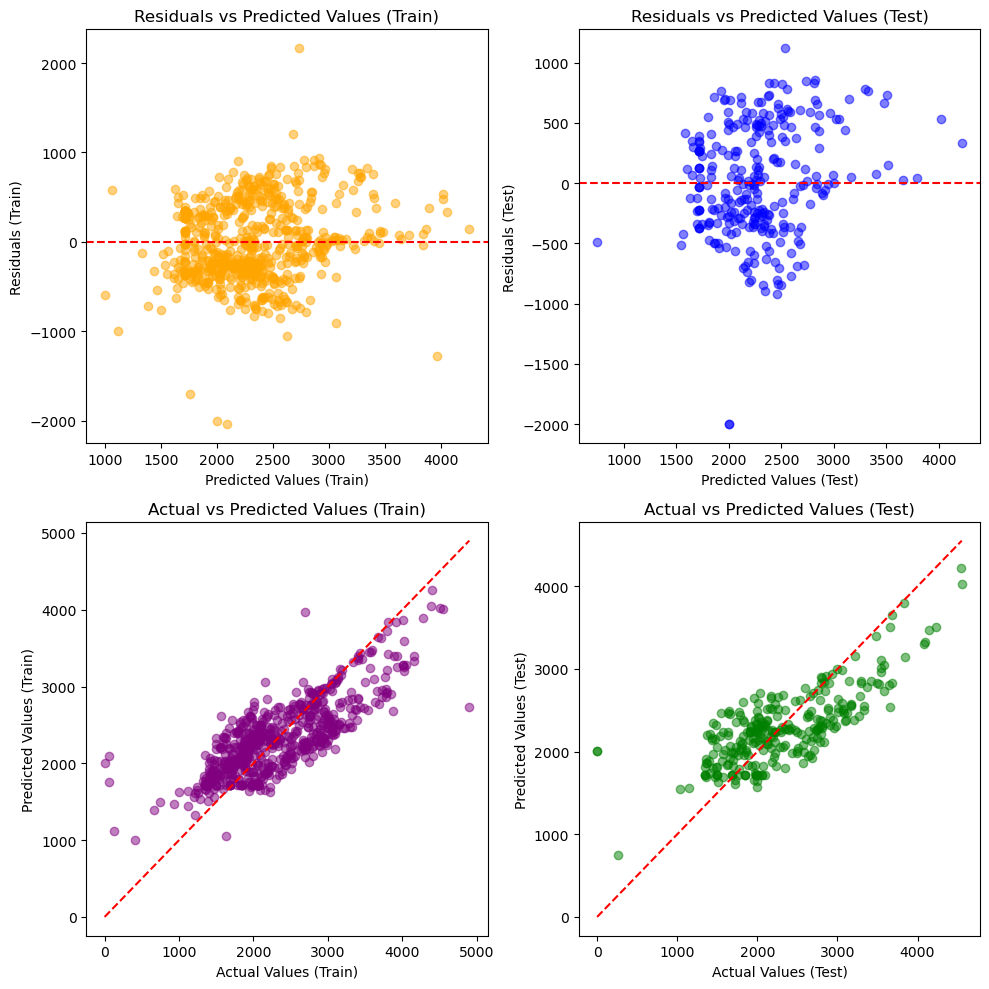

{'Model': 'Elastic Net',
 'Training Time (s)': 8.378008842468262,
 'RMSE Train': 441.27428453201446,
 'RMSE Test': 467.9691767390504,
 'R2 Train': 0.6181510087337693,
 'R2 Test': 0.5664648574123443,
 'MAE Train': 356.0789405102285,
 'MAE Test': 379.6896147248797,
 'Mean Residual Train': 1.4396871991534936e-13,
 'Mean Residual Test': 21.29914985307144,
 'MAPE Train': 1.3648921146107792e+16,
 'MAPE Test': 6.396153273109484e+16}

In [67]:
elastic_net_results = evaluate_model(ElasticNet(random_state=42), 'Elastic Net')
results_df3.append(elastic_net_results)
elastic_net_results

### Decision Tree

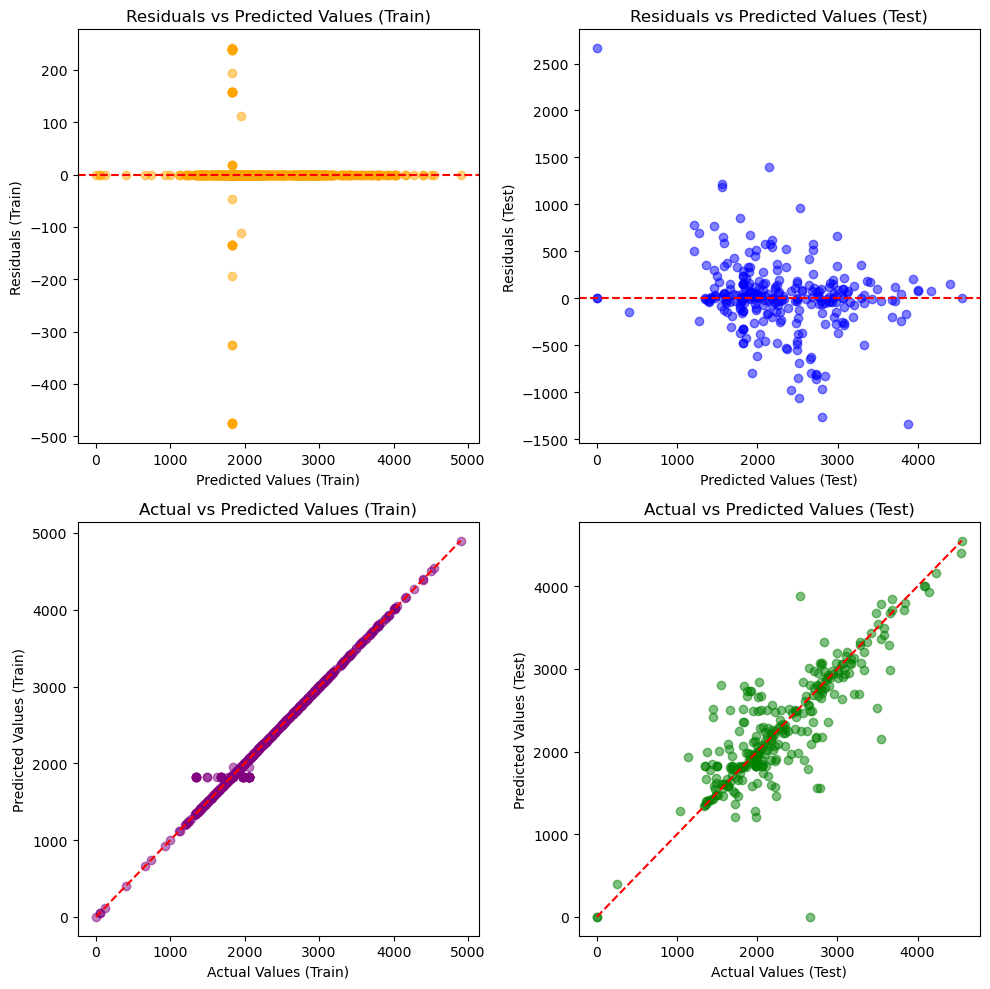

{'Model': 'Decision Tree',
 'Training Time (s)': 8.734110355377197,
 'RMSE Train': 62.75153327964148,
 'RMSE Test': 384.3819261850408,
 'R2 Train': 0.9923046372362894,
 'R2 Test': 0.7075068313496324,
 'MAE Train': 13.566958295819894,
 'MAE Test': 233.625554978954,
 'Mean Residual Train': 5.191179804640001e-15,
 'Mean Residual Test': 9.541544138845651,
 'MAPE Train': 0.008080547056358725,
 'MAPE Test': 0.11203734621384548}

In [68]:
dt_results = evaluate_model(DecisionTreeRegressor(random_state=42), 'Decision Tree')
results_df3.append(dt_results)
dt_results

### XGBoost

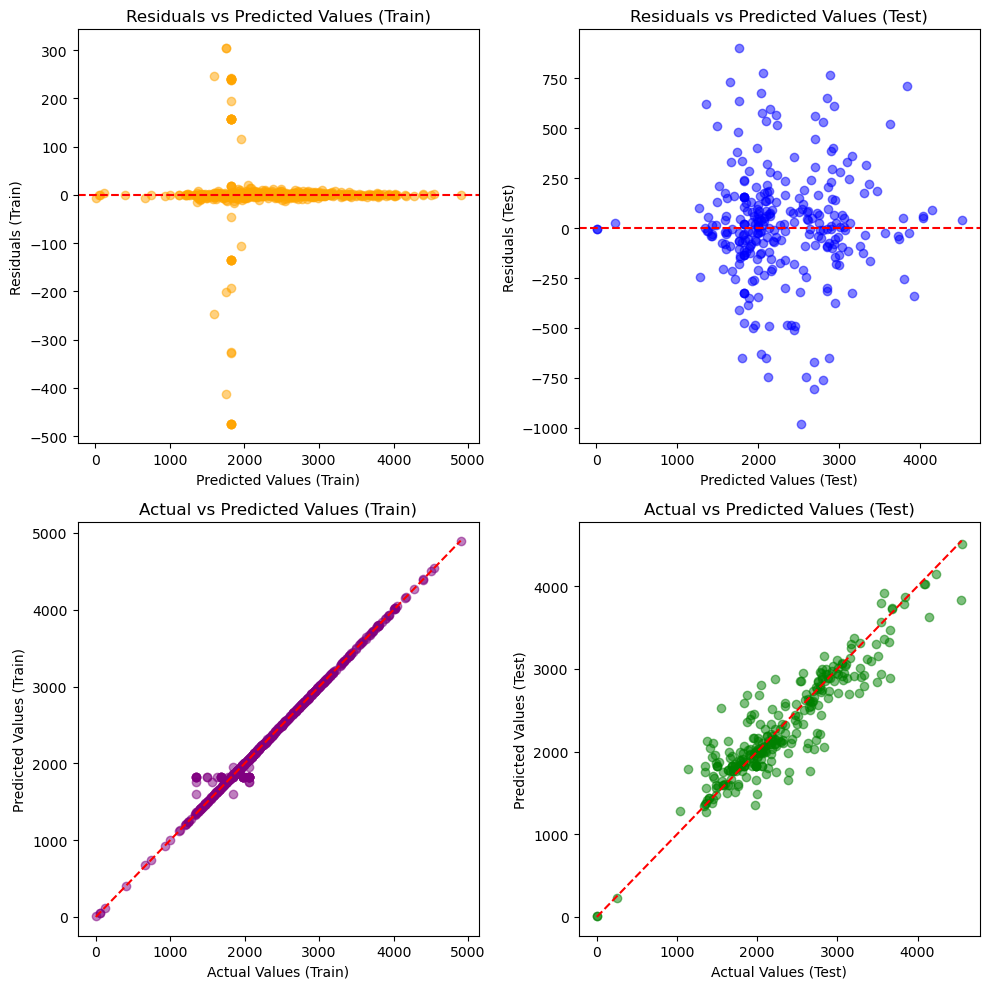

{'Model': 'XGBoost',
 'Training Time (s)': 20.887755870819092,
 'RMSE Train': 62.99863208022959,
 'RMSE Test': 279.2535989210037,
 'R2 Train': 0.992244869374943,
 'R2 Test': 0.8456213042421659,
 'MAE Train': 14.720401779520275,
 'MAE Test': 193.18727435456947,
 'Mean Residual Train': -0.003307334545721928,
 'Mean Residual Test': 11.136313374160874,
 'MAPE Train': 23161567215167.13,
 'MAPE Test': 200946670158869.88}

In [69]:
xgb_results = evaluate_model(XGBRegressor(random_state=42), 'XGBoost')
results_df3.append(xgb_results)
xgb_results

### Gradien Boosting

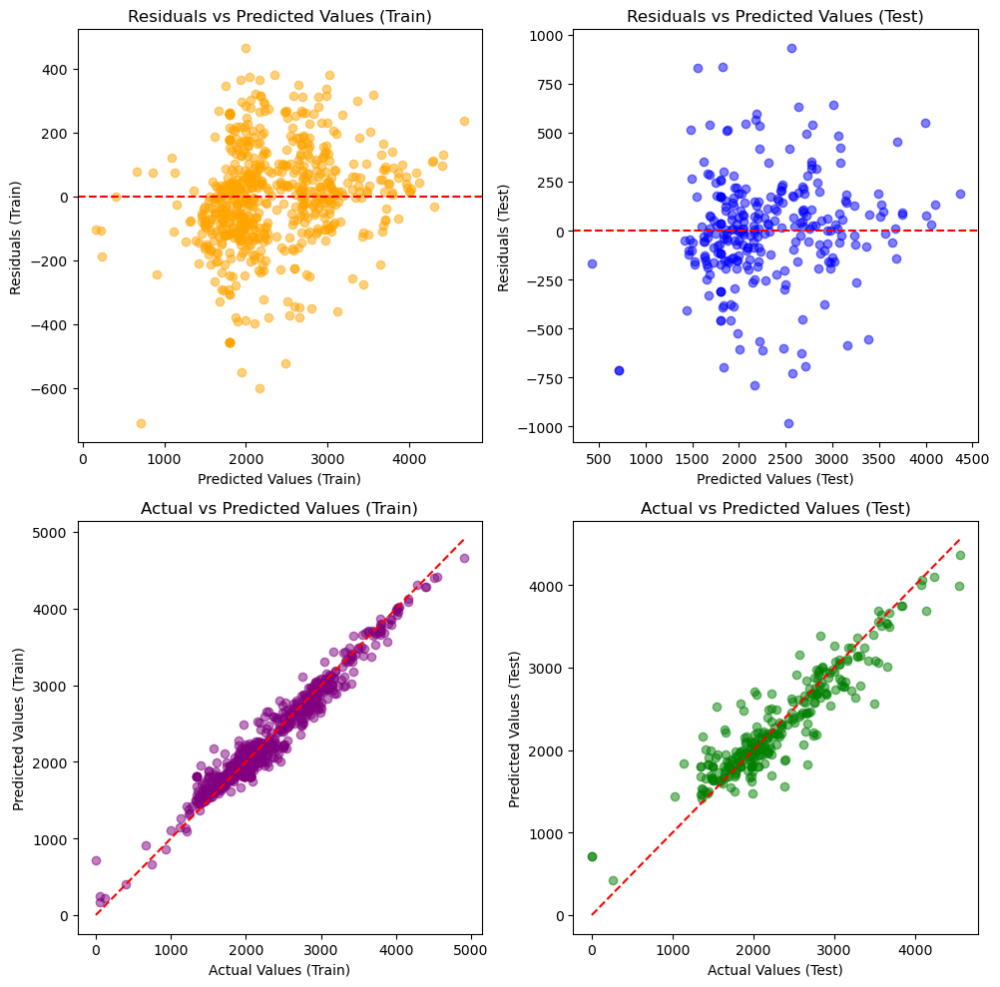

{'Model': 'Gradient Boosting',
 'Training Time (s)': 17.05818223953247,
 'RMSE Train': 140.07401063943817,
 'RMSE Test': 274.40960920803815,
 'R2 Train': 0.9612686509677816,
 'R2 Test': 0.8509306216163227,
 'MAE Train': 104.17778335469575,
 'MAE Test': 195.9206058300117,
 'Mean Residual Train': -5.900641044607469e-14,
 'Mean Residual Test': 3.8328592953306706,
 'MAPE Train': 3855037284195368.0,
 'MAPE Test': 2.2727027282376796e+16}

In [70]:
gb_results = evaluate_model(GradientBoostingRegressor(random_state=42), 'Gradient Boosting')
results_df3.append(gb_results)
gb_results

### Support Vector Regressor

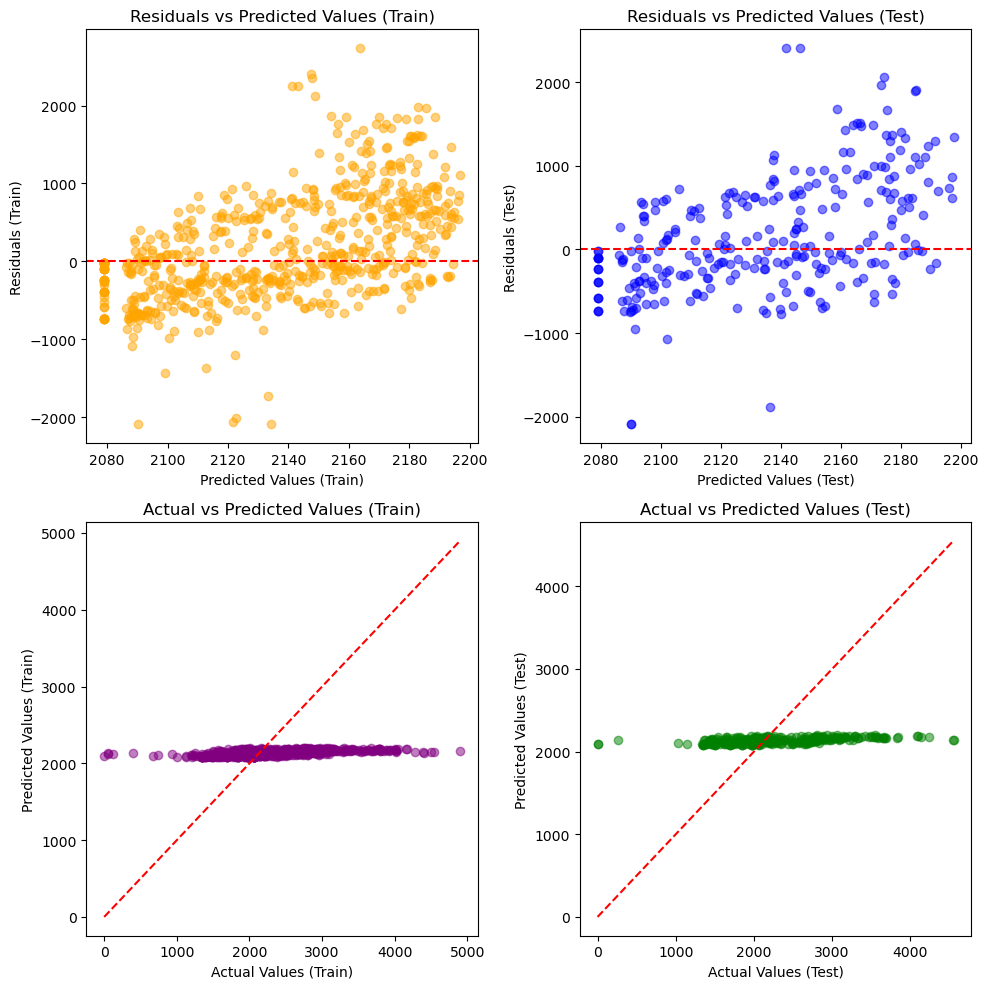

{'Model': 'Support Vector Regressor',
 'Training Time (s)': 12.555134296417236,
 'RMSE Train': 720.1974797870861,
 'RMSE Test': 711.4569964966615,
 'R2 Train': -0.014759915399857179,
 'R2 Test': -0.0020447547182600445,
 'MAE Train': 547.2191669225344,
 'MAE Test': 539.7623369169579,
 'Mean Residual Train': 172.3523011079304,
 'Mean Residual Test': 163.82900616325136,
 'MAPE Train': 1.4589486173022678e+16,
 'MAPE Test': 6.6764436555521816e+16}

In [71]:
svr_results = evaluate_model(SVR(), 'Support Vector Regressor')
results_df3.append(svr_results)
svr_results

### Bayesian Ridge

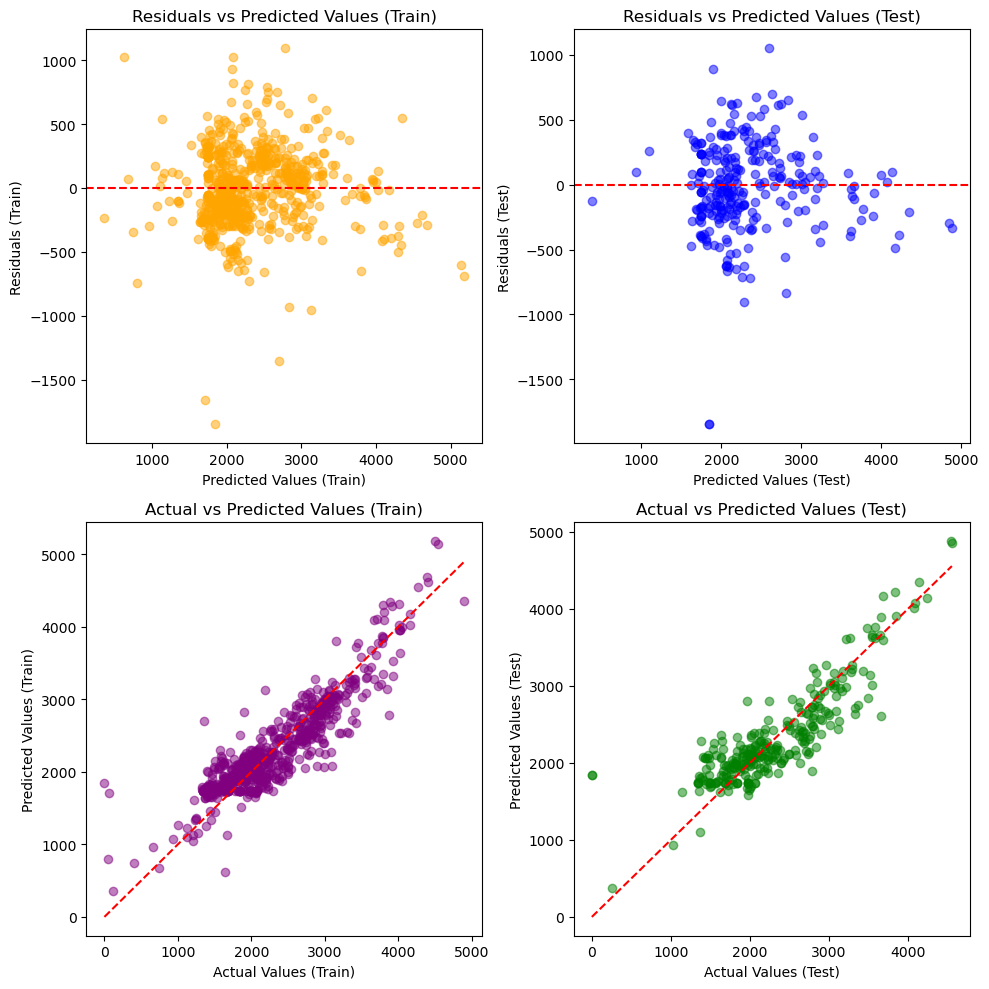

{'Model': 'Bayesian Ridge',
 'Training Time (s)': 8.695818424224854,
 'RMSE Train': 304.9920415855042,
 'RMSE Test': 350.86507880281516,
 'R2 Train': 0.8178800288513819,
 'R2 Test': 0.7562918230867824,
 'MAE Train': 233.54898166990824,
 'MAE Test': 260.71348400682666,
 'Mean Residual Train': 3.052413725128321e-13,
 'Mean Residual Test': -18.371502335660143,
 'MAPE Train': 1.2462114006606534e+16,
 'MAPE Test': 5.901204727085292e+16}

In [72]:
br_results = evaluate_model(BayesianRidge(), 'Bayesian Ridge')
results_df3.append(br_results)
br_results

### CatBoost Regressor

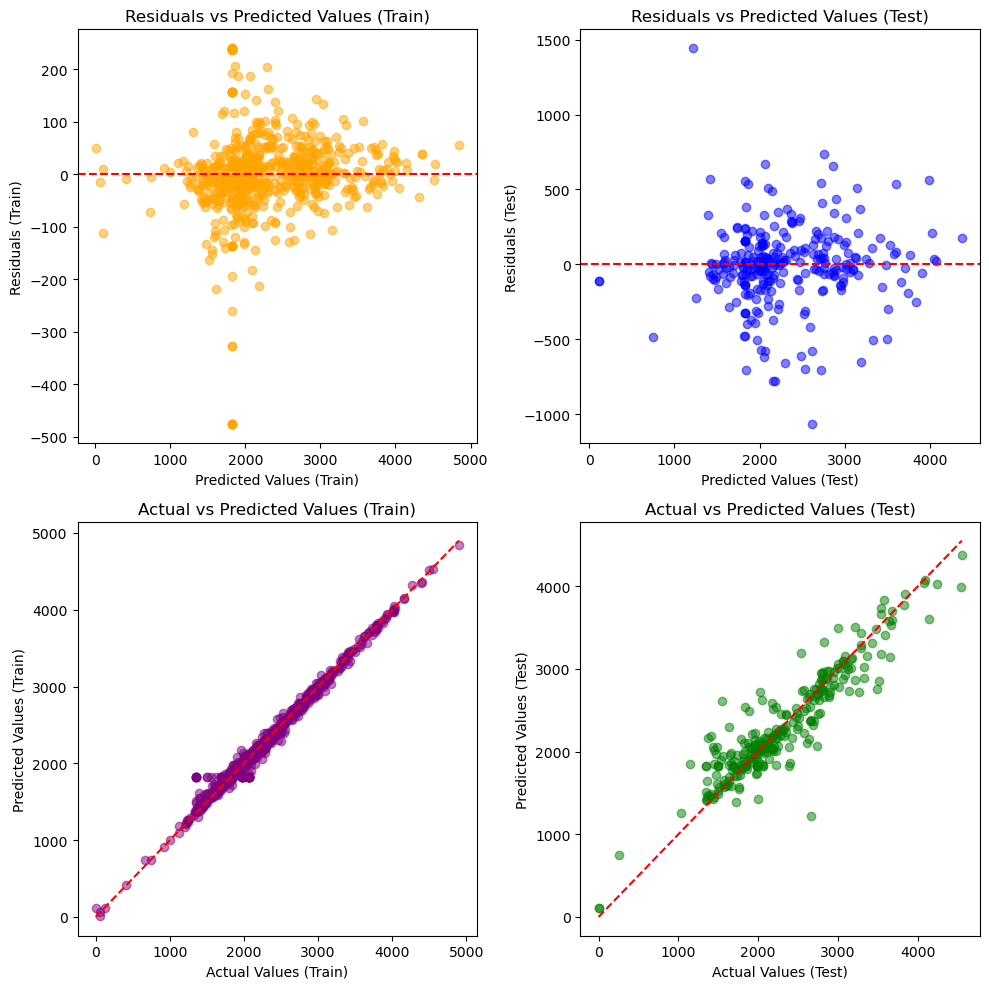

{'Model': 'CatBoost Regressor',
 'Training Time (s)': 105.34405732154846,
 'RMSE Train': 76.49394597290701,
 'RMSE Test': 270.4132975797899,
 'R2 Train': 0.9885235569645863,
 'R2 Test': 0.8552408920115167,
 'MAE Train': 44.25013088011395,
 'MAE Test': 181.4164834178264,
 'Mean Residual Train': -0.053221520042927524,
 'Mean Residual Test': -7.864668894994316,
 'MAPE Train': 651619353870624.4,
 'MAPE Test': 3559553681252686.0}

In [73]:
cb_results = evaluate_model(CatBoostRegressor(random_state=42, silent=True), 'CatBoost Regressor')
results_df3.append(cb_results)
cb_results

### Extra Trees Regressor

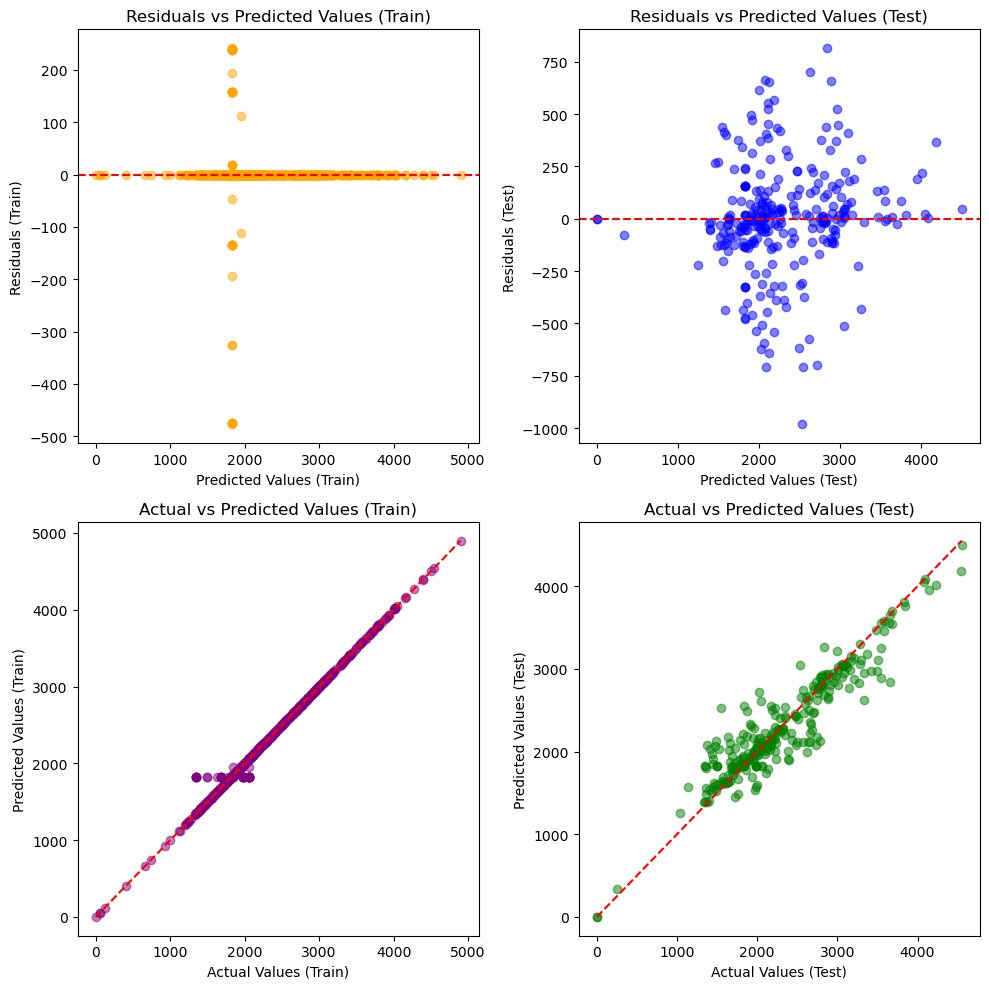

{'Model': 'Extra Trees Regressor',
 'Training Time (s)': 16.90877676010132,
 'RMSE Train': 62.75153327964148,
 'RMSE Test': 259.68845664610984,
 'R2 Train': 0.9923046372362894,
 'R2 Test': 0.86649574718407,
 'MAE Train': 13.566958295819875,
 'MAE Test': 177.41611457072017,
 'Mean Residual Train': -1.5227460760277336e-14,
 'Mean Residual Test': 2.659621461108217,
 'MAPE Train': 0.008080547056358724,
 'MAPE Test': 0.08624476777968153}

In [74]:
et_results = evaluate_model(ExtraTreesRegressor(random_state=42), 'Extra Trees Regressor')
results_df3.append(et_results)
et_results

## Hasil: Baseline

In [75]:
results_df = pd.DataFrame(results_df3)

results_df['RMSE Difference'] = results_df['RMSE Test'] - results_df['RMSE Train']
results_df['R2 Difference'] = results_df['R2 Test'] - results_df['R2 Train']
results_df['MAE Difference'] = results_df['MAE Test'] - results_df['MAE Train']
results_df['MAPE Difference'] = results_df['MAPE Test'] - results_df['MAPE Train']

# Menentukan urutan kolom yang diinginkan
columns_order = [
    'Model', 'Training Time (s)', 
    'RMSE Train', 'RMSE Test', 'RMSE Difference',
    'R2 Train', 'R2 Test', 'R2 Difference',
    'MAE Train', 'MAE Test', 'MAE Difference',
    'Mean Residual Train', 'Mean Residual Test',
    'MAPE Train', 'MAPE Test', 'MAPE Difference'
]

# Mengatur urutan kolom dan mengurutkan hasil berdasarkan beberapa metrik
results_df = results_df[columns_order].sort_values(
    by=['MAE Difference'],
    ascending=[True]
)

pd.options.display.float_format = '{:.4f}'.format
# Tampilkan DataFrame hasil
results_df

,Model,Training Time (s),RMSE Train,RMSE Test,RMSE Difference,R2 Train,R2 Test,R2 Difference,MAE Train,MAE Test,MAE Difference,Mean Residual Train,Mean Residual Test,MAPE Train,MAPE Test,MAPE Difference
8,Support Vector Regressor,12.5551,720.1975,711.4570,-8.7405,-0.0148,-0.0020,0.0127,547.2192,539.7623,-7.4568,172.3523,163.8290,14589486173022678.0000,66764436555521816.0000,52174950382499136.0000
2,Ridge,8.1664,312.6993,347.7770,35.0778,0.8087,0.7606,-0.0481,237.8053,254.8663,17.0610,0.0000,-12.0610,13110022194097974.0000,61745018042961120.0000,48634995848863144.0000
3,Lasso,8.9904,306.5120,349.3120,42.8000,0.8160,0.7584,-0.0576,235.3213,257.8944,22.5731,0.0000,-17.5546,13036561742897088.0000,63111285680449656.0000,50074723937552568.0000
4,Elastic Net,8.3780,441.2743,467.9692,26.6949,0.6182,0.5665,-0.0517,356.0789,379.6896,23.6107,0.0000,21.2991,13648921146107792.0000,63961532731094840.0000,50312611584987048.0000
9,Bayesian Ridge,8.6958,304.9920,350.8651,45.8730,0.8179,0.7563,-0.0616,233.5490,260.7135,27.1645,0.0000,-18.3715,12462114006606534.0000,59012047270852920.0000,46549933264246384.0000
1,Linear Regression,8.2248,303.5084,354.7762,51.2678,0.8197,0.7508,-0.0688,232.6852,264.4764,31.7912,-0.0000,-20.9765,12015279576740702.0000,57823178723368824.0000,45807899146628120.0000
7,Gradient Boosting,17.0582,140.0740,274.4096,134.3356,0.9613,0.8509,-0.1103,104.1778,195.9206,91.7428,-0.0000,3.8329,3855037284195368.0000,22727027282376796.0000,18871989998181428.0000
0,Random Forest,25.4818,120.3526,282.9362,162.5836,0.9716,0.8415,-0.1301,78.9245,191.6897,112.7652,-3.1707,1.1532,4320919368512925.5000,22488293543565568.0000,18167374175052644.0000
10,CatBoost Regressor,105.3441,76.4939,270.4133,193.9194,0.9885,0.8552,-0.1333,44.2501,181.4165,137.1664,-0.0532,-7.8647,651619353870624.3750,3559553681252686.0000,2907934327382061.5000
11,Extra Trees Regressor,16.9088,62.7515,259.6885,196.9369,0.9923,0.8665,-0.1258,13.5670,177.4161,163.8492,-0.0000,2.6596,0.0081,0.0862,0.0782


Data tersebut diurutkan berdasarkan MAE Test terkecil, dengan syarat perbedaan score dengan MAE Train tidak terlalu besar. Sehingga dapat disimpulkan 4 model terbaik pada dataset dengan treatment feature selection: Ridge, Lasso, Linear Regression, dan Bayesian Ridge. Namun hasil ini tidak jauh berbeda dan tidak jauh lebih baik daripada hasil evaluasi dataset tanpa perlakuan apa-apa. 